### <p style="background-color:#627D50;color:#D1CABD;font-size:110%;text-align:center;border-radius:20px 60px;  border: 10px solid #cfcfcf;  padding-top: 10px;  padding-left: 10px;  padding-right: 10px; padding-bottom: 10px;  border-radius: 80px 20px;line-height: 1.2em; margin-bottom: 10px;"> **Projet 7** : Implémentez un modèle de scoring </p>

<img src="pret_depenser.png" align="right" alt="Alternative text" />

La société financière, nommée **"Prêt à dépenser"**, propose des crédits à la consommation pour des
personnes ayant peu ou pas du tout d'historique de prêt.

L'entreprise souhaite mettre en œuvre **un outil de “scoring crédit”** pour calculer la qu'un client
rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc
développer **un algorithme de classification** en s'appuyant sur des sources de données variées (données
comportementales, données provenant d'autres institutions financières, etc.)


### Sommaire

Biblio
Chargement des données
Position du problème
Connexion MLFlow
Split des données
Normalisation des données
Aucun rééquilibrage
Rééquilibrage avec class_weight
Rééquilibrage avec Sur-échantillonnage : SMOTE
Rééquilibrage avec Sous-échantillonnage : Tomek Links
RandomUnderSampler
Bilan l'équilibrage
Modèles de classification

#### Biblio

In [4]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


In [2]:
#!pip install mlflow

In [3]:
#!{sys.executable} -m pip install mlflow

In [4]:
#!{sys.executable} -m pip install evidently

In [7]:
import numpy as np
import pandas as pd
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from contextlib import contextmanager
import importlib

import pickle
import mlflow
import shap

import math
from termcolor import colored
import time

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score 
from sklearn.metrics import classification_report, confusion_matrix, roc_curve

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.combine import SMOTETomek
import re

import mlflow.sklearn


from evidently.report import Report
from evidently.metrics import DataDriftTable, DatasetDriftMetric
# pd.options.display.max_columns = 200
# np.random.seed(0)

In [9]:
import os
import pandas as pd
import numpy as np
import datetime, time
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.model_selection import train_test_split
# Plotly
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots


RANDOM_STATE = 42
class clr:
    start    = '\033[93m' + '\033[1m'
    color    = '\033[93m'
    end      = '\033[0m'
    
import sys
def is_colab_environment():
    # Vérifier si le module 'google.colab' est présent dans la liste des modules importés
    return 'google.colab' in sys.modules

# Exemple d'utilisation
if is_colab_environment():
    print("Le code s'exécute dans l'environnement Google Colab.")
else:
    print("Le code s'exécute dans un environnement local.")

if is_colab_environment():
    from google.colab import drive
    drive.mount('/content/drive')

Le code s'exécute dans un environnement local.


In [20]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
import seaborn as sns
import pandas as pd
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix

# Plotly
# import plotlypython.exe -m pip install --upgrade pip
import plotly.graph_objects as go
from plotly.subplots import make_subplots

font_title = {'family': 'serif', 'color': '#114b98', 'weight': 'bold', 'size': 16, }
font_title2 = {'family': 'serif', 'color': '#114b98', 'weight': 'bold', 'size': 12, }
font_title3 = {'family': 'serif', 'color': '#4F6272', 'weight': 'bold', 'size': 10, }

mycolors = ["black", "hotpink", "b", "#4CAF50"]
AllColors = ['#99ff99', '#66b3ff', '#4F6272', '#B7C3F3', '#ff9999', '#ffcc99', '#ff6666', '#DD7596', '#8EB897',
             '#c2c2f0', '#DDA0DD', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2',
             '#7f7f7f', '#bcbd22', '#17becf', '#e41a1c', '#377eb8', '#4daf4a', '#984ea3', '#ff7f00', '#ffff33',
             '#a65628', '#f781bf', "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7",
             "#000000"]
# date
from datetime import time


class clr:
    start = '\033[93m' + '\033[1m'
    color = '\033[93m'
    end = '\033[0m'


random_state = 42
SAVE_IMAGES = True
# -------------------------------------------------------------------------------------------
#  Reglages
# --------------------------------------------------------------------------------------------

import sys


def is_colab_environment():
    # Vérifier si le module 'google.colab' est présent dans la liste des modules importés
    return 'google.colab' in sys.modules


# Exemple d'utilisation
if is_colab_environment():
    print("Le code s'exécute dans l'environnement Google Colab.")
else:
    print("Le code s'exécute dans un environnement local.")


# -------------------------------------------------------------------------------------------
#  Fonctions qui gèrent les chemins
# --------------------------------------------------------------------------------------------


def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)


def os_path_join(folder, file):
    """
    Remplacement pour `os.path.join(folder, file)` sur Windows
    """
    return f'{folder}/{file}'


# Configuration des chemins de dossiers pour les différents environnements

if not is_colab_environment():
    PROJ_FOLDER = 'C:/Users/Fane0763/OpenClassroom/OC Projet 7'
    DATA_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'bases')
    OUT_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'out_put')
    GRAPH_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'Graphs')  # graphique pour les diapos

# Définition des chemins de dossiers pour l'environnement Colab
if is_colab_environment():
    # Colaboratory - décommentez les 2 lignes suivantes pour connecter à votre drive
    # from google.colab import drive
    # drive.mount('/content/drive')
    PROJ_FOLDER = '/content/drive/MyDrive/OC-Projet-7'
    DATA_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'bases')
    OUT_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'out_put')
    GRAPH_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'Graphs')  # graphique pour les diapos


# imgPath = f'{GRAPH_FOLDER}/'

# -------------------------------------------------------------------------------------------
# Sauvegarder les graphiques
# -------------------------------------------------------------------------------------------

def fig_name_cleaning(fig_name: str) -> str:
    """Enlever les caractères interdits dans les filenames ou filepaths"""
    return fig_name.replace(' ', '_').replace(':', '-').replace(
        '.', '-').replace('/', '_').replace('>', 'gt.').replace('<', 'lt.')


def to_png(fig_name=None) -> None:
    """
    Register the current plot figure as an image in a file.
    Must call plt.show() or show image (by calling to_png() as last row in python cell)
    to apply the call 'bbox_inches=tight', to be sure to include the whole title / legend
    in the plot area.
    """

    def get_title() -> str:
        """find current plot title (or suptitle if more than one plot)"""
        if plt.gcf()._suptitle is None:  # noqa
            return plt.gca().get_title()
        else:
            return plt.gcf()._suptitle.get_text()  # noqa

    if SAVE_IMAGES:
        if fig_name is None:
            fig_name = get_title()
        elif len(fig_name) < 9:
            fig_name = f'{fig_name}_{get_title()}'
        fig_name = fig_name_cleaning(fig_name)
        print(f'"{fig_name}.png"')
        plt.gcf().savefig(
            # f'{IMAGE_FOLDER}/{fig_name}.png', bbox_inches='tight')
            os_path_join(f'{GRAPH_FOLDER}', f'{fig_name}.png'), bbox_inches='tight')


# -------------------------------------------------------------------------------------------
# Nom d'une base en string
# -------------------------------------------------------------------------------------------

def get_dataframe_name(df):
    name = [x for x in globals() if globals()[x] is df]
    return name[0]


def namestr(df):
    name = [name for name in globals() if globals()[name] is df]
    return name[0] if name else None


# -------------------------------------------------------------------------------------------
# Aperçu de la base de données pandas dataframe
# -------------------------------------------------------------------------------------------

def apercu(datasets, titles):
    # Importations
    # import pandas as pd

    # datasets = [customers_df, geolocation_df, items_df, payments_df, reviews_df, orders_df, products_df, sellers_df,
    # category_translation_df]
    # titles=[namestr(data,globals()) for data in datasets]
    data_summary = pd.DataFrame({}, )
    data_summary['datasets'] = titles
    data_summary['columns'] = [', '.join([col for col in data.columns]) for data in datasets]
    data_summary['nb_lignes'] = [data.shape[0] for data in datasets]
    data_summary['nb_colonnes'] = [data.shape[1] for data in datasets]
    data_summary['doublons'] = [data.duplicated().sum() for data in datasets]
    data_summary['nb_NaN'] = [data.isnull().sum().sum() for data in datasets]
    data_summary['NaN_Columns'] = [', '.join([col for col, null in data.isnull().sum().items() if null > 0]) for data in
                                   datasets]
    return data_summary.style.background_gradient(cmap='YlGnBu')


def apercu2(datasets, titles):
    data_summary = pd.DataFrame({}, )
    data_summary['datasets'] = titles
    data_summary['nb_lignes'] = [data.shape[0] for data in datasets]
    data_summary['nb_colonnes'] = [data.shape[1] for data in datasets]
    data_summary['doublons'] = [data.duplicated().sum() for data in datasets]
    data_summary['nb_NaN'] = [data.isnull().sum().sum() for data in datasets]

    return data_summary.style.background_gradient(cmap='YlGnBu')


def infoDataFrame(data):
    """
    Cette fonction affiche les stats relatives a la dataframe en entrée
    :param data: dataframe pandas
    :return: dataframe avec nombre de lignes et de colonnes et des infos sur le dataframe
    """
    display(Markdown('------------------------------------'))
    display(Markdown('#### Info générales sur la base : {0}'.format(namestr(data))))
    display(Markdown('------------------------------------'))
    # print('--------------------------------------------------------------------------')
    # print('Info générales sur la base : {0}'.format(namestr(data, globals())))
    data.info()
    print(" ")
    print(" ")
    nb_ligne = data.shape[0]
    nb_colonne = data.shape[1]
    print('Le jeu de données {} a {} lignes et {} colonnes.'.format(namestr(data),
                                                                    nb_ligne, nb_colonne))
    df = pd.DataFrame({'Variable': ['lignes', 'colonnes'], 'nombre': [nb_ligne, nb_colonne]})
    print(" ")
    # display(df)
    return df


def Explodetuple(m):
    liste1 = []
    for t in range(m):
        if t in [0, 1]:
            liste1.append(0.1)
        else:
            liste1.append(0)
    return tuple(liste1)


def percentFreq(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct * total / 100.0))
        # return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return '{:.1f}%({v:d})'.format(pct, v=val)

    return my_format


def repartitionTypeVar(data, figsize=(6, 3),
                       title="Repartition par types de variables \n",
                       graphName=None):
    df = data.dtypes.value_counts()
    L = len(df)
    labels = list(df.index)
    sizes = list(df)
    # print(labels,"\n",sizes)
    explode = Explodetuple(L)
    colors = AllColors[:L]
    fig1, ax1 = plt.subplots(figsize=figsize)
    ax1.pie(sizes, explode=explode, labels=labels, colors=colors,
            autopct=percentFreq(df), shadow=True, startangle=0)
    # Equal aspect ratio ensures that pie is drawn as a circle
    ax1.axis('equal')
    plt.tight_layout()
    plt.title(label=title, fontdict=font_title)
    plt.legend()
    if graphName:
        plt.savefig(os_path_join(f'{GRAPH_FOLDER}', graphName),
                    bbox_inches='tight')
    plt.show()
    plt.close()
    df = df.reset_index()
    df.columns = ['Types de variables', 'Nombre']
    display(df.reset_index(drop=True))


# -------------------------------------------------------------------------------------------
# Taux de remplissage d'un dataframe
# -------------------------------------------------------------------------------------------
def fillingRate(data: pd.DataFrame, GRAPH_FOLDER, grahName: str = None):
    filled = data.notna().sum().sum() / (data.shape[0] * data.shape[1])
    missing = data.isna().sum().sum() / (data.shape[0] * data.shape[1])
    taux = [filled, missing]
    labels = ["%filled", "%missing"]
    explode = (0.1, 0)
    fig, ax = plt.subplots(figsize=(5, 5))
    plt.title("Taux de completion \n", fontdict=font_title)
    ax.axis("equal")
    ax.pie(taux, explode=explode, labels=labels, autopct='%1.2f%%', shadow=True, )
    plt.legend(labels)
    if grahName:
        plt.savefig(os_path_join(GRAPH_FOLDER, grahName), bbox_inches='tight')
    plt.show()
    plt.close()


# -------------------------------------------------------------------------------------------
# Recherche de liste de variables a travers des suffixes
# -------------------------------------------------------------------------------------------

def searchfeature(data, suffix):
    varList = [col for col in data.columns if suffix in col]
    return varList


# -------------------------------------------------------------------------------------------
# Liste des  fichiers et tailles
# -------------------------------------------------------------------------------------------
def get_size_str(octets):
    """
    Get size of file in octets
    """
    g_b = round(octets / 2 ** 30, 2)
    m_b = round(octets / 2 ** 20, 2)
    k_b = round(octets / 2 ** 10, 2)
    if g_b > 1:
        ret = f'{g_b} Go'
    elif m_b > 1:
        ret = f'{m_b} Mo'
    elif k_b > 1:
        ret = f'{k_b} ko'
    else:
        ret = f'{octets} octets'
    return ret


def list_files_and_sizes(directory_path):
    file_list = []
    size_list = []

    for filename in os.listdir(directory_path):
        file_path = os_path_join(directory_path, filename)
        if os.path.isfile(file_path):
            file_list.append(filename)
            size_list.append(get_size_str(os.path.getsize(file_path)))

    data = {'File Name': file_list, 'File Size': size_list}
    df = pd.DataFrame(data)
    return df


# --------------------------------------------------------------------
# -- CREATION DATAFRAME DES VALEURS MANQUANTES
# --------------------------------------------------------------------


def nan_df_create(data):
    '''
    Function to create a dataframe of percentage of NaN values for each column of the dataframe
    Inputs:
        dat
            DataFrame

    Returns:
        DataFrame of NaN percentages
    '''
    nan_percentages = data.isna().sum() * 100 / len(data)
    df = pd.DataFrame({'column': nan_percentages.index,
                       'percent': nan_percentages.values})

    # sorting the dataframe by decreasing order of percentage of NaN values
    df.sort_values(by='percent', ascending=False, inplace=True)

    return df


# --------------------------------------------------------------------
# -- REPRESENTATION BARPLOT DES VALEURS MANQUANTES PAR VARIABLE
# --------------------------------------------------------------------


def plot_nan_percent(df_nan, title_name, tight_layout=True, figsize=(20, 8),
                     grid=False, rotation=90, fontsize=12):
    '''
    Function to plot Bar Plots of NaN percentages for each Column with missing values

    Inputs:
        df_nan:
            DataFrame of NaN percentages
        title_name:
            Name of table to be displayed in title of plot
        tight_layout: bool, default = True
            Whether to keep tight layout or not
        figsize: tuple, default = (20,8)
            Figure size of plot
        grid: bool, default = False
            Whether to draw gridlines to plot or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
    '''
    # sns.set(style='white', font_scale=1.2)
    # checking if there is any column with NaNs or not.
    if df_nan.percent.sum() != 0:
        print(
            f"Nombre de variables avec valeurs manquantes : {df_nan[df_nan['percent'] != 0].shape[0]}")

        # plotting the Bar-Plot for NaN percentages (only for columns with
        # Non-Zero percentage of NaN values)
        plt.figure(figsize=figsize, tight_layout=tight_layout)
        sns.barplot(x='column', y='percent',
                    data=df_nan[df_nan['percent'] > 0])
        plt.xticks(rotation=rotation)
        plt.xlabel('Nom de variable', fontsize=fontsize)
        plt.ylabel('% de valeurs NaN', fontsize=fontsize)
        plt.xticks(fontsize=fontsize)
        plt.yticks(fontsize=fontsize)
        plt.title(f'Pourcentage de valeurs NaN dans {title_name}', fontsize=fontsize + 4)
        if grid:
            plt.grid()
        plt.show()
    else:
        print(
            f"Le dataframe {title_name} ne contient pas de valeurs manquantes.")


def data_duplicated(df):
    '''
    Retourne le nombres de lignes identiques.
    '''
    return df.duplicated(keep=False).sum()


def row_duplicated(df, col):
    '''
    Retourne le nombre de doublons de la variables col.
    '''
    return df.duplicated(subset=col, keep='first').sum()


def missing_cells(df):
    '''
    Calcule le nombre de cellules manquantes sur le data set total
    '''
    return df.isna().sum().sum()


def missing_cells_perc(df):
    '''Calcule le pourcentage de cellules manquantes sur le data set total'''
    return df.isna().sum().sum() / (df.size)


def missing_general(df):
    '''
    Donne un aperçu général du nombre de données manquantes dans le data frame
    '''
    print('Nombre total de cellules manquantes :', missing_cells(df))
    print('Nombre de cellules manquantes en %  : {:.2%}'.format(missing_cells_perc(df)))


def valeurs_manquantes(df):
    '''Prend un data frame en entrée et créer en sortie un dataframe contenant le nombre de valeurs manquantes
    et leur pourcentage pour chaque variables. '''
    tab_missing = pd.DataFrame(columns=['Variable', 'Missing values', 'Missing (%)'])
    tab_missing['Variable'] = df.columns
    missing_val = list()
    missing_perc = list()

    for var in df.columns:
        nb_miss = missing_cells(df[var])
        missing_val.append(nb_miss)
        perc_miss = missing_cells_perc(df[var])
        missing_perc.append(perc_miss)

    tab_missing['Missing values'] = list(missing_val)
    tab_missing['Missing (%)'] = list(missing_perc)
    return tab_missing


def drop_columns_empty(df, lim):
    '''Prend en entrée un data frame et un seuil de remplissage de données.
    Supprime chaque variable ayant un pourcentage de données manquantes supérieur à celui renseigné.
    Donne en sortie le data frame filtré avec les colonnes à garder.'''

    tab = valeurs_manquantes(df)
    columns_keep = list()
    for row in tab.iterrows():
        if float(row[1]['Missing (%)']) > float(lim):
            print('Suppression de la variable {} avec % de valeurs manquantes {}'.format(row[1]['Variable'],
                                                                                         round(float(
                                                                                             row[1]['Missing (%)']),
                                                                                             2)))

        else:
            columns_keep.append(row[1]['Variable'])

    return df[columns_keep]


def exploration_missings(data):
    print('Types de variables de :', namestr(data))
    # Affichage des types de variables dans la base.
    repartitionTypeVar(data, figsize=(7, 4),
                       graphName=f'RepartitionTypeVar_{namestr(data)}.png')
    print(clr.color + '*' * 110 + clr.end)
    print('Taux de complétion de :', namestr(data))
    print(clr.color + '*' * 110 + clr.end)
    fillingRate(data, f'{GRAPH_FOLDER}',
                f'tauxCompletion_{namestr(data)}.png')
    print(clr.color + '*' * 110 + clr.end)
    print('Heatmap des valeurs manquantes :', namestr(data))
    print(clr.color + '*' * 110 + clr.end)
    # msno.matrix(data)
    plt.figure(figsize=(15, 7))
    sns.heatmap(data.isna(), cbar=False)
    plt.show()

    print(clr.color + '*' * 110 + clr.end)
    print('Réprésentation visuelle des valeurs manquantes :', namestr(data))
    print(clr.color + '*' * 110 + clr.end)

    df_nan = nan_df_create(data)
    plot_nan_percent(df_nan, namestr(data), tight_layout=True, figsize=(50, 30),
                     grid=False, rotation=90, fontsize=12)


def exploration_dataframes(data, df_cols_desc, str_match=None):
    print('Description des variables de :', namestr(data))
    if str_match:
        df_var = df_cols_desc[df_cols_desc['Table'].str.match(str_match)]
        display(df_var)

    print('Types de variables de :', namestr(data))
    # Affichage des types de variables dans la base.
    repartitionTypeVar(data, figsize=(7, 4),
                       graphName=f'RepartitionTypeVar_{namestr(data)}.png')
    print(clr.color + '*' * 120 + clr.end)
    print('Taux de complétion de :', namestr(data))
    print(clr.color + '*' * 120 + clr.end)
    fillingRate(data, f'{GRAPH_FOLDER}',
                f'tauxCompletion_{namestr(data)}.png')
    print(clr.color + '*' * 120 + clr.end)
    print('Heatmap des valeurs manquantes :', namestr(data))
    print(clr.color + '*' * 120 + clr.end)
    # msno.matrix(data)
    sns.heatmap(data.isna(), cbar=False)

    print(clr.color + '*' * 120 + clr.end)
    print('Réprésentation visuelle des valeurs manquantes :', namestr(data))
    print(clr.color + '*' * 120 + clr.end)

    df_nan = nan_df_create(data)
    plot_nan_percent(df_nan, namestr(data), tight_layout=True, figsize=(20, 12),
                     grid=False, rotation=90, fontsize=12)


def impute_with_interpolate(dataframe):
    # Crée une copie du DataFrame d'origine pour éviter de modifier les données d'origine.
    short_cleaned_impute = dataframe.copy()
    # Parcours chaque colonne du DataFrame.
    for col_name in dataframe:
        # Utilise la méthode d'interpolation linéaire pour remplir les valeurs manquantes.
        short_cleaned_impute[col_name] = dataframe[col_name].interpolate(
            method='linear', inplace=False, limit_direction="both"
        ).ffill().bfill()
    return short_cleaned_impute


from sklearn.impute import SimpleImputer


def impute_with_interpolate2(data: pd.DataFrame):
    dataframe = data.copy()
    numeric_cols = dataframe.select_dtypes(include=np.number).columns
    categorical_cols = dataframe.select_dtypes(exclude=np.number).columns
    imputer_categorical = SimpleImputer(strategy='most_frequent')
    dataframe[categorical_cols] = imputer_categorical.fit_transform(dataframe[categorical_cols])
    dataframe[numeric_cols] = dataframe[numeric_cols].interpolate(
        method='linear', inplace=False, limit_direction="both").ffill().bfill()
    return dataframe


def colonnes_numeriques(dataframe):
    """
    Récupère la liste des colonnes numériques d'un DataFrame.
    """
    colonnes_num = dataframe.select_dtypes(include=['number']).columns.tolist()
    return colonnes_num


def colonnes_cat(dataframe):
    """
    Récupère la liste des colonnes numériques d'un DataFrame.
    """
    colonnes_cat = dataframe.select_dtypes(include=['object']).columns.tolist()
    return colonnes_cat


from sklearn.impute import KNNImputer


def impute_with_knn(data: pd.DataFrame, cols_list: list, n_neighbors=5):
    df = data.copy()  # Une copie du dataframe
    numeric_cols = df.select_dtypes(include=np.number).columns
    imputer = KNNImputer(n_neighbors=n_neighbors)  # instance de l'imputeur KNN
    df_imputed = imputer.fit_transform(df[numeric_cols])  # imputation KNN sur le DataFrame
    df_imputed = pd.DataFrame(df_imputed, columns=df.columns)  # Reconvertit en DataFrame
    return df_imputed


# --------------------------------------------------------------------
# -- AFFICHE LA LISTE DES IDENTIFIANTS UNIQUES
# --------------------------------------------------------------------

def print_unique_categories(data, column_name, show_counts=False):
    '''
    Function to print the basic stats such as unique categories and their counts for categorical variables

        Inputs:
        data: DataFrame
            The DataFrame from which to print statistics
        column_name: str
            Column's name whose stats are to be printed
        show_counts: bool, default = False
            Whether to show counts of each category or not

    '''

    print('-' * 79)
    print(
        f"Les catégories uniques de la variable '{column_name}' sont :\n{data[column_name].unique()}")
    print('-' * 79)

    if show_counts:
        print(
            f"Répartition dans chaque catégorie :\n{data[column_name].value_counts()}")
        print('-' * 79)


# --------------------------------------------------------------------
# -- BARPLOT DES VARIABLES CATEGORIELLES
# --------------------------------------------------------------------


def plot_categorical_variables_bar(data, column_name, figsize=(18, 6),
                                   percentage_display=True,
                                   plot_defaulter=True, rotation=0,
                                   horizontal_adjust=0,
                                   fontsize_percent='xx-small',
                                   palette1='Set1',
                                   palette2='Set2'):
    '''
    Function to plot Categorical Variables Bar Plots

    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display

    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    # plotting overall distribution of category
    plt.subplot(1, 2, 1)
    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title('Toutes TARGET', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    # plotting distribution of category for Defaulters
    if plot_defaulter:
        percentage_defaulter_per_category = (data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()).dropna().sort_values(ascending=False)

        plt.subplot(1, 2, 2)
        sns.barplot(x=percentage_defaulter_per_category.index,
                    y=percentage_defaulter_per_category, palette=palette2)
        plt.ylabel(
            'Pourcentage par catégorie pour les défaillants',
            fontsize=20)
        plt.xlabel(column_name, labelpad=10)
        plt.xticks(rotation=rotation, fontsize=20)
        plt.yticks(fontsize=20)
        plt.title('Défaillants seuls', pad=20, fontsize=30)

    plt.suptitle(f'Répartition de {column_name}', fontsize=40)
    plt.show()


def plot_categorical_variable_bar(data, column_name, figsize=(18, 6),
                                  percentage_display=True, rotation=0,
                                  horizontal_adjust=0,
                                  fontsize_percent='xx-small',
                                  palette1='Set1'):
    '''
    Function to plot Categorical Variables Bar Plots

    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        figsize: tuple, default = (18,6)
            Size of the figure to be plotted
        percentage_display: bool, default = True
            Whether to display the percentages on top of Bars in Bar-Plot
        plot_defaulter: bool
            Whether to plot the Bar Plots for Defaulters or not
        rotation: int, default = 0
            Degree of rotation for x-tick labels
        horizontal_adjust: int, default = 0
            Horizontal adjustment parameter for percentages displayed on the top of Bars of Bar-Plot
        fontsize_percent: str, default = 'xx-small'
            Fontsize for percentage Display

    '''

    print(
        f"Nombre de catégories uniques pour {column_name} = {len(data[column_name].unique())}")

    plt.figure(figsize=figsize, tight_layout=True)
    sns.set(style='whitegrid', font_scale=1.2)

    data_to_plot = data[column_name].value_counts().sort_values(ascending=False)
    ax = sns.barplot(x=data_to_plot.index, y=data_to_plot, palette=palette1)

    if percentage_display:
        total_datapoints = len(data[column_name].dropna())
        for p in ax.patches:
            ax.text(
                p.get_x() +
                horizontal_adjust,
                p.get_height() +
                0.005 *
                total_datapoints,
                '{:1.02f}%'.format(
                    p.get_height() *
                    100 /
                    total_datapoints),
                fontsize=fontsize_percent)

    plt.xlabel(column_name, labelpad=10)
    plt.title(f'Barplot de {column_name}', pad=20, fontsize=30)
    plt.xticks(rotation=rotation, fontsize=20)
    plt.yticks(fontsize=20)
    plt.ylabel('Nombre', fontsize=20)

    plt.show()


# --------------------------------------------------------------------
# -- PIEPLOT DES VARIABLES CATEGORIELLES
# --------------------------------------------------------------------


def plot_categorical_variables_pie(
        data,
        column_name,
        plot_defaulter=True,
        hole=0):
    '''
    Function to plot categorical variables Pie Plots
    Inputs:
        data: DataFrame
            The DataFrame from which to plot
        column_name: str
            Column's name whose distribution is to be plotted
        plot_defaulter: bool
            Whether to plot the Pie Plot for Defaulters or not
        hole: int, default = 0
            Radius of hole to be cut out from Pie Chart
    '''
    if plot_defaulter:
        cols = 2
        specs = [[{'type': 'domain'}, {'type': 'domain'}]]
        titles = ['Toutes TARGET', 'Défaillants seuls']
    else:
        cols = 1
        specs = [[{'type': 'domain'}]]
        titles = [f'Répartition de la variable {column_name}']

    values_categorical = data[column_name].value_counts()
    labels_categorical = values_categorical.index

    fig = make_subplots(rows=1, cols=cols,
                        specs=specs,
                        subplot_titles=titles)

    fig.add_trace(
        go.Pie(
            values=values_categorical,
            labels=labels_categorical,
            hole=hole,
            textinfo='percent',
            textposition='inside'),
        row=1,
        col=1)

    if plot_defaulter:
        percentage_defaulter_per_category = data[column_name][data.TARGET == 1].value_counts(
        ) * 100 / data[column_name].value_counts()
        percentage_defaulter_per_category.dropna(inplace=True)
        percentage_defaulter_per_category = percentage_defaulter_per_category.round(
            2)

        fig.add_trace(
            go.Pie(
                values=percentage_defaulter_per_category,
                labels=percentage_defaulter_per_category.index,
                hole=hole,
                textinfo='percent',
                hoverinfo='label+value'),
            row=1,
            col=2)

    fig.update_layout(title=f'Répartition de la variable {column_name}')
    fig.show()


# ----------------------------------------------------
#     Normalisation des données
# ----------------------------------------------------

from sklearn import preprocessing


def scale_dataframe(df: pd.DataFrame, scaler=None) -> pd.DataFrame:
    if scaler is None:
        scaler = preprocessing.StandardScaler()
    return pd.DataFrame(scaler.fit_transform(df), index=df.index, columns=df.columns)


from termcolor import colored
from sklearn.metrics import fbeta_score as calcul_fbeta_score
import time


def classification(best_param, X_train, y_train, X_test, y_test, algo_name, file_name=None):
    print(colored("Exécution en cours ....\n", 'blue'))

    start_time = time.time()
    model = best_param.fit(X_train, y_train)
    end_time = time.time()
    execution_time = end_time - start_time

    if file_name is None:
        pass
    else:
        # save the model to disk
        filename = file_name
        pickle.dump(model, open(filename, 'wb'))

    start_time = time.time()
    prediction = best_param.predict(X_test)
    end_time = time.time()
    prediction_time = end_time - start_time

    # prediction de probabilité d'appartenance à 0 et 1
    probability = best_param.predict_proba(X_test)
    probability_positive = probability[:, 1]
    resume_prediction_class = pd.DataFrame(
        {'cat_reel': y_test, 'cat_predit': prediction}).reset_index()

    probability_positive_class = pd.DataFrame(
        {'SK_ID_CURR': X_test.index, 'positive_probability': probability_positive})

    # print(probability_positive_class)

    print(f"Qualité de la classification {algo_name} \n ")
    accuracy = accuracy_score(y_test, prediction)
    print("L'accuracy score est de      : {}".format(round(accuracy, 5)))
    precision = precision_score(y_test, prediction,
                                average='binary')  # binary car ici 0 ou 1 si plusieurs label c'est weighted
    print('Le score de précision est de : {}'.format(round(precision, 5)))
    recall = recall_score(y_test, prediction, average='binary')
    print('Le score recall est de       : {}'.format(round(recall, 5)))

    f1 = f1_score(y_test, prediction, average='binary')
    print('Le score f1 est de           : {}'.format(round(f1, 5)))
    AUC = roc_auc_score(y_test, probability[:, 1])  # proba de na pas rembourser prêt donc d'être 1
    print('Le score AUC est de          : {}'.format(round(AUC, 5)))
    fbeta_score = calcul_fbeta_score(y_test, prediction, beta=2)

    return model, accuracy, precision, recall, f1, AUC, fbeta_score, prediction, probability, \
        execution_time, prediction_time, resume_prediction_class, probability_positive_class


def matrix_TN_FN(y_test, y_prediction):
    """
    Cette fonction retourne une matrice de confusion.
    """

    # Création de la matrice de confusion.
    df_matrice_confusion = pd.DataFrame(columns=['Predicted Negative (0)', 'Predicted Positive (1)'],
                                        index=['Real Negative (0)', 'Real Positive (1)'])

    # DataFrame de comparaison.
    df_pred_compare = pd.concat([pd.Series(y_test.reset_index(drop=True)), pd.Series(y_prediction)], axis=1)
    df_pred_compare.columns = ['Real category', 'Prediction']

    # Masque suivant les tp,tn, fp...
    mask_real_pos = (df_pred_compare['Real category'] == 1)
    mask_pred_pos = (df_pred_compare['Prediction'] == 1)

    mask_real_neg = (df_pred_compare['Real category'] == 0)
    mask_pred_neg = (df_pred_compare['Prediction'] == 0)

    # Négatif.
    true_negative = df_pred_compare[mask_real_neg & mask_pred_neg].shape[0]
    false_negative = df_pred_compare[mask_real_pos & mask_pred_neg].shape[0]

    # Positif.
    false_positive = df_pred_compare[mask_real_neg & mask_pred_pos].shape[0]
    true_positive = df_pred_compare[mask_real_pos & mask_pred_pos].shape[0]

    # Remplissage de la matrice.
    df_matrice_confusion['Predicted Negative (0)'] = ["{} (TN)".format(true_negative), "{} (FN)".format(false_negative)]
    df_matrice_confusion['Predicted Positive (1)'] = ["{} (FP)".format(false_positive), "{} (TP)".format(true_positive)]

    return df_matrice_confusion


from sklearn.metrics import roc_curve, roc_auc_score


def cf_matrix_roc_auc(y_true, y_pred, y_pred_proba, size):
    """
    This function will make a pretty plot of
     an sklearn Confusion Matrix using a Seaborn heatmap visualization + ROC Curve.
     """

    fig = plt.figure(figsize=size)
    ax1 = fig.add_subplot(221)
    ax1.title.set_text('Confusion Matrix')

    cf_matrix = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    group_names = ['True Neg (TN)', 'False Pos (FP)', 'False Neg (FN)', 'True Pos (TP)']
    group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='RdPu')
    plt.tick_params(axis='both', which='major', labelsize=10, labelbottom=False, bottom=False,
                    top=False, labeltop=True)

    AUC = roc_auc_score(y_true, y_pred_proba[:, 1])
    # plt.subplot(222)
    ax2 = fig.add_subplot(222)
    ax2.title.set_text('ROC Curve')

    fpr, tpr, thresholds = roc_curve(y_true,
                                     y_pred_proba[:, 1])  # pour la courbe ROC utilisation de la probabiilité d'être 1
    plt.plot(fpr, tpr, color='pink', linewidth=5, label='AUC = {:.4f}'.format(AUC))
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()

    print('True negative   = ', tn)
    print('False positive  = ', fp)
    print('False negative  = ', fn)
    print('True positive   = ', tp)

    return tn, fp, fn, tp


def fonction_metier(y_true, y_pred):
    '''Créer un score métier à partir de la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: gain (score métier)
    '''
    TP_coeff = 0  # Vrais positifs
    FP_coeff = -1  # Faux positifs (prédit comme faisant défaut (1) mais ne fait pas défaut (0))
    FN_coeff = -100  # Faux négatifs (prédit comme ne faisant pas défaut (0) mais font défaut (1))
    TN_coeff = 10  # Vrais négatifs

    (TN, FP, FN, TP) = confusion_matrix(y_true, y_pred).ravel()

    gain = (TP * TP_coeff + TN * TN_coeff + FP * FP_coeff + FN * FN_coeff) / (TN + FP + FN + TP)

    return gain


def score_banq(tn, fp, fn, tp, coeff_tn, coeff_fp, coeff_fn, coeff_tp):
    total = (coeff_tn * tn + coeff_fp * fp + coeff_fn * fn + coeff_tp * tp)
    # calcul du gain maximal que peut avoir la banque quand il n'y a pas de perte d'argent. C'est à dire que le modèle ne détecte que TN et les TP.
    max_gain = (tn + fp) * coeff_tn + (tp + fn) * coeff_tp
    # calcul du gain minimal (perte) que peut avoir la banque quand il n'y a pas de gain d'argent. C'est à dire que le modèle ne détecte que FN et les FP.
    min_gain = (tn + fp) * coeff_fp + (tp + fn) * coeff_fn
    # normalisation min-max feature scalling : score= (tot-min)/(max-min) https://en.wikipedia.org/wiki/Normalization_(statistics)
    score = (total - min_gain) / (max_gain - min_gain)

    return score


def score_metier_max(y_pred_proba, y_true, verbose=True):
    '''Créer un graphique permettant de déterminer quel peut être le score max en fonction du threshold.
    :param: y_pred_proba (probabilités prédites par le modèle), y_true (vraies valeurs),
    verbose (affiche le graphe ou juste le score maximal)
    :return: graphique,
    '''
    scores = []
    for threshold in np.linspace(0, 1, num=101):
        y_pred = np.where(y_pred_proba > threshold, 1, 0)
        score = fonction_metier(y_true, y_pred)
        scores.append(score)

    if verbose:
        score_max = max(scores)
        opti_threshold = np.linspace(0, 1, num=101)[scores.index(score_max)]
        y_pred = np.where(y_pred_proba > opti_threshold, 1, 0)

        print("Score métier maximum : {:.2f}".format(score_max))
        print("Threshold optimal    : {}".format(opti_threshold))

        fig, ax = plt.subplots(figsize=(6, 5))
        plt.plot(np.linspace(0, 1, num=101), scores, label="model score")
        plt.axvline(x=opti_threshold, color='k', dashes=(0.5, 1),
                    label="optimal threshold: {}".format(opti_threshold))

        plt.title("Score métier en fonction du threshold", fontsize=10)
        plt.xlabel("Thresholds", fontsize=10)
        plt.ylabel("Score métier", fontsize=10)
        plt.legend()
        plt.show()

    else:
        return max(scores)


import pickle


def display_shape(data_list: list, space=10):
    for df in data_list:
        print('{:{}}: {}'.format(namestr(df), space, df.shape))


def save_pickle(data: pd.DataFrame, filename: str, dossier: str):
    if not os.path.exists(dossier):
        os.makedirs(dossier)
    chemin = os_path_join(dossier, filename)
    with open(chemin, 'wb') as file:
        pickle.dump(data, file, pickle.HIGHEST_PROTOCOL)


def load_pickle(file_path: str):
    with open(file_path, 'rb') as file:
        data = pickle.load(file)
    return data


def load_csv(filename: str, index_var='SK_ID_CURR') -> pd.DataFrame:
    if index_var:
        data = pd.read_csv(f'{OUT_FOLDER}/{filename}').set_index(index_var)
    else:
        data = pd.read_csv(f'{OUT_FOLDER}/{filename}')
    return data


def sauvegarde_data(data, file_name, path=OUT_FOLDER, ):
    savepath = f'{OUT_FOLDER}/{file_name}'
    print('saving data')
    with timer(f'Save to {savepath}'):
        data.to_csv(savepath,
                    # index=False,
                    )


def list_pickles_files(directory: str, prefix: str = None):
    pickle_files = [filename for filename in os.listdir(directory)
                    if filename.endswith('.pickle')]

    if prefix is not None:
        pickle_files = [filename for filename in pickle_files
                        if filename.startswith(prefix)]

    return pickle_files


Le code s'exécute dans un environnement local.


In [21]:
print(OUT_FOLDER )

C:/Users/Fane0763/OpenClassroom/OC Projet 7/out_put


In [22]:
if is_colab_environment(): 
    os.chdir('/content/drive/MyDrive/OC-Projet-7')

#from  function_EDA import *

if not is_colab_environment():
    PROJ_FOLDER = '.'

if is_colab_environment():   
    PROJ_FOLDER = '/content/drive/MyDrive/OC-Projet-7'
    

DATA_FOLDER  = os_path_join(f'{PROJ_FOLDER}', 'bases')
OUT_FOLDER   = os_path_join(f'{PROJ_FOLDER}', 'out_put')
GRAPH_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'Graphs') 
MODEL_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'Models')

# Crée les dossiers spécifiés s'ils n'existent pas déjà
os_make_dir(OUT_FOLDER)
os_make_dir(GRAPH_FOLDER)  # graphique pour les diapos
imgPath=f'{GRAPH_FOLDER}/'
os_make_dir(MODEL_FOLDER)
print(GRAPH_FOLDER) 

# Données nettoyés (OUT_FOLDER)
CLEAN_DATA_FILENAME = 'cleaned_data_scoring.csv'
CLEAN_DATA_SAMPLE   = 'cleaned_data_sample.csv'  # 100,000 registres
CLEAN_DATA_TRAIN    = 'cleaned_data_train.csv'  
CLEAN_DATA_TEST     = 'cleaned_data_test.csv'  
CLEAN_DATA_FEATURES = 'cleaned_data_features.csv'  # 100 meilleur features
SAMPLE_SIZE         = 10000

os.listdir(PROJ_FOLDER)[:5]

./Graphs


['.anaconda', '.cache', '.conda', '.condarc', '.continuum']

In [23]:
!pip install ipython-autotime


In [24]:
#%load_ext autotime

### Chargement des données

In [25]:
import chardet
def detect_encoding(file_path):
    with open(file_path, 'rb') as f:
        result = chardet.detect(f.read())
    return result['encoding']

def get_dataframe_name(df):
    name = [x for x in globals() if globals()[x] is df]
    return name[0]


def namestr(df, namespace=globals()):
    name = [name for name in namespace if namespace[name] is df]
    return name[0] if name else None  # Return the first name or None if not found

In [26]:
def os_make_dir(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

def os_path_join(folder, file):
    """Remplacement pour `os.path.join(folder, file)` sur Windows"""
    return f'{folder}/{file}'
PROJ_FOLDER= '.'
OUT_FOLDER   = os_path_join(f'{PROJ_FOLDER}', 'out_put')
MODEL_FOLDER = os_path_join(f'{PROJ_FOLDER}', 'Models')

# Crée les dossiers spécifiés s'ils n'existent pas déjà
os_make_dir(OUT_FOLDER)
os_make_dir(MODEL_FOLDER)

In [27]:
from tqdm import tqdm

def load_csv_files_as_dataframes(directory_path):
    dataframes={}
    listedf=[]
    with tqdm(total=len(os.listdir(directory_path)), desc='Chargement...', unit='file') as pbar:
        for r, filename in enumerate(os.listdir(directory_path)):
            # print(r)
            if filename.endswith(".csv"):
                csv_path = os.path.join(directory_path, filename)            
                df_name = os.path.splitext(filename)[0]  # Nom du dataframe (sans extension)
                listedf.append(df_name)
                encoding = detect_encoding(csv_path)
                try:
                    globals()[df_name] = pd.read_csv(csv_path, encoding=encoding).set_index('SK_ID_CURR')
                except:
                    globals()[df_name] = pd.read_csv(csv_path, encoding=encoding)
                # globals()[df_name] = pd.read_csv(csv_path, encoding=encoding)  # Charger le fichier CSV en tant que dataframe
                dataframes[df_name] = globals()[df_name]
                pbar.update(1)

    return dataframes, listedf

datasets, titles=load_csv_files_as_dataframes(OUT_FOLDER)

Chargement...:  67%|██████▋   | 10/15 [12:29<06:14, 74.90s/file]


In [28]:
titles
# Split the data into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, stratify=y, test_size=0.2, random_state=RANDOM_SEED)

['model_performances',
 'sample_balancing',
 'test_df',
 'train_df',
 'X_test',
 'X_test_std',
 'X_train',
 'X_train_std',
 'y_test',
 'y_train']

In [29]:
y_train = np.squeeze(y_train)
y_test  = np.squeeze(y_test)
print(y_train.shape)


(246005,)


In [30]:
print(y_train.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

TARGET
0    0.91927
1    0.08073
Name: proportion, dtype: float64
TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64


In [31]:
train_df.head(3)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DEF_30_CNT_SOCIAL_CIRCLE,...,PREV_NAME_YIELD_GROUP_low_action_MEAN,PREV_PRODUCT_COMBINATION_CashStreetlow_MEAN,PREV_PRODUCT_COMBINATION_CashStreetmiddle_MEAN,PREV_PRODUCT_COMBINATION_CashXSellhigh_MEAN,PREV_PRODUCT_COMBINATION_CashXSelllow_MEAN,PREV_PRODUCT_COMBINATION_POSindustrywithinterest_MEAN,PREV_PRODUCT_COMBINATION_POSmobilewithoutinterest_MEAN,APPROVED_RATE_DOWN_PAYMENT_MAX,POS_NAME_CONTRACT_STATUS_Signed_MEAN,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,0,0,0,1,2,0,0,0.262949,0.139376,2.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,1
100003,1,0,0,1,1,0,0,0.622246,0.434471,0.0,...,0.0,0.0,0.0,0.0,0.333333,0.333333,0.0,0.100061,0.0,0
100004,0,1,1,1,2,0,0,0.555912,0.729567,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,1.0,0.212008,0.0,0


In [32]:
y_train.sort_index().head(3)

SK_ID_CURR
100002    1
100003    0
100004    0
Name: TARGET, dtype: int64

### Position du problème

Nous allons mettre en place un modèle de régression comme base puis une comparaison d'algorithmes de classification, déterminer celui qui sera le plus adapté à notre problématique (en prenant en compte le fait qu'il y ait un déséquilibre de TARGET) tout en montrant l'importance des features puis séléctionner les features pertinentes pour les visualisations sur notre dashboard.

L'objectif de ce projet est d'utiliser les données historiques des demandes de prêt pour prédire si un demandeur sera en mesure ou non de rembourser un prêt. "Il s'agit d'une classification supervisée".

apprentissage supervisé : Les étiquettes sont incluses dans les données d'apprentissage et l'objectif est de former un modèle pour apprendre à prédire les étiquettes à partir des caractéristiques. <br>
Classification : L'étiquette est une variable binaire, 0 (remboursera le prêt à temps), 1 (aura des difficultés à rembourser le prêt)".


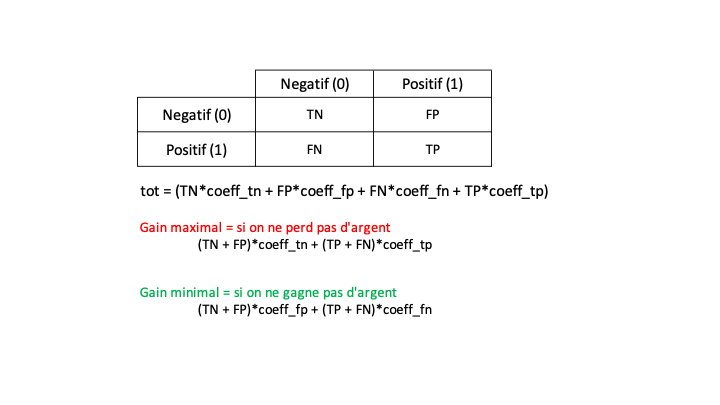**Métrique adaptée au problème de la banque:**

La banque cherche les personnes ne pouvant rembourser un prêt et lorsque ce but est atteint l'évènement est positif. Le défaut de remboursement sera donc considéré comme l'évènement positif. posifit = 1.

>TP (True Positives) : les cas où la prédiction est positive, et où la valeur réelle est effectivement positive.  <font color='blue'>LE PRET N'EST PAS ACCORDE ET LE CLIENT NE PEUT PAS REMBOURSER LE PRET</font>

>TN (True Negatives) : les cas où la prédiction est négative, et où la valeur réelle est effectivement négative. <font color='blue'>LE PRET EST ACCORDE ET LE CLIENT PEUT REMBOURSER LE PRET</font> 

>FP (False Positive) : les cas où la prédiction est positive, mais où la valeur réelle est négative.  <font color='blue'>LE PRET N'EST PAS ACCORDE MAIS LE CLIENT PEUT REMBOURSE LE PRET</font>

>FN (False Negative) : les cas où la prédiction est négative, mais où la valeur réelle est positive. <font color='blue'>LE PRET EST ACCORDE MAIS LE CLIENT NE PEUT PAS REMBOURSER LE PRET</font> 

Une banque cherche à ne pas accorder de prêt à des clients qui ne peuvent pas le rembourser (TP à maximiser). La banque ne veut pas accorder un prêt à un client qui ne peut pas le rembourser (FN à minimiser). La banque fait un déficit si elle n'accorde pas de prêt à des clients qui peuvent rembourser le prêt.


**Les algorithmes sont comparés par les métriques suivantes :** 
- **Accuracy** : somme de tous les vrais positifs et vrais négatifs qu'il divise par le nombre total d'instances. Il permet d'apporter une réponse à la question suivante : de toutes les classes positives et négatives, combien parmi elles ont été prédites correctement ? Des valeurs élevées de ce paramètre sont souhaitables.
- **Precision** :  indique le rapport entre les prévisions positives correctes et le nombre total de prévisions positives. Ce paramètre répond donc à la question suivante : sur tous les enregistrements positifs prédits, combien sont réellement positifs ? 
- **Recall/Rappel** : paramètre qui permet de mesurer le nombre de prévisions positives correctes sur le nombre total de données positives. Il permet de répondre à la question suivante : sur tous les enregistrements positifs, combien ont été correctement prédits ? La mesure vise à minimiser les faux négatifs.
- **F1 score** : moyenne harmonique de la précision et du rappel. Il équivaut au double du produit de ces deux paramètres sur leur somme. Sa valeur est maximale lorsque le rappel et la précision sont équivalents. Il est particulièrement difficile de comparer deux modèles avec une faible précision et un rappel élevé. Le contraire est également vérifié. Dans ces conditions, le score F1 permet de mesurer ces deux paramètres simultanément.
- **Fbeta score** : généralisation de la F-measure qui ajoute un paramètre de configuration appelé beta. Une valeur bêta par défaut est 1.0, ce qui est identique à la mesure F. Une valeur bêta plus petite, telle que 0.5, donne plus de poids à la précision et moins au rappel, tandis qu'une valeur bêta plus grande, telle que 2.0, donne moins de poids à la précision et plus de poids au rappel dans le calcul du score. Ici nous donnons plus de poids au rappel qui minimise les faux négatifs.
- **ROC AUC score** : mesure de façon globale la performance d'un modèle de classification. Il indique à quel point le modèle est capable de faire la distinction entre les classes. Il est égal à 1 pour un modèle parfait et à 0.5 pour un modèle non-informatif. 
- **Matrice de confusion** :



* [X] maximiser : AUC, TP, F1, recall
* [X] minimiser : FN


**Définition d'une métrique "métier"**

Il faut créer une métrique pertinente concernant notre problématique pour comparer nos algorithmes. Une société de crédit cherche à "maximiser" ses gains. 
* Accorder un crédit à quelqu'un ne pouvant pas le rembourser par la suite (FN) est synonyme de perte pour l'entreprise
* Accorder un crédit à un client qui le rembousera par la suite (TN) est un gain.
* Ne pas accorder le prêt et que le client ne peut pas rembourser (TP) n'est ni une perte, ni un gain. 
* Ne pas accorder le prêt mais que le client pouvait rembourser (FP) est une perte de client donc d'argent.

On va donc créer un score en pondérant les différents cas possibles qui sera normalisé entre 0 et 1 par une normalisation min-max feature scalling avec : 

![gain_tp_fn.png]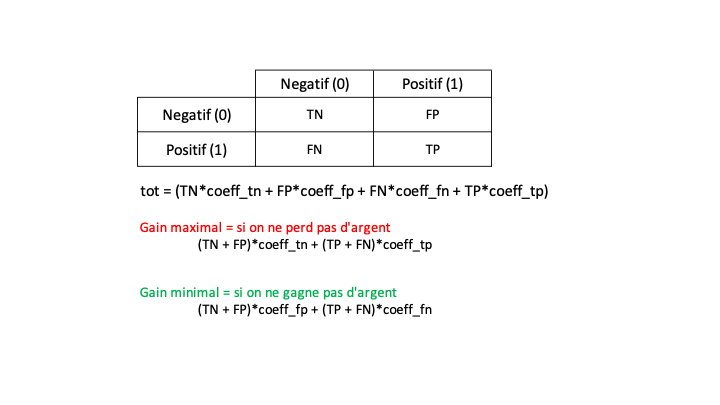(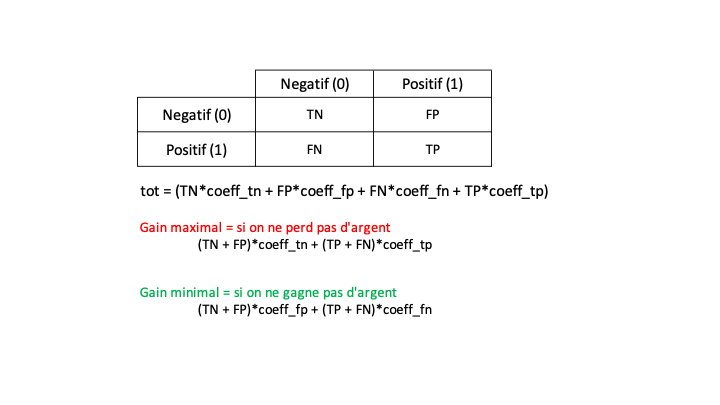)

puis gain = (tot-gain_min) / (gain_max-gain_min)


Exemple de coefficients possibles en respectant la métrique métier :
* FN ==> perte d'argent pour la banque ==> -100 
* TP ==> refus de prêt ==> 0
* TN ==> prêt accordé, gain d'argent pour la banque ==> +10
* FP ==> client perdu, perte d'argent pour la banque ==> -1

In [33]:
from sklearn.metrics import fbeta_score as calcul_fbeta_score
import time
import mlflow
import mlflow.sklearn
import logging
logging.getLogger('mlflow').setLevel(logging.ERROR)

# os_path_join(OUT_FOLDER, 'mlflowruns')
mlflow.set_tracking_uri(f'{OUT_FOLDER}/mlflowruns')

In [34]:
def classification(best_param, X_train, y_train, X_test, y_test, algo_name, file_name=None):
    
    print(colored("Exécution en cours ....\n",'blue'))

    start_time = time.time()
    model = best_param.fit(X_train, y_train)
    end_time = time.time()
    execution_time = end_time - start_time

    if file_name is None:
        pass
    else :
        # save the model to disk
        filename = file_name
        pickle.dump(model, open(filename, 'wb'))

    start_time = time.time()
    prediction = best_param.predict(X_test)
    end_time = time.time()
    prediction_time = end_time - start_time

    #prediction de probabilité d'appartenance à 0 et 1
    probability = best_param.predict_proba(X_test)
    probability_positive = probability[:, 1]
    resume_prediction_class = pd.DataFrame(
        {'cat_reel': y_test, 'cat_predit': prediction}).reset_index()

    probability_positive_class = pd.DataFrame(
        {'SK_ID_CURR': X_test.index, 'positive_probability': probability_positive})
    
    # print(probability_positive_class)
    

    print(f"Qualité de la classification {algo_name} \n ")
    accuracy = accuracy_score(y_test, prediction)
    print("L'accuracy score est de      : {}".format(round(accuracy,5)))
    precision = precision_score(y_test, prediction, average='binary')  #binary car ici 0 ou 1 si plusieurs label c'est weighted
    print('Le score de précision est de : {}'.format(round(precision,5)))
    recall = recall_score(y_test, prediction, average='binary')
    print('Le score recall est de       : {}'.format(round(recall,5)))

    f1 = f1_score(y_test, prediction, average='binary')
    print('Le score f1 est de           : {}'.format(round(f1,5)))    
    AUC = roc_auc_score(y_test, probability[:,1]) # proba de na pas rembourser prêt donc d'être 1
    print('Le score AUC est de          : {}'.format(round(AUC,5)))
    fbeta_score = calcul_fbeta_score(y_test, prediction, beta=2)
    
    return model, accuracy, precision, recall, f1, AUC, fbeta_score, prediction, probability, \
            execution_time, prediction_time, resume_prediction_class, probability_positive_class

def matrix_TN_FN(y_test, y_prediction):
    
    """
    Cette fonction retourne une matrice de confusion.
    """
    
    # Création de la matrice de confusion.
    df_matrice_confusion = pd.DataFrame(columns=['Predicted Negative (0)','Predicted Positive (1)'], 
                                        index=['Real Negative (0)','Real Positive (1)'])

    # DataFrame de comparaison.
    df_pred_compare = pd.concat([pd.Series(y_test.reset_index(drop=True)), pd.Series(y_prediction)], axis=1)
    df_pred_compare.columns = ['Real category', 'Prediction']
    
    # Masque suivant les tp,tn, fp...
    mask_real_pos  = (df_pred_compare['Real category']==1)
    mask_pred_pos  = (df_pred_compare['Prediction']==1)

    mask_real_neg  = (df_pred_compare['Real category']==0)
    mask_pred_neg  = (df_pred_compare['Prediction']==0)
    
    # Négatif.
    true_negative  = df_pred_compare[mask_real_neg & mask_pred_neg].shape[0]
    false_negative = df_pred_compare[mask_real_pos & mask_pred_neg].shape[0]

    # Positif.
    false_positive = df_pred_compare[mask_real_neg & mask_pred_pos].shape[0]
    true_positive  = df_pred_compare[mask_real_pos & mask_pred_pos].shape[0]

    # Remplissage de la matrice.
    df_matrice_confusion['Predicted Negative (0)'] = ["{} (TN)".format(true_negative), "{} (FN)".format(false_negative)]
    df_matrice_confusion['Predicted Positive (1)'] = ["{} (FP)".format(false_positive), "{} (TP)".format(true_positive)]

    
    return df_matrice_confusion

from sklearn.metrics import roc_curve, roc_auc_score

def cf_matrix_roc_auc(y_true, y_pred, y_pred_proba, size):
    '''This function will make a pretty plot of 
     an sklearn Confusion Matrix using a Seaborn heatmap visualization + ROC Curve.'''

    fig               = plt.figure(figsize=size)
    ax1               = fig.add_subplot(221)
    ax1.title.set_text('Confusion Matrix')
     
    cf_matrix         = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp    = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
    group_names       = ['True Neg (TN)', 'False Pos (FP)', 'False Neg (FN)', 'True Pos (TP)']
    group_counts      = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix, annot=labels, fmt="", cmap='Blues')
    plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, 
                    top = False, labeltop=True)

    AUC         = roc_auc_score(y_true, y_pred_proba[:,1])
    #plt.subplot(222)
    ax2         = fig.add_subplot(222)
    ax2.title.set_text('ROC Curve')
    
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba[:,1])  # pour la courbe ROC utilisation de la probabiilité d'être 1
    plt.plot(fpr, tpr, color = 'blue', linewidth=5, label = 'AUC = {:.4f}'.format(AUC))
    plt.plot([0, 1], [0, 1], color = 'darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()
 
    print('True negative   = ', tn)
    print('False positive  = ', fp)
    print('False negative  = ', fn)
    print('True positive   = ', tp)

    return tn, fp, fn, tp

In [35]:
coeff_tn = 10
coeff_fp = -1
coeff_fn = -100
coeff_tp = 0

def fonction_metier(y_true, y_pred):
    '''Créer un score métier à partir de la matrice de confusion.
    :param: y_true (vraies valeurs), y_pred (valeurs prédites par le modèle)
    :return: gain (score métier)
    '''
    TP_coeff = 0       # Vrais positifs
    FP_coeff = -1       # Faux positifs (prédit comme faisant défaut (1) mais ne fait pas défaut (0))
    FN_coeff = -100     # Faux négatifs (prédit comme ne faisant pas défaut (0) mais font défaut (1))
    TN_coeff = 10       # Vrais négatifs
    
    (TN, FP, FN, TP) = confusion_matrix(y_true, y_pred).ravel()
    
    gain = (TP*TP_coeff + TN*TN_coeff + FP*FP_coeff + FN*FN_coeff)/(TN+FP+FN+TP)
    
    return gain

def score_banq(tn, fp, fn, tp, coeff_tn, coeff_fp, coeff_fn, coeff_tp):

    total    = (coeff_tn*tn + coeff_fp*fp + coeff_fn*fn + coeff_tp*tp)
    #calcul du gain maximal que peut avoir la banque quand il n'y a pas de perte d'argent. C'est à dire que le modèle ne détecte que TN et les TP.
    max_gain = (tn + fp)*coeff_tn + (tp + fn)*coeff_tp
    #calcul du gain minimal (perte) que peut avoir la banque quand il n'y a pas de gain d'argent. C'est à dire que le modèle ne détecte que FN et les FP.
    min_gain = (tn + fp)*coeff_fp + (tp + fn)*coeff_fn
    #normalisation min-max feature scalling : score= (tot-min)/(max-min) https://en.wikipedia.org/wiki/Normalization_(statistics) 
    score    = (total - min_gain)/(max_gain - min_gain)

    return score

def score_metier_max(y_pred_proba, y_true, verbose=True):
    '''Créer un graphique permettant de déterminer quel peut être le score max en fonction du threshold.
    :param: y_pred_proba (probabilités prédites par le modèle), y_true (vraies valeurs),
    verbose (affiche le graphe ou juste le score maximal)
    :return: graphique, 
    '''
    scores = []
    for threshold in np.linspace(0, 1, num=101):
        y_pred = np.where(y_pred_proba > threshold, 1, 0)
        score  = fonction_metier(y_true, y_pred)
        scores.append(score)

    if verbose == True:
        score_max = max(scores)
        opti_threshold = np.linspace(0, 1, num=101)[scores.index(score_max)]
        y_pred = np.where(y_pred_proba > opti_threshold, 1, 0)
        
        print("Score métier maximum : {:.2f}".format(score_max))
        print("Threshold optimal    : {}".format(opti_threshold))
        
        fig, ax = plt.subplots(figsize=(6, 5))
        plt.plot(np.linspace(0, 1, num=101), scores, label="model score")
        plt.axvline(x=opti_threshold, color='k', dashes=(0.5, 1), 
                    label="optimal threshold: {}".format(opti_threshold))
        
        plt.title("Score métier en fonction du threshold", fontsize=10)
        plt.xlabel("Thresholds", fontsize=10)
        plt.ylabel("Score métier", fontsize=10)
        plt.legend()
        plt.show()
     
    else:
        return max(scores)

### Connexion MLFlow

-  MLflow permet de se connecter au serveur pour le suivi des expériences de machine learning.

- Serveur MLflow en local : Si vous utilisez le serveur MLflow en local, l'adresse est généralement http://127.0.0.1:5000/ par défaut. Cela signifie que le serveur MLflow est accessible sur votre ordinateur local (localhost) via le port 5000. Vous pouvez ouvrir votre navigateur et accéder à cette adresse pour voir l'interface utilisateur MLflow.

In [36]:
# Connexion en local
mlflow.set_tracking_uri('http://127.0.0.1:5000/')

verifier si mlflow a demarré : 

on tape ceci dans anacondaprompt **mlflow server --host 127.0.0.1 --port 5000**

et on comme resultat: **INFO:waitress:Serving on http://127.0.0.1:5000**

In [37]:
mlflow.autolog(log_input_examples=True, silent=True)

### Split des données

Avant d'encoder les variables catégoriques, et normaliser les variables, il faut diviser entre données d'entrainement et test, pour éviter 'data leakage' :

- Entrainement sur les données train
- Utilise les jeux de données test pour simuler des nouvelles observations (donc aucun partage de connaissance entre données train et test)

Pour division entre données d'entrainement et test, on a plusieurs stratégies :

- une division aléatoire (ex 80% entrainement, 20% test) : Mais on risque de mettre beaucoup de créer de bias dans le jeu d'entrainement si il n'est pas répresentatif des classes à prédire

- stratification : Essayer de garantie que le jeu de données d'entrainement ont le même distribution de classes cibles

#### Références

- <https://scikit-learn.org/stable/common_pitfalls.html#data-leakage>
- <https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html>

In [ ]:
#mlflow server --host 127.0.0.1 --port 5000

In [38]:
 def create_X_y(df: pd.DataFrame):
    #df = df.set_index('SK_ID_CURR')
    target = df['TARGET'].copy()  # Corrigé l'indentation ici
    fields = df.drop(columns=['TARGET'])
    return fields, target


X, y = create_X_y(train_df)
print(X.shape)
print(y.shape)


(307507, 100)
(307507,)


In [39]:
train_df

,CODE_GENDER,FLAG_OWN_CAR,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DEF_30_CNT_SOCIAL_CIRCLE,...,PREV_NAME_YIELD_GROUP_low_action_MEAN,PREV_PRODUCT_COMBINATION_CashStreetlow_MEAN,PREV_PRODUCT_COMBINATION_CashStreetmiddle_MEAN,PREV_PRODUCT_COMBINATION_CashXSellhigh_MEAN,PREV_PRODUCT_COMBINATION_CashXSelllow_MEAN,PREV_PRODUCT_COMBINATION_POSindustrywithinterest_MEAN,PREV_PRODUCT_COMBINATION_POSmobilewithoutinterest_MEAN,APPROVED_RATE_DOWN_PAYMENT_MAX,POS_NAME_CONTRACT_STATUS_Signed_MEAN,TARGET
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,0,0,0,1,2,0,0,0.262949,0.139376,2.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1
100003,1,0,0,1,1,0,0,0.622246,0.434471,0.0,...,0.0,0.000,0.0,0.000000,0.333333,0.333333,0.0,0.100061,0.000000,0
100004,0,1,1,1,2,0,0,0.555912,0.729567,0.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,1.0,0.212008,0.000000,0
100006,1,0,0,0,2,0,0,0.650442,0.693453,0.0,...,0.0,0.000,0.0,0.111111,0.222222,0.111111,0.0,0.217830,0.000000,0
100007,0,0,0,0,2,0,0,0.322738,0.657340,0.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.218890,0.015152,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456251,0,0,0,0,1,0,0,0.681632,0.567741,0.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.111111,0
456252,1,0,0,1,2,0,0,0.115992,0.393300,0.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.062443,0.000000,0
456253,1,0,0,0,3,0,0,0.535722,0.218859,0.0,...,0.0,0.000,0.0,0.000000,0.000000,0.000000,0.0,0.324284,0.000000,0


In [40]:
print(y_train.value_counts(normalize=True))
print(y_test.value_counts(normalize=True))

TARGET
0    0.91927
1    0.08073
Name: proportion, dtype: float64
TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64


In [41]:
from sklearn.compose import make_column_selector

cat_selector       = make_column_selector(dtype_include=object)
num_selector       = make_column_selector(dtype_include=np.number)
bool_selector      = make_column_selector(dtype_include=bool)

category_features  = cat_selector(X_train)
numerical_features = num_selector(X_train)
bool_features      = bool_selector(X_train)
target_features    = y_train.name

print(f'numerical_features : {len(numerical_features)}')
print(f'category_features  : {len(category_features)}')
print(f'bool_features      : {len(bool_features)}')
print(f'target_features    : {target_features}')


numerical_features : 66
category_features  : 0
bool_features      : 34
target_features    : TARGET


In [42]:
X_train.dtypes.value_counts()

float64    51
bool       34
int64      15
Name: count, dtype: int64

## Normalisation des données

In [43]:
X_train.dtypes.value_counts()

float64    51
bool       34
int64      15
Name: count, dtype: int64

In [44]:
X_train.select_dtypes(include=int)

,CODE_GENDER,FLAG_OWN_CAR,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18
SK_ID_CURR,,,,,,,,,,,,,,,
326316,0,1,1,1,2,0,0,1,0,0,0,0,0,0,0
158869,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0
358982,1,0,0,0,2,0,0,1,0,0,0,0,0,0,0
455697,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0
276249,1,0,0,1,2,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248136,1,0,0,0,2,0,0,1,0,0,0,0,0,0,0
331135,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0
216408,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0


In [45]:
n = 10000 

X_train = X_train.sample(n) 
X_test = X_test.sample(1000) # On peut prendre une petite taille ici 


In [46]:
X_test.index.tolist()

[272907,
 104922,
 428316,
 285348,
 439557,
 289221,
 253947,
 232922,
 179759,
 285930,
 428587,
 193109,
 317439,
 246413,
 201805,
 424139,
 340283,
 127661,
 333122,
 236067,
 430586,
 260813,
 442486,
 432471,
 398496,
 422682,
 359156,
 201570,
 437121,
 332758,
 257302,
 385317,
 111909,
 306032,
 137461,
 134429,
 446263,
 193347,
 126702,
 343792,
 218486,
 101539,
 157486,
 157307,
 211853,
 424240,
 234218,
 188891,
 160880,
 136703,
 117519,
 427333,
 453953,
 176268,
 214309,
 365745,
 256967,
 225396,
 366221,
 103188,
 440774,
 308974,
 275907,
 307377,
 450090,
 184217,
 189020,
 164321,
 184335,
 235110,
 241607,
 149863,
 388968,
 220219,
 303518,
 212077,
 111796,
 136632,
 288952,
 331174,
 433118,
 414647,
 182138,
 453468,
 224425,
 404961,
 450299,
 335674,
 266979,
 430449,
 342865,
 165988,
 328661,
 368355,
 268533,
 333119,
 293824,
 421186,
 123505,
 347274,
 166010,
 149495,
 339696,
 429485,
 195639,
 392135,
 366276,
 327919,
 224440,
 377747,
 250489,
 

In [47]:
y_test.reset_index()['SK_ID_CURR'].isin(X_test.index.tolist())

0        False
1        False
2        False
3        False
4        False
         ...  
61497    False
61498    False
61499    False
61500    False
61501    False
Name: SK_ID_CURR, Length: 61502, dtype: bool

In [48]:

y_test = y_test.loc[X_test.index.tolist()]
y_train = y_train.loc[X_train.index.tolist()]

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(10000, 100)
(10000,)
(1000, 100)
(1000,)


In [49]:
cols                 = X_train.select_dtypes(['float64']).columns
X_train_scaled       = X_train.copy()
X_test_scaled        = X_test.copy()
scaler               = StandardScaler()

scaler.fit(X_train_scaled[cols])

X_train_scaled[cols] = scaler.transform(X_train_scaled[cols])
X_test_scaled[cols]  = scaler.transform(X_test_scaled[cols])

### Cross validation

In [50]:
def model_best_params(model, param_grid, score, ModelName, run_name, X_train, y_train, X_test, y_test):
    classifier_grid = GridSearchCV(model, param_grid, 
                                  scoring=score, 
                                  cv=4, n_jobs=-1, verbose=1)  
    classifier_grid.fit(X_train, y_train)

    params_name = f'best_params_{model.__class__.__name__}'
    globals()[params_name] = classifier_grid.best_params_

    print("  ")
    print("Nom du modèle         :", ModelName)
    print("best params name      :", params_name)
    print("best params values    :", globals()[params_name])
    print(f"Score {score} Train  :", classifier_grid.best_score_)

    # Injecter les meilleurs paramètres dans le modèle
    model.set_params(**globals()[params_name])

    # Sauvegarde du modèle
    with open(f'{MODEL_FOLDER}/{ModelName}.pkl', 'wb') as model_file:
        pickle.dump(model, model_file)

    # MLFLOW
    model_mlflow(model, ModelName, run_name, X_train, y_train, X_test, y_test)

    return model, globals()[params_name]


In [51]:
def model_mlflow(model, ModelName, run_name, X_train, y_train, X_test, y_test):
    # Définir l'expérience
    experiment_name = "my_experiment_name"  # Remplacez par votre propre nom d'expérience
    mlflow.set_experiment(experiment_name)
    
    # Démarrer un run avec mlflow
    with mlflow.start_run(run_name=run_name):
        # Enregistrer le modèle
        mlflow.sklearn.log_model(model, "model")

        # Entraîner le modèle
        model.fit(X_train, y_train)
        
        # Effectuer les prédictions
        y_train_pred = model.predict_proba(X_train)[:, 1]  # Probabilités pour la classe positive
        y_test_pred = model.predict_proba(X_test)[:, 1]

        # Calculer les scores
        train_score = roc_auc_score(y_train, y_train_pred)
        test_score = roc_auc_score(y_test, y_test_pred)

        # Loguer les scores dans MLflow
        mlflow.log_metric("roc_auc_train", train_score)
        mlflow.log_metric("roc_auc_test", test_score)

        # Enregistrer les hyperparamètres
        mlflow.log_params(model.get_params())

        # Ajouter un nom et une description pour le modèle
        mlflow.set_tag("Model Name", ModelName)

        print(f"ROC AUC - Train: {train_score}, Test: {test_score}")


In [52]:
from sklearn.metrics import fbeta_score as calcul_fbeta_score
import time
import mlflow
import mlflow.sklearn
import logging
logging.getLogger('mlflow').setLevel(logging.ERROR)

# os_path_join(OUT_FOLDER, 'mlflowruns')
mlflow.set_tracking_uri(f'{OUT_FOLDER}/mlflowruns')

In [53]:
# Connexion en local
mlflow.set_tracking_uri('http://127.0.0.1:5000/')

In [54]:
import mlflow

# Vérifiez si l'expérience existe déjà, sinon créez-en une nouvelle
experiment_name = "projet_7"  # Remplacez par le nom de votre choix

# Si l'expérience n'existe pas, créez-la
if mlflow.get_experiment_by_name(experiment_name) is None:
    mlflow.create_experiment(experiment_name)

# Démarrer un run dans cette expérience
mlflow.set_experiment(experiment_name)



<Experiment: artifact_location='mlflow-artifacts:/750580427657319098', creation_time=1734690129644, experiment_id='750580427657319098', last_update_time=1734690129644, lifecycle_stage='active', name='projet_7', tags={}>

In [55]:



# Fixer les valeurs des hyperparamètres à tester
param_grid = {"C": [0.001, 0.01, 0.1, 1, 5, 10, 20],  # Retirer les valeurs négatives
              'solver': ['lbfgs', 'liblinear']}    
model      = LogisticRegression(random_state=RANDOM_STATE)
ModelName  = f'Baseline_{model.__class__.__name__}'
score = 'roc_auc'

# Passer X_train, y_train, X_test, y_test à la fonction model_best_params
globals()[ModelName], globals()[f'best_params_{model.__class__.__name__}'] = \
model_best_params(model, param_grid, score, ModelName, 'run_name', X_train_scaled, y_train, X_test_scaled, y_test)



Fitting 4 folds for each of 14 candidates, totalling 56 fits


🏃 View run rare-finch-887 at: http://127.0.0.1:5000/#/experiments/750580427657319098/runs/3d048483620b4584b6100d58e6ca45d7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/750580427657319098
🏃 View run rogue-mule-347 at: http://127.0.0.1:5000/#/experiments/750580427657319098/runs/b36e4c546e594756969e381ab3005629
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/750580427657319098
🏃 View run resilient-mare-300 at: http://127.0.0.1:5000/#/experiments/750580427657319098/runs/bcad8806f2a5464aa844cb6e815617e1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/750580427657319098
🏃 View run thundering-smelt-121 at: http://127.0.0.1:5000/#/experiments/750580427657319098/runs/b62fd349560b4518b0fd9698203f2dd2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/750580427657319098
🏃 View run clumsy-rat-383 at: http://127.0.0.1:5000/#/experiments/750580427657319098/runs/1fb7b007357c49569b46365bc0b6680e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/750580427

ROC AUC - Train: 0.7430238018107678, Test: 0.729087618936431
🏃 View run run_name at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/c494db8eb77145158a4e06935a5028a8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069


In [56]:

param_grid = {
    'n_estimators': [100, 300, 500, 1000],  # nombre d'arbres de décision
    'max_depth': [5, 10, 15, 30, 50], # nombre maximum de niveaux dans chaque arbre de décision 
    'min_samples_leaf': [1, 5, 10],  # nombre minimal d'observation pour créer une feuille
    'min_samples_split': [2, 5, 10]  # nombre minimal d'observation avant séparation du noeud   
}

# Définir le modèle
model = RandomForestClassifier(random_state=RANDOM_STATE)
ModelName = f'Baseline_{model.__class__.__name__}'

# Remplir l'appel de la fonction model_best_params avec les bonnes données
globals()[ModelName], globals()[f'best_params_{model.__class__.__name__}'] = \
    model_best_params(model, param_grid, score, ModelName, 'run_name', X_train_scaled, y_train, X_test_scaled, y_test)


Fitting 4 folds for each of 180 candidates, totalling 720 fits


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


🏃 View run respected-shrimp-127 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/0f7534abda4a4ec29afcc3e2f58ce143
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run orderly-toad-996 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/990e6292d7ae461eaf7b22ac3f6897b5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run treasured-crane-247 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/fb2dd44b6c814a15b1b7dbbe10632e75
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run popular-midge-534 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/31befe4001ff4d239188e573cf2abb42
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run delicate-shoat-242 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/625e732f5f2d49feaed376530d186cc4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments

C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


ROC AUC - Train: 0.9358317609065194, Test: 0.7059132566691962
🏃 View run run_name at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/cbc370a354a34dbd9929c3d9729d0b51
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069


In [57]:
# Fixer les valeurs des hyperparamètres à tester
param_grid = {
#     'n_estimators' : np.arange(0, 500, 100),  # Nombre d'arbres de décision
    'max_depth'    : np.arange(0, 50, 10)      # Nombre maximum de niveaux dans chaque arbre de décision
 }

# Définir le modèle
model = XGBClassifier(objective='binary:logistic', random_state=RANDOM_STATE)
ModelName = f'Baseline_{model.__class__.__name__}'

# Passer les données d'entraînement et de test dans l'appel de la fonction
globals()[ModelName], globals()[f'best_params_{model.__class__.__name__}'] = \
    model_best_params(model, param_grid, score, ModelName, 'run_name', X_train_scaled, y_train, X_test_scaled, y_test)


Fitting 4 folds for each of 5 candidates, totalling 20 fits


🏃 View run skittish-cow-810 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/88044dc5e0c0483ea5a93ed2999eb7f0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run classy-mare-642 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/48f6905abdbc414090f62270c2c6897b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run ambitious-ram-977 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/77516ee5eb644f96bf3bf24c85aadcf3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run popular-shad-41 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/b81cb6e7ecd547c3b9c26cb0a09884cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run hilarious-mare-831 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/79733004e72e422ca601305f4258b902
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/86839081

ROC AUC - Train: 1.0, Test: 0.6391191407390111
🏃 View run run_name at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/d5fa46e35ee1432fb2a5107b30cfcb74
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069


In [58]:
# Fixer les valeurs des hyperparamètres à tester
param_grid = {
    'n_estimators'  : np.arange(500, 1500, 100),  # Nombre d'arbres de décision
    'learning_rate' : [1, 0.1, 0.01, 0.001]       # Taux d'apprentissage
}

# Définir le modèle
model = LGBMClassifier(objective='binary', random_state=RANDOM_STATE)
ModelName = f'Baseline_{model.__class__.__name__}'

# Passer les données d'entraînement et de test dans l'appel de la fonction
globals()[f'best_params_{model.__class__.__name__}'] = \
    model_best_params(model, param_grid, score, ModelName, 'run_name', X_train_scaled, y_train, X_test_scaled, y_test)


Fitting 4 folds for each of 40 candidates, totalling 160 fits
[LightGBM] [Info] Number of positive: 815, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5470
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081500 -> initscore=-2.422139
[LightGBM] [Info] Start training from score -2.422139


🏃 View run enthused-shrimp-208 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/cbc8e355bc66445fb75e94dde8338f0a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run lyrical-shrew-661 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/2e639e95eab04d9eb230bed2c7aa1246
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run sneaky-frog-641 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/ac1cd73baa7144b0b98981f0bea7d73d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run chill-trout-257 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/f8c2722d4ff44144a48243e8636595ef
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
🏃 View run indecisive-bird-153 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/9d2cf2bd8efa4ed9992a29e800c882fb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/8683

ROC AUC - Train: 0.9734484405422283, Test: 0.7143336641176813
🏃 View run run_name at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/9da887c487fa4ebe9b5068edb253de07
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069


In [59]:
# Filtrer les hyperparamètres pour ne garder que ceux valables pour LogisticRegression
best_params_logreg = globals().get(f'best_params_{LogisticRegression.__name__}', {})
valid_params = {k: v for k, v in best_params_logreg.items() if k in ['C', 'solver', 'penalty', 'max_iter']}

# Créer une instance de LogisticRegression avec les hyperparamètres filtrés
best_params = LogisticRegression(**valid_params, random_state=42)

# Vérifier les hyperparamètres utilisés
print(f"Hyperparamètres utilisés pour LogisticRegression : {valid_params}")


Hyperparamètres utilisés pour LogisticRegression : {'C': 0.01, 'solver': 'lbfgs'}


In [60]:
 model, accuracy, precision, recall, f1, AUC, fbeta_score, prediction, probability, execution_time, \
 prediction_time, resume_prediction_class, probability_positive_class = \
 classification(best_params, X_train_scaled, y_train, X_test_scaled, y_test, 
                "Baseline - Regression logistique", file_name=None)


Exécution en cours ....



🏃 View run receptive-mouse-365 at: http://127.0.0.1:5000/#/experiments/868390819795723069/runs/55286a51428c4656a33f5f71eb81b762
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/868390819795723069
Qualité de la classification Baseline - Regression logistique 
 
L'accuracy score est de      : 0.926
Le score de précision est de : 0.5
Le score recall est de       : 0.01351
Le score f1 est de           : 0.02632
Le score AUC est de          : 0.72909


In [61]:
!pip list>requirements_P7.txt

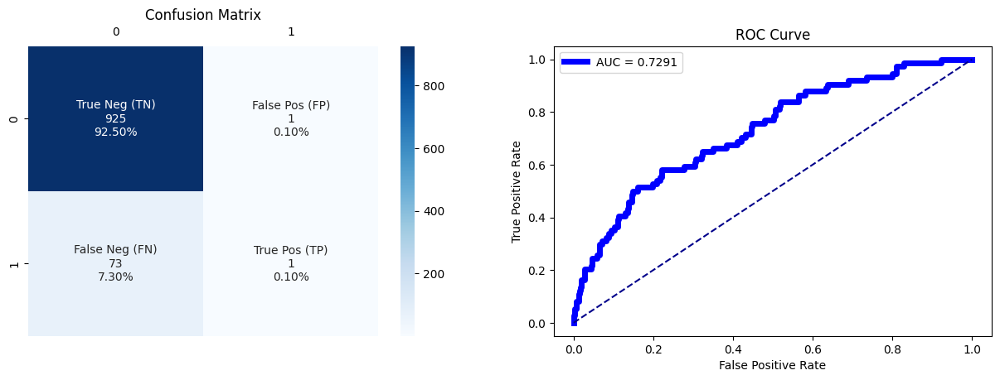

True negative   =  925
False positive  =  1
False negative  =  73
True positive   =  1


0.5842715796656431

In [62]:
 tn, fp, fn, tp  = cf_matrix_roc_auc(y_test, prediction, probability, (15, 10))
 score_gain = score_banq(tn, fp, fn, tp, 10, -1, -100, 0)
 score_gain

1. Matrice de Confusion
True Negative (TN) : 920 (92%)
Le modèle a correctement identifié 920 cas comme des personnes capables de rembourser leur prêt.

False Positive (FP) : 0 (0%)
Le modèle n'a fait aucune erreur en classifiant des personnes comme capables de rembourser alors qu'elles ne le pouvaient pas. Cela est rare mais peut indiquer un seuil strict pour éviter les FP.

False Negative (FN) : 79 (7.9%)
Ces sont des personnes qui auraient pu rembourser leur prêt mais que le modèle a classifiées comme incapables. Ces erreurs entraînent une perte d'opportunités.

True Positive (TP) : 1 (0.1%)
Le modèle a identifié correctement une seule personne comme incapable de rembourser. Cela indique une faible sensibilité (recall) pour la classe 1.


2. Métriques Classiques
Accuracy (92.1%)
Une bonne précision globale, mais trompeuse dans le cas d'un dataset déséquilibré. Ce résultat est principalement dû à la forte proportion de la classe majoritaire (0).

Précision (1.0)
La précision pour la classe positive (1) est parfaite. Cela signifie que, parmi les cas identifiés comme défaillants (1), aucun n'était incorrectement classé (pas de FP).

Rappel (0.0125)
Le modèle n'identifie presque aucune personne réellement incapable de rembourser, ce qui est problématique. La très faible sensibilité indique que beaucoup de cas positifs (défaillants) sont ignorés (FN élevés).

F1-Score (0.02469)
L'équilibre entre précision et rappel est très faible. Cela souligne que le modèle est mauvais pour capturer la classe minoritaire (1).

AUC (0.72371)
L'AUC est modérée, indiquant que le modèle a une capacité moyenne pour distinguer entre les classes positives et négatives.


3. Score de Gain Bancaire
La fonction personnalisée pour calculer le score de gain de la banque (score_banq) utilise les coefficients financiers suivants :

Gain pour TN : +10
Perte pour FP : -1
Perte pour FN : -100
Gain pour TP : 0
En appliquant ces coefficients à la matrice de confusion, on peut calculer le score de gain de la banque.

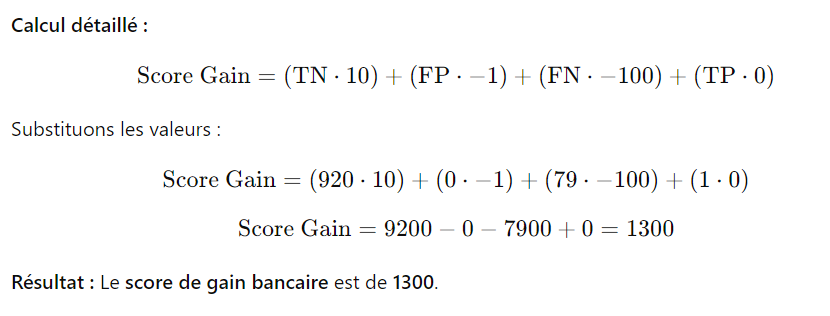

Résultat : Le score de gain bancaire est de 1300


4. Interprétation des Résultats
Points positifs :

Le modèle évite parfaitement les faux positifs (FP = 0), ce qui est important pour limiter les pertes liées à des prêts accordés à des personnes non solvables.
L'AUC montre une séparation modérée entre les classes, ce qui est exploitable pour ajuster le seuil de décision.
Points négatifs :

Le rappel pour la classe 1 (positif) est extrêmement faible (1,25%), ce qui signifie que le modèle échoue à détecter les emprunteurs qui ne rembourseront pas leur prêt.
La perte due aux FN est importante, car ces 79 cas coûtent cher à la banque.


In [63]:
 df_matrice_confusion = matrix_TN_FN(y_test, prediction)
 df_matrice_confusion

,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),925 (TN),1 (FP)
Real Positive (1),73 (FN),1 (TP)


In [64]:
 roc_auc = roc_auc_score(y_test, probability[:,1])  # on se base sur la probabilité d'être en défaut de paiement
 print('AUC : %0.4f' %roc_auc)
 print(classification_report(y_test, prediction))

AUC : 0.7291
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.50      0.01      0.03        74

    accuracy                           0.93      1000
   macro avg       0.71      0.51      0.49      1000
weighted avg       0.90      0.93      0.89      1000



In [65]:
Sample_balancing = []

def results():
     res=pd.DataFrame(
             {
              "Modele": ModelName,
              "Accuracy": accuracy,
              "AUC": AUC,
              "Recall class 1": recall,
              "F1":f1,
              "fbeta": fbeta_score,
              "TP":tp,
              "Precision":precision,
              "FN":fn,
              "score Gain":score_gain,
              # "prediction": prediction,
              #  "probability": probability,
              "time": prediction_time
             },
             index=[len(Sample_balancing)],
         )
     Sample_balancing.append(res)
     return res


In [66]:
 ModelName='baseline'
 results()

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,time
0,baseline,0.926,0.729088,0.013514,0.026316,0.016779,1,0.5,73,0.584272,0.188814


In [67]:
import mlflow.pyfunc
import mlflow.pyfunc.model
import mlflow.tracking

def delete_mlflow_model(model_name):
    # Créez une instance du suivi MLflow
    tracking_uri = "http://127.0.0.1:5000/"  # Remplacez par l'URL de votre serveur MLflow
    mlflow.set_tracking_uri(tracking_uri)
    client = mlflow.tracking.MlflowClient()

    # Récupérez la liste des modèles
    models = client.search_registered_models(f"name='{model_name}'")

    # Si un modèle avec le même nom existe, supprimez-le
    if len(models) > 0:
        model_version = models[0].latest_versions[0].version
        client.delete_registered_model(model_name)
        print(f"Modèle {model_name} version {model_version} supprimé avec succès.")
    else:
        print(f"Aucun modèle avec le nom {model_name} trouvé.")

# Utilisation
# delete_mlflow_model(ModelName)


### Techniques d'équilibrage des classes

[Plusieurs méthodes](https://publications.polymtl.ca/5349/1/2020_GuillaumeVergnolle.pdf) sont envisagées pour équilibrer les classes dans l'ensemble d'entraînement.
Elles se distinguent en deux catégories : les méthodes de **sur-échantillonnage** et de **souséchantillonnage**.

<h4> Stratégies de sur-échantillonnage </h4>
    
**SMOTE** est une des méthodes de sur-échantillonnage utilisée. En créant des observations synthétiques, on est capable de balancer les classes jusqu'à un rapport de 1. On utilisera la fonction **SMOTE** de la librairie imblearn, dont le paramètre `sampling_strategy` permet de déterminer la proportion cible entre la classe **positive** et **négative**. Les mêmes paramètres sont disponibles pour la méthode de sur-échantillonnage aléatoire avec la fonction
`RandomOverSampler` de la même librairie.
    
<h4> Stratégies de sous-échantillonnage</h4>

Pour le sous-échantillonnage aléatoire, on utilisera la fonction `RandomUnderSampler`. Cette
fonction partage aussi le paramètre `sampling_strategy` qui permet de déterminer l'équilibre
des classes désiré. Le sous-échantillonnage avec liens Tomek et la méthode Edited Nearest Neighbors sont disponibles avec les fonctions `TomekLinks` et `EditedNearestNeighbours` respectivement. Ces méthodes ne permettent pas d'atteindre une proportion de classe cible mais suppriment des instances avec des considérations de distance.

<h4> Combinaisons de stratégies de ré-échantillonnage </h4>
Certaines méthodes de sur-échantillonnage et de sous-échantillonnage peuvent être combinées afin de déterminer la meilleure stratégie. 

    — Ensemble de base non-équilibré (BASE)
    — Random Over-Sampling (ROS)
    — Random Under-Sampling (RUS)
    — SMOTE (SMT)
    — SMOTE + Liens Tomek (SMT+TMK)
    — SMOTE + Edited Nearest Neighbors (SMT+ENN)

Afin de déterminer la valeur optimale du paramètre `sampling_strategy` des méthodes `Random Under-Sampling`, `Random Over-Sampling` et `SMOTE`, différentes valeurs sont testées pour chaque compagnie et chaque découpage sur un modèle de base. La valeur du paramètre qui donne les meilleures performances est conservée pour chaque découpage et chaque compagnie.

## <a id="5.4.1"> Aucun rééquilibrage </a>

In [68]:
mlflow.set_experiment('Baseline-models')

<Experiment: artifact_location='mlflow-artifacts:/155551941979991335', creation_time=1734691846214, experiment_id='155551941979991335', last_update_time=1734691846214, lifecycle_stage='active', name='Baseline-models', tags={}>

In [69]:
# !ls

In [70]:
# Aucun rééquilibrage 
import mlflow.sklearn

def model_mlflow(classifier_model, ModelName, run_name, X_train, y_train, X_test, y_test):
    
    with mlflow.start_run(run_name=run_name):
        # Classifier
        classifier_model.fit(X_train, y_train)

        # Classification
        model, accuracy, precision, recall, f1, AUC, fbeta_score, prediction, probability, execution_time, prediction_time, resume_prediction_class, probability_positive_class =\
        classification(classifier_model, X_train, y_train, X_test, y_test, ModelName, file_name=None)

        # Matrice de confusion
        df_matrice_confusion = matrix_TN_FN(y_test, prediction)
        display(df_matrice_confusion)

        # Courbe ROC
        tn, fp, fn, tp = cf_matrix_roc_auc(y_test, prediction, probability, (15,10))

        score_gain = score_banq(tn, fp, fn, tp, 10, -1, -100, 0)

        roc_auc = roc_auc_score(y_test, probability[:,1])  # on se base sur la probabilité d'être en défaut de paiement
        print('AUC : %0.4f' %roc_auc)
        print(classification_report(y_test, prediction))

        mlflow.log_metric("test_score_métier", round(score_gain, 4))
        mlflow.log_metric("test_accuracy",round(accuracy, 4))
        mlflow.log_metric("test_precision", round(precision, 4))
        mlflow.log_metric("test_recall", round(recall, 4))
        mlflow.log_metric("test_f1_score", round(f1, 4))
        mlflow.log_metric("test_fbeta_score", round(fbeta_score, 4))
        mlflow.log_metric("test_rocauc", round(AUC, 4))

        # Supprimer le modèle existant s'il existe
        # Recherchez les exécutions précédentes avec le nom de modèle spécifié
        # runs = mlflow.search_runs(filter_string=f"tags.mlflow.runName = '{ModelName}'")
        # if not runs.empty:
        #     mlflow.sklearn.delete_model(runs.iloc[0].artifact_uri)

        # Enregistrez le modèle
        # mlflow.sklearn.save_model(model, ModelName)
        # Terminez l'expérience MLflow
        mlflow.end_run()
        return  model, accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
        prediction, probability, execution_time, prediction_time

In [71]:
Sample_balancing = []

def results():
    res = pd.DataFrame(
        {
            "Modele": [ModelName],
            "Accuracy": [accuracy],
            "AUC": [AUC],
            "Recall class 1": [recall],
            "F1": [f1],
            "fbeta": [fbeta_score],
            "TP": [tp],
            "Precision": [precision],
            "FN": [fn],
            "score Gain": [score_gain],
            # "prediction": [prediction],
            # "probability": [probability],
            "train_time": [execution_time],
            "predict_time": [prediction_time],
        }
    )
    Sample_balancing.append(res)
    return res

#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification Baseline_LogisticRegression 
 
L'accuracy score est de      : 0.924
Le score de précision est de : 0.25
Le score recall est de       : 0.01351
Le score f1 est de           : 0.02564
Le score AUC est de          : 0.72408


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),923 (TN),3 (FP)
Real Positive (1),73 (FN),1 (TP)


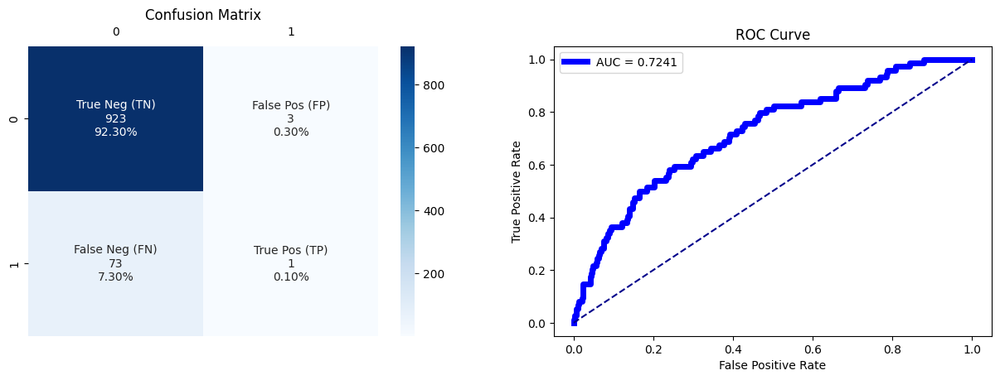

True negative   =  923
False positive  =  3
False negative  =  73
True positive   =  1
AUC : 0.7241
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.25      0.01      0.03        74

    accuracy                           0.92      1000
   macro avg       0.59      0.51      0.49      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run Baseline_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/27ef27855e3c4305abd5f504c571434a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


In [72]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'Baseline_{classifier_model.__class__.__name__}'
run_name         = f'Baseline_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)

In [73]:
results()

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Baseline_LogisticRegression,0.924,0.724082,0.013514,0.025641,0.016667,1,0.25,73,0.583021,5.737995,0.125388


#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification Baseline_RandomForestClassifier 
 
L'accuracy score est de      : 0.926
Le score de précision est de : 0.0
Le score recall est de       : 0.0
Le score f1 est de           : 0.0
Le score AUC est de          : 0.6783


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),926 (TN),0 (FP)
Real Positive (1),74 (FN),0 (TP)


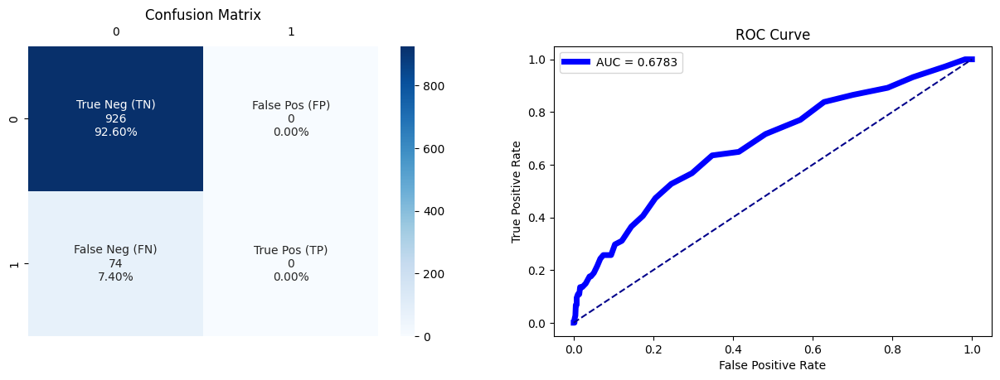

True negative   =  926
False positive  =  0
False negative  =  74
True positive   =  0
AUC : 0.6783
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.00      0.00      0.00        74

    accuracy                           0.93      1000
   macro avg       0.46      0.50      0.48      1000
weighted avg       0.86      0.93      0.89      1000

🏃 View run Baseline_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/f7b94d6a3ff54dd1bb02054875b00de4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Baseline_RandomForestClassifier,0.926,0.678295,0.0,0.0,0.0,0,0.0,74,0.579211,9.576726,0.156914


In [74]:
classifier_model = RandomForestClassifier(random_state = RANDOM_STATE)
ModelName        = f'Baseline_{classifier_model.__class__.__name__}'
run_name         = f'Baseline_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification Baseline_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.843
Le score de précision est de : 0.11215
Le score recall est de       : 0.16216
Le score f1 est de           : 0.1326
Le score AUC est de          : 0.52979


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),831 (TN),95 (FP)
Real Positive (1),62 (FN),12 (TP)


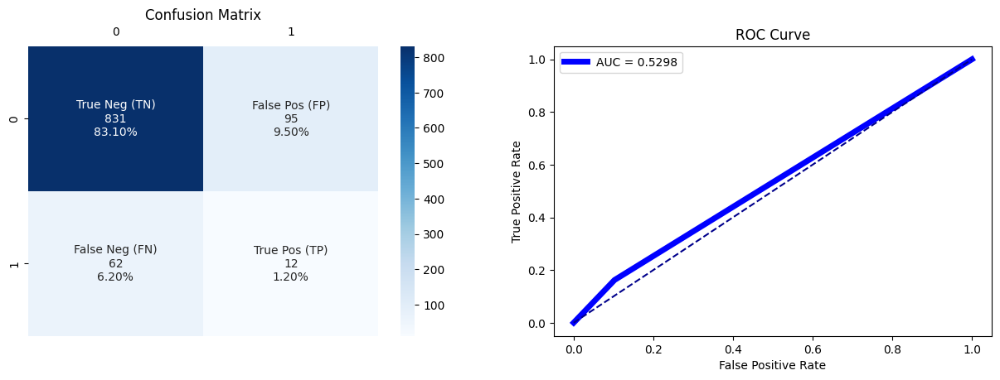

True negative   =  831
False positive  =  95
False negative  =  62
True positive   =  12
AUC : 0.5298
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       926
           1       0.11      0.16      0.13        74

    accuracy                           0.84      1000
   macro avg       0.52      0.53      0.52      1000
weighted avg       0.87      0.84      0.86      1000

🏃 View run Baseline_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/23673a76b3d14139904bff722a872cf1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Baseline_DecisionTreeClassifier,0.843,0.529785,0.162162,0.132597,0.148883,12,0.11215,62,0.588025,6.221521,0.142026


In [75]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'Baseline_{classifier_model.__class__.__name__}'
run_name         = f'Baseline_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()


#### <font color='grey'>XGBClassifier</font>

Exécution en cours ....



Qualité de la classification Baseline_XGBClassifier 
 
L'accuracy score est de      : 0.915
Le score de précision est de : 0.21053
Le score recall est de       : 0.05405
Le score f1 est de           : 0.08602
Le score AUC est de          : 0.68665


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),911 (TN),15 (FP)
Real Positive (1),70 (FN),4 (TP)


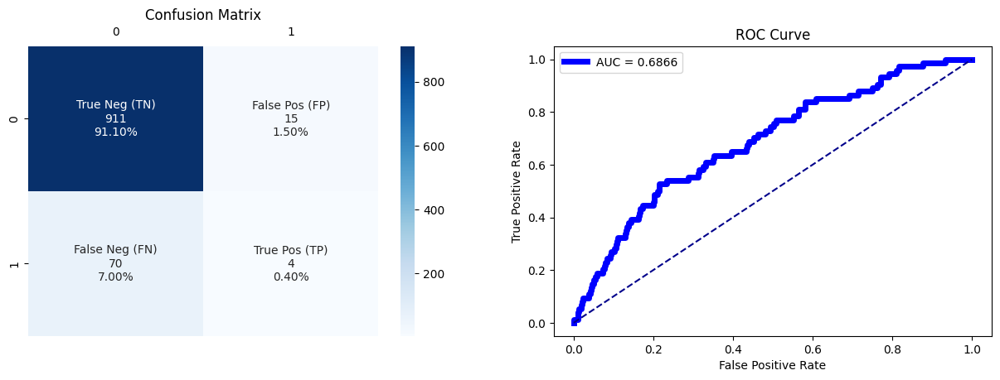

True negative   =  911
False positive  =  15
False negative  =  70
True positive   =  4
AUC : 0.6866
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       926
           1       0.21      0.05      0.09        74

    accuracy                           0.92      1000
   macro avg       0.57      0.52      0.52      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run Baseline_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/cab9c4dd2f694280ad985b55511a70c1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Baseline_XGBClassifier,0.915,0.68665,0.054054,0.086022,0.063492,4,0.210526,70,0.592574,5.06963,0.204471


In [76]:
classifier_model = XGBClassifier(objective = 'binary:logistic', random_state = RANDOM_STATE)
ModelName        = f'Baseline_{classifier_model.__class__.__name__}'
run_name         = f'Baseline_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 815, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5470
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081500 -> initscore=-2.422139
[LightGBM] [Info] Start training from score -2.422139


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5470
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.081500 -> initscore=-2.422139
[LightGBM] [Info] Start training from score -2.422139


Qualité de la classification Baseline_LGBMClassifier 
 
L'accuracy score est de      : 0.922
Le score de précision est de : 0.25
Le score recall est de       : 0.02703
Le score f1 est de           : 0.04878
Le score AUC est de          : 0.71381


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),920 (TN),6 (FP)
Real Positive (1),72 (FN),2 (TP)


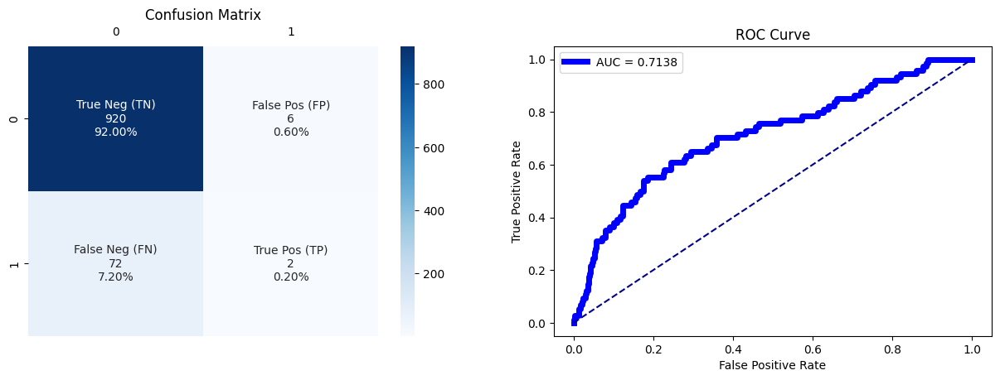

True negative   =  920
False positive  =  6
False negative  =  72
True positive   =  2
AUC : 0.7138
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       926
           1       0.25      0.03      0.05        74

    accuracy                           0.92      1000
   macro avg       0.59      0.51      0.50      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run Baseline_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/4ed2b22583f7418f98aac844f469ce3f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Baseline_LGBMClassifier,0.922,0.713808,0.027027,0.04878,0.032895,2,0.25,72,0.58683,7.487358,0.188656


In [77]:
classifier_model = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName        = f'Baseline_{classifier_model.__class__.__name__}'
run_name         = f'Baseline_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

## <a id="5.4.2"> Rééquilibrage avec class_weight</a>


La méthode des *class weight* permet de prendre en compte le caractère biaisé de la distribution du dataset et de créer un modèle pénalisé. Il s'agit ici de simplement attribuer des poids différents aux différentes classes de notre dataset, en donnant un poids plus important aux classes minoritaires, afin d'influencer le modèle lors de son entraînement. Nous pénalisons ainsi plus fortement une erreur de classification d'une classe minoritaire par rapport à une erreur de classification d'une classe majoritaire.

#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification Class_Weight_LogisticRegression 
 
L'accuracy score est de      : 0.636
Le score de précision est de : 0.12821
Le score recall est de       : 0.67568
Le score f1 est de           : 0.21552
Le score AUC est de          : 0.72357


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),586 (TN),340 (FP)
Real Positive (1),24 (FN),50 (TP)


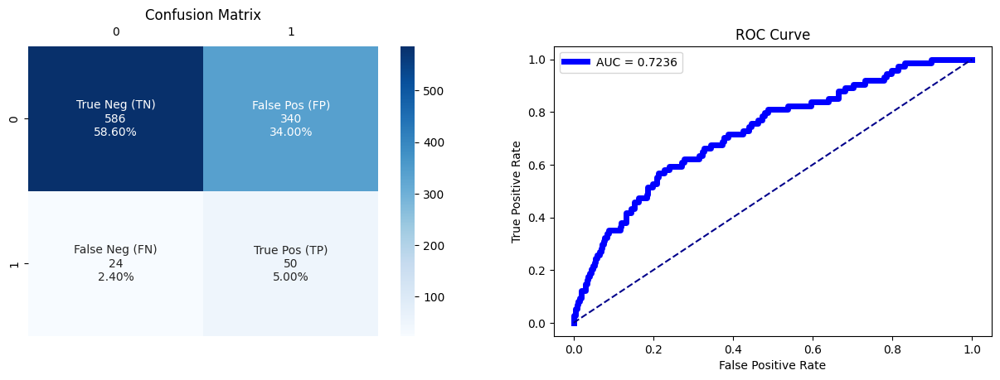

True negative   =  586
False positive  =  340
False negative  =  24
True positive   =  50
AUC : 0.7236
              precision    recall  f1-score   support

           0       0.96      0.63      0.76       926
           1       0.13      0.68      0.22        74

    accuracy                           0.64      1000
   macro avg       0.54      0.65      0.49      1000
weighted avg       0.90      0.64      0.72      1000

🏃 View run Class_Weight_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/980fea054d24471da8c41043faa890d8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_LogisticRegression,0.636,0.723571,0.675676,0.215517,0.364431,50,0.128205,24,0.650859,5.819163,0.165066


In [78]:
classifier_model = LogisticRegression(max_iter=1500, class_weight='balanced', random_state=RANDOM_STATE)
ModelName        = f'Class_Weight_{classifier_model.__class__.__name__}'
run_name         = f'Class_Weight_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification Class_Weight_RandomForestClassifier 
 
L'accuracy score est de      : 0.926
Le score de précision est de : 0.0
Le score recall est de       : 0.0
Le score f1 est de           : 0.0
Le score AUC est de          : 0.65263


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),926 (TN),0 (FP)
Real Positive (1),74 (FN),0 (TP)


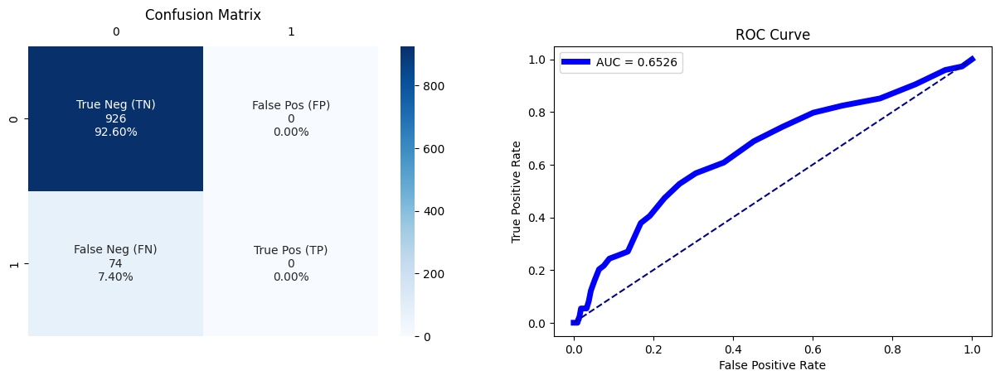

True negative   =  926
False positive  =  0
False negative  =  74
True positive   =  0
AUC : 0.6526
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.00      0.00      0.00        74

    accuracy                           0.93      1000
   macro avg       0.46      0.50      0.48      1000
weighted avg       0.86      0.93      0.89      1000



C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

🏃 View run Class_Weight_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/b626e19d792042878ea771c5313f9e2e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_RandomForestClassifier,0.926,0.652633,0.0,0.0,0.0,0,0.0,74,0.579211,9.329889,0.155539


In [79]:
classifier_model = RandomForestClassifier(class_weight='balanced', random_state = RANDOM_STATE)
ModelName        = f'Class_Weight_{classifier_model.__class__.__name__}'
run_name         = f'Class_Weight_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification Class_Weight_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.855
Le score de précision est de : 0.11828
Le score recall est de       : 0.14865
Le score f1 est de           : 0.13174
Le score AUC est de          : 0.53005


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),844 (TN),82 (FP)
Real Positive (1),63 (FN),11 (TP)


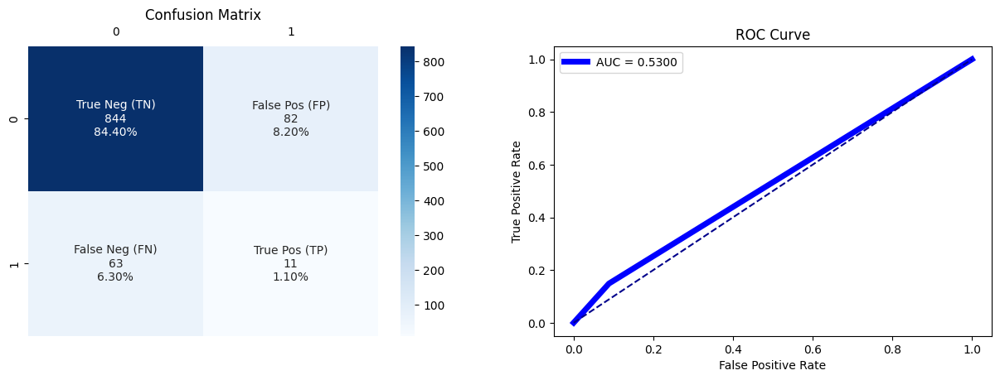

True negative   =  844
False positive  =  82
False negative  =  63
True positive   =  11
AUC : 0.5300
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       926
           1       0.12      0.15      0.13        74

    accuracy                           0.85      1000
   macro avg       0.52      0.53      0.53      1000
weighted avg       0.87      0.85      0.86      1000

🏃 View run Class_Weight_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/a6f0565633ed42e286d796246e710c12
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_DecisionTreeClassifier,0.855,0.530048,0.148649,0.131737,0.141388,11,0.11828,63,0.59047,5.826993,0.188228


In [80]:
classifier_model = DecisionTreeClassifier(class_weight='balanced', random_state = RANDOM_STATE)
ModelName        = f'Class_Weight_{classifier_model.__class__.__name__}'
run_name         = f'Class_Weight_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()


#### <font color='grey'>XGBClassifier</font>

C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\xgboost\core.py:158: UserWarning: [11:52:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)


Exécution en cours ....



C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\xgboost\core.py:158: UserWarning: [11:52:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-06abd128ca6c1688d-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)


Qualité de la classification Class_Weight_XGBClassifier 
 
L'accuracy score est de      : 0.915
Le score de précision est de : 0.21053
Le score recall est de       : 0.05405
Le score f1 est de           : 0.08602
Le score AUC est de          : 0.68665


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),911 (TN),15 (FP)
Real Positive (1),70 (FN),4 (TP)


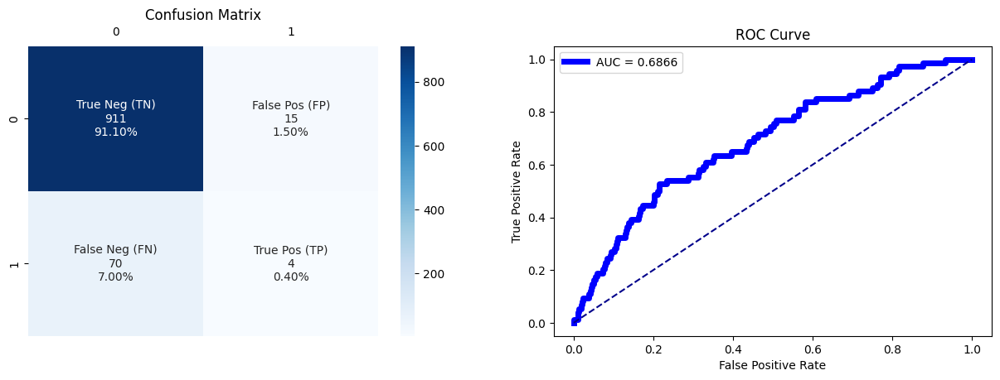

True negative   =  911
False positive  =  15
False negative  =  70
True positive   =  4
AUC : 0.6866
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       926
           1       0.21      0.05      0.09        74

    accuracy                           0.92      1000
   macro avg       0.57      0.52      0.52      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run Class_Weight_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/019a665683ff45a6890e2dab3d1cb29e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_XGBClassifier,0.915,0.68665,0.054054,0.086022,0.063492,4,0.210526,70,0.592574,4.880807,0.240284


In [81]:
classifier_model = XGBClassifier(objective= 'binary:logistic', class_weight='balanced', random_state = RANDOM_STATE)
ModelName        = f'Class_Weight_{classifier_model.__class__.__name__}'
run_name         = f'Class_Weight_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 815, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5470
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5470
[LightGBM] [Info] Number of data points in the train set: 10000, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


Qualité de la classification Class_Weight_LGBMClassifier 
 
L'accuracy score est de      : 0.836
Le score de précision est de : 0.20395
Le score recall est de       : 0.41892
Le score f1 est de           : 0.27434
Le score AUC est de          : 0.69684


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),805 (TN),121 (FP)
Real Positive (1),43 (FN),31 (TP)


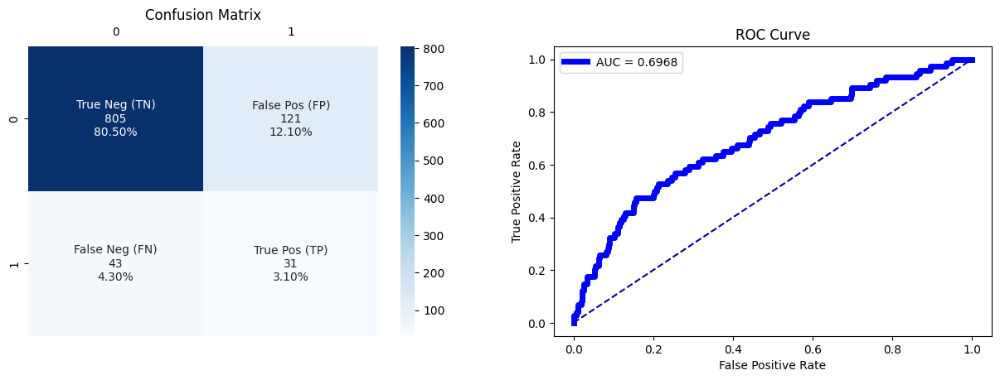

True negative   =  805
False positive  =  121
False negative  =  43
True positive   =  31
AUC : 0.6968
              precision    recall  f1-score   support

           0       0.95      0.87      0.91       926
           1       0.20      0.42      0.27        74

    accuracy                           0.84      1000
   macro avg       0.58      0.64      0.59      1000
weighted avg       0.89      0.84      0.86      1000

🏃 View run Class_Weight_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/a488ee1ad986481db7070eb292b0c4b0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_LGBMClassifier,0.836,0.696836,0.418919,0.274336,0.345982,31,0.203947,43,0.679802,7.588734,0.213886


In [82]:
classifier_model = LGBMClassifier(objective='binary', class_weight='balanced', random_state = RANDOM_STATE)
ModelName        = f'Class_Weight_{classifier_model.__class__.__name__}'
run_name         = f'Class_Weight_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train_scaled, y_train, X_test_scaled, y_test)
results()

## <a id="5.4.3"> Rééquilibrage avec Sur-échantillonnage : SMOTE </a>



L'oversampling (sur-échantillonnage) est une technique utilisée pour remédier au déséquilibre de classes dans un jeu de données, où une classe est sous-représentée par rapport à une autre classe. L'objectif de l'oversampling est de générer des échantillons synthétiques de la classe minoritaire afin d'équilibrer les classes et d'améliorer les performances du modèle.

Le SMOTE, acronyme pour Synthetic Minority Oversampling TEchnique, est une méthode de suréchantillonnage des observations minoritaires. Pour éviter de réaliser un simple clonage des individus minoritaires, le SMOTE se base sur un principe simple : générer de nouveaux individus minoritaires qui ressemblent aux autres, sans être strictement identiques. Cela permet de densifier de façon plus homogène la population d'individus minoritaires.

In [83]:
# # Rééquilibrage avec Sur-échantillonnage (upsampling) de la classe minoritaire : SMOTE 

# from imblearn.over_sampling import SMOTE
# from collections import Counter
# print('Equilibre des classes : {}'.format(Counter(y_train)))
# # Définition de l'instance SMOTE
# sampling = SMOTE(random_state = RANDOM_SEED)
# sample_name=sampling.__class__.__name__
# print('sample_name :', sample_name)
# # Application du SMOTE aux données
# globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'] = \
# sampling.fit_resample(X_train_scaled, y_train)
# print('Equilibre des classes : {}'.format(Counter(globals()[f'y_train_{sample_name}'])))


In [84]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Définir le seed pour la reproductibilité
RANDOM_SEED = 42

# Afficher l'équilibre des classes avant le sur-échantillonnage
print('Equilibre des classes avant sur-échantillonnage : {}'.format(Counter(y_train)))

# Définition de l'instance SMOTE avec RANDOM_SEED
sampling = SMOTE(random_state=RANDOM_SEED)
sample_name = sampling.__class__.__name__
print('sample_name :', sample_name)

# Application du SMOTE aux données d'entraînement
globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'] = sampling.fit_resample(X_train_scaled, y_train)

# Afficher l'équilibre des classes après le sur-échantillonnage
print('Equilibre des classes après sur-échantillonnage : {}'.format(Counter(globals()[f'y_train_{sample_name}'])))


Equilibre des classes avant sur-échantillonnage : Counter({0: 9185, 1: 815})
sample_name : SMOTE


🏃 View run dapper-bass-460 at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/9cd7ce6797d34c3795eb3c47864dd714
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335
Equilibre des classes après sur-échantillonnage : Counter({0: 9185, 1: 9185})


#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification SMOTE_LogisticRegression 
 
L'accuracy score est de      : 0.814
Le score de précision est de : 0.13636
Le score recall est de       : 0.28378
Le score f1 est de           : 0.18421
Le score AUC est de          : 0.62733


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),793 (TN),133 (FP)
Real Positive (1),53 (FN),21 (TP)


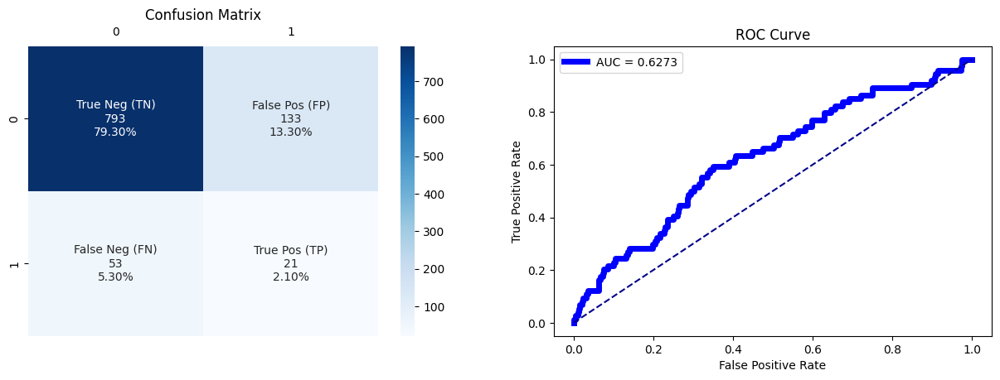

True negative   =  793
False positive  =  133
False negative  =  53
True positive   =  21
AUC : 0.6273
              precision    recall  f1-score   support

           0       0.94      0.86      0.90       926
           1       0.14      0.28      0.18        74

    accuracy                           0.81      1000
   macro avg       0.54      0.57      0.54      1000
weighted avg       0.88      0.81      0.84      1000

🏃 View run SMOTE_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/68054bbb046b4f8b8e270e8158ea9ddb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,SMOTE_LogisticRegression,0.814,0.627328,0.283784,0.184211,0.233333,21,0.136364,53,0.615433,7.129946,0.141293


In [85]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification SMOTE_RandomForestClassifier 
 
L'accuracy score est de      : 0.895
Le score de précision est de : 0.10256
Le score recall est de       : 0.05405
Le score f1 est de           : 0.0708
Le score AUC est de          : 0.64658


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),891 (TN),35 (FP)
Real Positive (1),70 (FN),4 (TP)


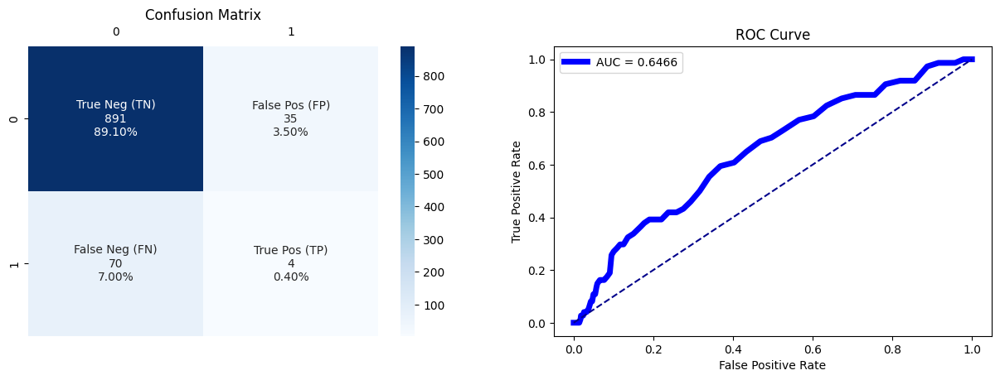

True negative   =  891
False positive  =  35
False negative  =  70
True positive   =  4
AUC : 0.6466
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       926
           1       0.10      0.05      0.07        74

    accuracy                           0.90      1000
   macro avg       0.51      0.51      0.51      1000
weighted avg       0.87      0.90      0.88      1000

🏃 View run SMOTE_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/bc78c191e1c4464e86966c97fa2805a0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,SMOTE_RandomForestClassifier,0.895,0.646584,0.054054,0.070796,0.059701,4,0.102564,70,0.580064,15.296182,0.157558


In [86]:
classifier_model = RandomForestClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification SMOTE_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.803
Le score de précision est de : 0.11801
Le score recall est de       : 0.25676
Le score f1 est de           : 0.1617
Le score AUC est de          : 0.5517


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),784 (TN),142 (FP)
Real Positive (1),55 (FN),19 (TP)


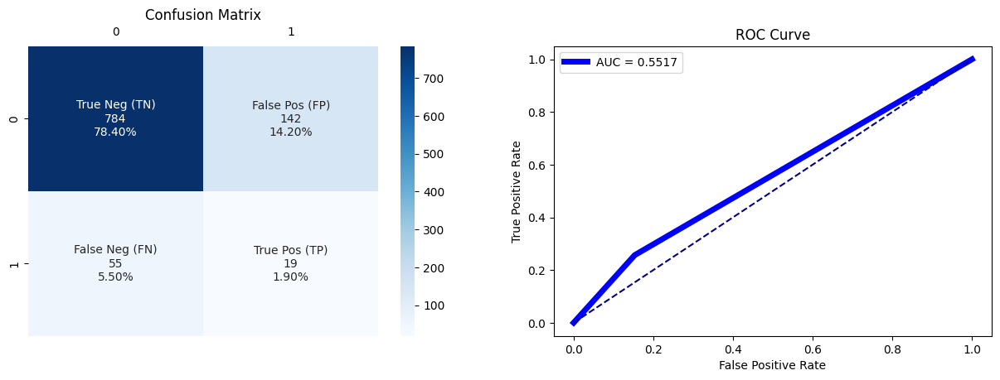

True negative   =  784
False positive  =  142
False negative  =  55
True positive   =  19
AUC : 0.5517
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       926
           1       0.12      0.26      0.16        74

    accuracy                           0.80      1000
   macro avg       0.53      0.55      0.53      1000
weighted avg       0.87      0.80      0.83      1000

🏃 View run SMOTE_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/b0df2007e5464bc0ae170f8f2940e07c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,SMOTE_DecisionTreeClassifier,0.803,0.551705,0.256757,0.161702,0.207877,19,0.118012,55,0.598431,7.917374,0.173289


In [87]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>XGBClassifier</font>

Exécution en cours ....



Qualité de la classification SMOTE_XGBClassifier 
 
L'accuracy score est de      : 0.89
Le score de précision est de : 0.1087
Le score recall est de       : 0.06757
Le score f1 est de           : 0.08333
Le score AUC est de          : 0.66909


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),885 (TN),41 (FP)
Real Positive (1),69 (FN),5 (TP)


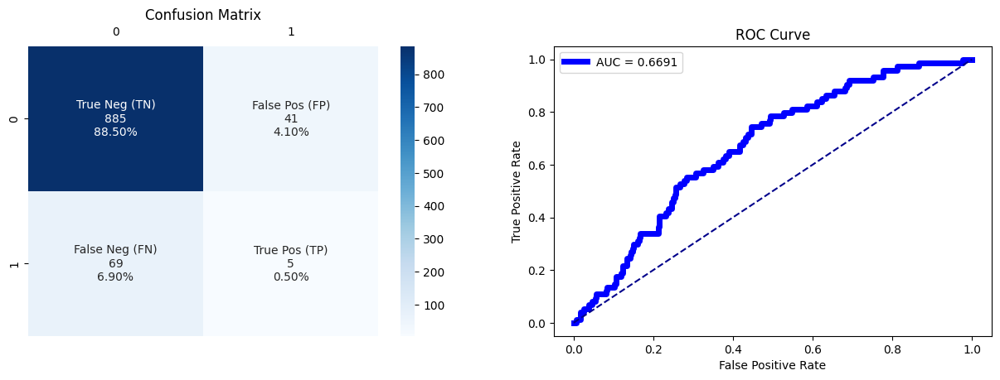

True negative   =  885
False positive  =  41
False negative  =  69
True positive   =  5
AUC : 0.6691
              precision    recall  f1-score   support

           0       0.93      0.96      0.94       926
           1       0.11      0.07      0.08        74

    accuracy                           0.89      1000
   macro avg       0.52      0.51      0.51      1000
weighted avg       0.87      0.89      0.88      1000

🏃 View run SMOTE_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/5ba2caed6b1c4113880ae6200f2ed043
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,SMOTE_XGBClassifier,0.89,0.669094,0.067568,0.083333,0.073099,5,0.108696,69,0.581997,5.288567,0.236318


In [88]:
classifier_model = XGBClassifier(objective= 'binary:logistic', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 9185, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008510 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12591
[LightGBM] [Info] Number of data points in the train set: 18370, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 9185, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006729 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12591
[LightGBM] [Info] Number of data points in the train set: 18370, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification SMOTE_LGBMClassifier 
 
L'accuracy score est de      : 0.889
Le score de précision est de : 0.17544
Le score recall est de       : 0.13514
Le score f1 est de           : 0.15267
Le score AUC est de          : 0.70669


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),879 (TN),47 (FP)
Real Positive (1),64 (FN),10 (TP)


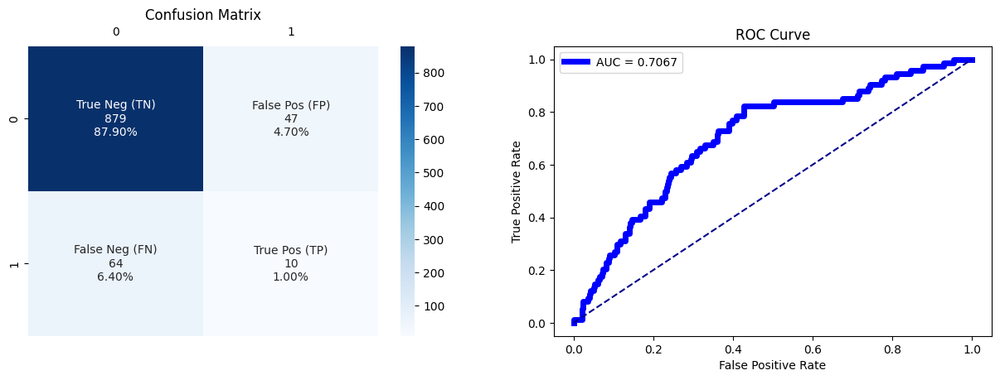

True negative   =  879
False positive  =  47
False negative  =  64
True positive   =  10
AUC : 0.7067
              precision    recall  f1-score   support

           0       0.93      0.95      0.94       926
           1       0.18      0.14      0.15        74

    accuracy                           0.89      1000
   macro avg       0.55      0.54      0.55      1000
weighted avg       0.88      0.89      0.88      1000

🏃 View run SMOTE_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/cca20b5d796c483ab979b48284711ffb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,SMOTE_LGBMClassifier,0.889,0.706687,0.135135,0.152672,0.141643,10,0.175439,64,0.606676,8.770054,0.2041


In [89]:
classifier_model = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

## <a id="5.4.4"> Rééquilibrage avec Sous-échantillonnage : Tomek Links </a>

L'undersampling (sous-échantillonnage) est une technique utilisée pour remédier au déséquilibre de classes dans un jeu de données, où une classe est sur-représentée par rapport à une autre classe. L'objectif de l'undersampling est de réduire le nombre d'échantillons de la classe majoritaire afin d'équilibrer les classes et d'améliorer les performances du modèle.

Tomek Links est une approche de sous-échantillonnage de la classe majoritaire. L'idée est de chercher les points de la classe majoritaire qui sont assez proches d'un point de la classe minoritaire. Les paires de points identifiées sont appelées tomek links. Dans chaque tomek link on va retirer le point qui appartient à la classe majoritaire.

In [90]:
# Rééquilibrage avec Sous-échantillonnage (undersampling) de la classe majoritaire : Tomek Links
print('Equilibre des classes : {}'.format(Counter(y_train)))
# Création de l'objet TomekLinks
sampling = TomekLinks()
# Sous-échantillonnage en utilisant Tomek Links
sample_name=sampling.__class__.__name__
print('sample_name :', sample_name)
# Application du SMOTE aux données
globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'] = \
sampling.fit_resample(X_train_scaled, y_train)
print('Equilibre des classes : {}'.format(Counter(globals()[f'y_train_{sample_name}'])))

Equilibre des classes : Counter({0: 9185, 1: 815})
sample_name : TomekLinks


🏃 View run secretive-grouse-173 at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/8d836b2d952b4bb1af0558e6bf24fa4b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335
Equilibre des classes : Counter({0: 8990, 1: 815})


#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification TomekLinks_LogisticRegression 
 
L'accuracy score est de      : 0.924
Le score de précision est de : 0.25
Le score recall est de       : 0.01351
Le score f1 est de           : 0.02564
Le score AUC est de          : 0.72319


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),923 (TN),3 (FP)
Real Positive (1),73 (FN),1 (TP)


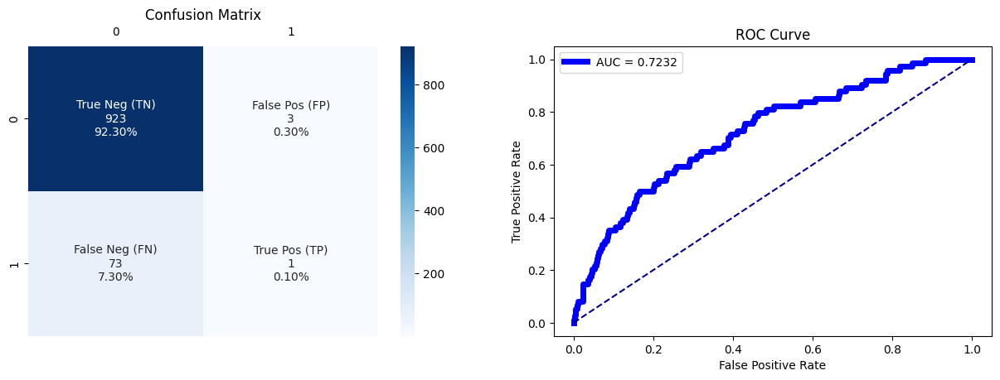

True negative   =  923
False positive  =  3
False negative  =  73
True positive   =  1
AUC : 0.7232
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.25      0.01      0.03        74

    accuracy                           0.92      1000
   macro avg       0.59      0.51      0.49      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run TomekLinks_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/1f39514be8ee41e48ca7eead1078eaa3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,TomekLinks_LogisticRegression,0.924,0.723192,0.013514,0.025641,0.016667,1,0.25,73,0.583021,5.826294,0.173222


In [91]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification TomekLinks_RandomForestClassifier 
 
L'accuracy score est de      : 0.926
Le score de précision est de : 0.0
Le score recall est de       : 0.0
Le score f1 est de           : 0.0
Le score AUC est de          : 0.6978


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),926 (TN),0 (FP)
Real Positive (1),74 (FN),0 (TP)


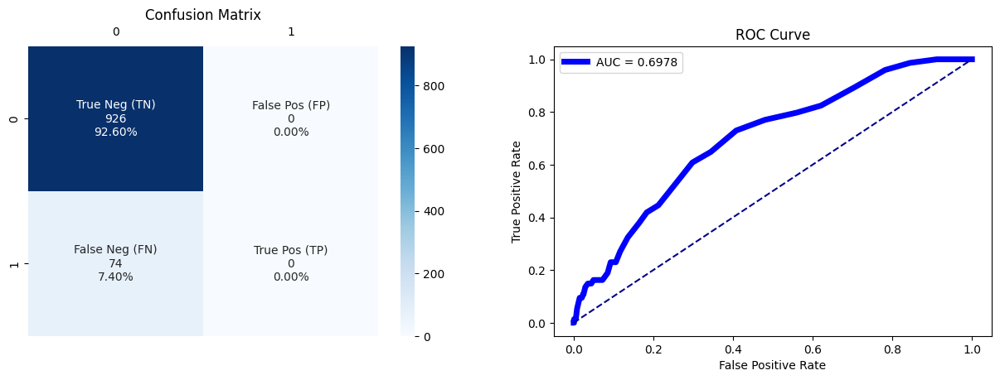

True negative   =  926
False positive  =  0
False negative  =  74
True positive   =  0
AUC : 0.6978
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.00      0.00      0.00        74

    accuracy                           0.93      1000
   macro avg       0.46      0.50      0.48      1000
weighted avg       0.86      0.93      0.89      1000



C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

🏃 View run TomekLinks_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/341afe09a43d4f5fb8d7f2fd4bcd6009
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,TomekLinks_RandomForestClassifier,0.926,0.697799,0.0,0.0,0.0,0,0.0,74,0.579211,10.538238,0.246613


In [92]:
classifier_model = RandomForestClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification TomekLinks_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.858
Le score de précision est de : 0.15306
Le score recall est de       : 0.2027
Le score f1 est de           : 0.17442
Le score AUC est de          : 0.55653


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),843 (TN),83 (FP)
Real Positive (1),59 (FN),15 (TP)


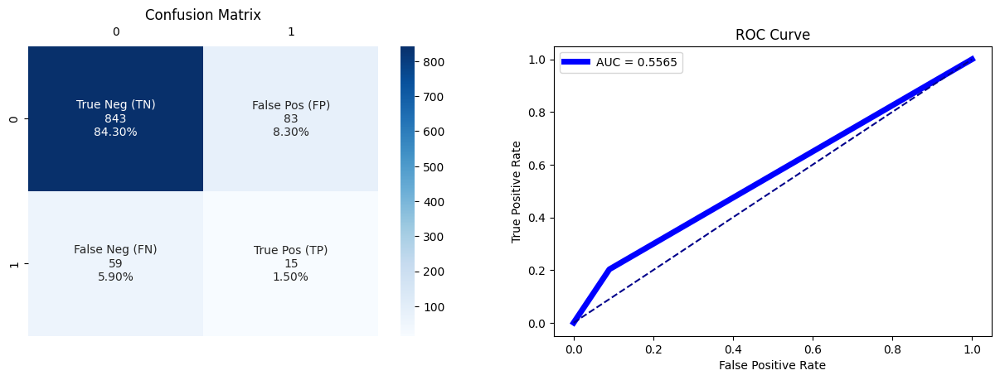

True negative   =  843
False positive  =  83
False negative  =  59
True positive   =  15
AUC : 0.5565
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       926
           1       0.15      0.20      0.17        74

    accuracy                           0.86      1000
   macro avg       0.54      0.56      0.55      1000
weighted avg       0.88      0.86      0.87      1000

🏃 View run TomekLinks_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/f0fcebe52b5346e38940d47ea97a96ee
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,TomekLinks_DecisionTreeClassifier,0.858,0.556535,0.202703,0.174419,0.190355,15,0.153061,59,0.61259,7.609489,0.21997


In [93]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>XGBClassifier</font>

Exécution en cours ....



Qualité de la classification TomekLinks_XGBClassifier 
 
L'accuracy score est de      : 0.916
Le score de précision est de : 0.22222
Le score recall est de       : 0.05405
Le score f1 est de           : 0.08696
Le score AUC est de          : 0.66426


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),912 (TN),14 (FP)
Real Positive (1),70 (FN),4 (TP)


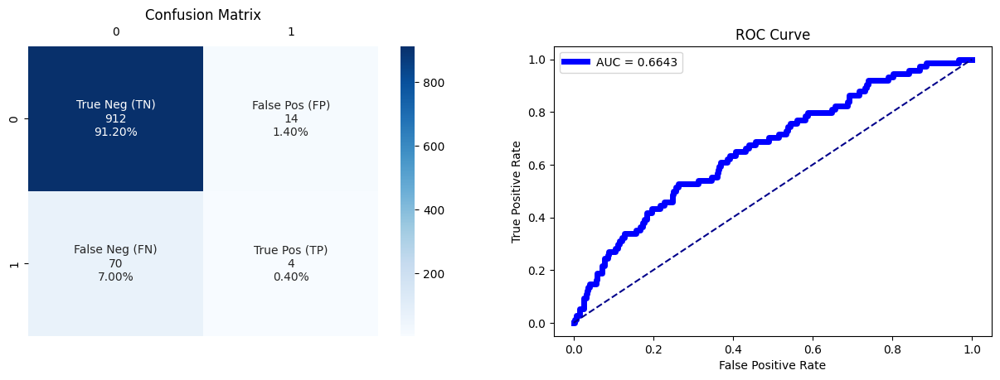

True negative   =  912
False positive  =  14
False negative  =  70
True positive   =  4
AUC : 0.6643
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       926
           1       0.22      0.05      0.09        74

    accuracy                           0.92      1000
   macro avg       0.58      0.52      0.52      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run TomekLinks_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/a2e5dcdc5e3f4988a467c793dc4dde7b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,TomekLinks_XGBClassifier,0.916,0.664264,0.054054,0.086957,0.063694,4,0.222222,70,0.593199,5.655311,0.25084


In [94]:
classifier_model = XGBClassifier(objective= 'binary:logistic', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 815, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002958 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5446
[LightGBM] [Info] Number of data points in the train set: 9805, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.083121 -> initscore=-2.400680
[LightGBM] [Info] Start training from score -2.400680


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 8990
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5446
[LightGBM] [Info] Number of data points in the train set: 9805, number of used features: 99
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.083121 -> initscore=-2.400680
[LightGBM] [Info] Start training from score -2.400680


Qualité de la classification TomekLinks_LGBMClassifier 
 
L'accuracy score est de      : 0.921
Le score de précision est de : 0.22222
Le score recall est de       : 0.02703
Le score f1 est de           : 0.04819
Le score AUC est de          : 0.69009


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),919 (TN),7 (FP)
Real Positive (1),72 (FN),2 (TP)


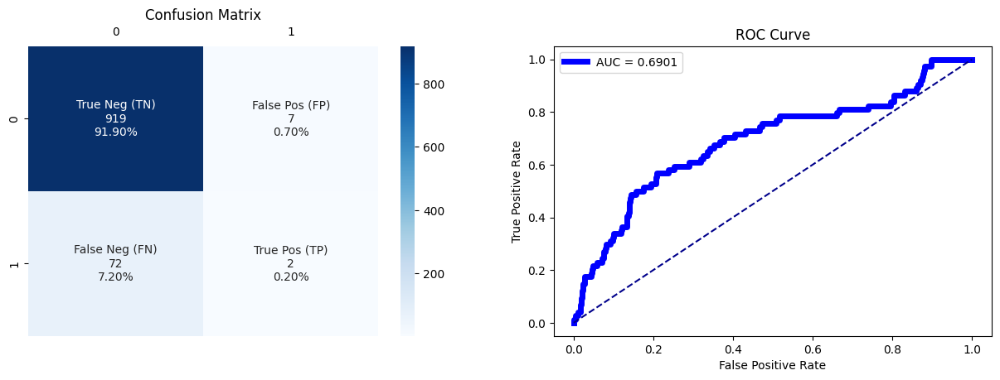

True negative   =  919
False positive  =  7
False negative  =  72
True positive   =  2
AUC : 0.6901
              precision    recall  f1-score   support

           0       0.93      0.99      0.96       926
           1       0.22      0.03      0.05        74

    accuracy                           0.92      1000
   macro avg       0.57      0.51      0.50      1000
weighted avg       0.88      0.92      0.89      1000

🏃 View run TomekLinks_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/8dc2f3ac19ad438a9d0421f58c80ca55
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,TomekLinks_LGBMClassifier,0.921,0.690094,0.027027,0.048193,0.032787,2,0.222222,72,0.586205,7.68411,0.220182


In [95]:
classifier_model = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

In [96]:
# Affichez la distribution des classes après sous-échantillonnage
print("Distribution des classes après sous-échantillonnage :", Counter(globals()[f'y_train_{sample_name}']))

Distribution des classes après sous-échantillonnage : Counter({0: 8990, 1: 815})


## <a id="5.4.5"> RandomUnderSampler </a>

Le ***Random Undersampler*** vise à résoudre ce problème en réduisant aléatoirement le nombre d'exemples de la classe majoritaire pour équilibrer les proportions entre les classes. Voici comment fonctionne généralement cette méthode :

- [X] **Étape 1** : Identifier les classes déséquilibrées.
Tout d'abord, vous devez déterminer quelles classes sont déséquilibrées dans votre ensemble de données. Cela implique de compter le nombre d'exemples dans chaque classe.

- [X] **Étape 2** : Sélectionner aléatoirement des exemples.
Une fois que vous avez identifié les classes déséquilibrées, vous pouvez utiliser le Random Undersampler pour sélectionner aléatoirement un sous-ensemble d'exemples de la classe majoritaire. L'objectif est de réduire le nombre d'exemples de la classe majoritaire pour qu'il soit similaire à celui de la classe minoritaire.

- [X] **Étape 3** : Entraîner le modèle.

In [97]:
# Rééquilibrage avec Sous-échantillonnage (undersampling) de la classe majoritaire : RandomUnderSampler

print('Equilibre des classes : {}'.format(Counter(y_train)))
# Création de l'objet 
sampling = RandomUnderSampler()
# Sous-échantillonnage en utilisant RandomUnderSampler
sample_name=sampling.__class__.__name__
print('sample_name :', sample_name)
# Application du SMOTE aux données
globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'] = \
sampling.fit_resample(X_train_scaled, y_train)
print('Equilibre des classes : {}'.format(Counter(globals()[f'y_train_{sample_name}'])))

Equilibre des classes : Counter({0: 9185, 1: 815})
sample_name : RandomUnderSampler
Equilibre des classes : Counter({0: 815, 1: 815})


#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification RandomUnderSampler_LogisticRegression 
 
L'accuracy score est de      : 0.629
Le score de précision est de : 0.12405
Le score recall est de       : 0.66216
Le score f1 est de           : 0.20896
Le score AUC est de          : 0.70548


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),580 (TN),346 (FP)
Real Positive (1),25 (FN),49 (TP)


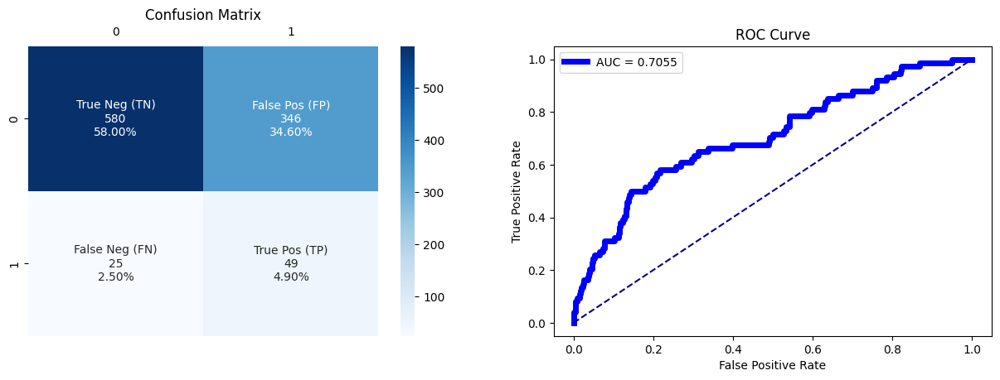

True negative   =  580
False positive  =  346
False negative  =  25
True positive   =  49
AUC : 0.7055
              precision    recall  f1-score   support

           0       0.96      0.63      0.76       926
           1       0.12      0.66      0.21        74

    accuracy                           0.63      1000
   macro avg       0.54      0.64      0.48      1000
weighted avg       0.90      0.63      0.72      1000

🏃 View run RandomUnderSampler_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/916221d356fe45759ae5c270ddbcb980
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomUnderSampler_LogisticRegression,0.629,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.385626,0.106076


In [98]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification RandomUnderSampler_RandomForestClassifier 
 
L'accuracy score est de      : 0.627
Le score de précision est de : 0.11169
Le score recall est de       : 0.58108
Le score f1 est de           : 0.18736
Le score AUC est de          : 0.66596


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),584 (TN),342 (FP)
Real Positive (1),31 (FN),43 (TP)


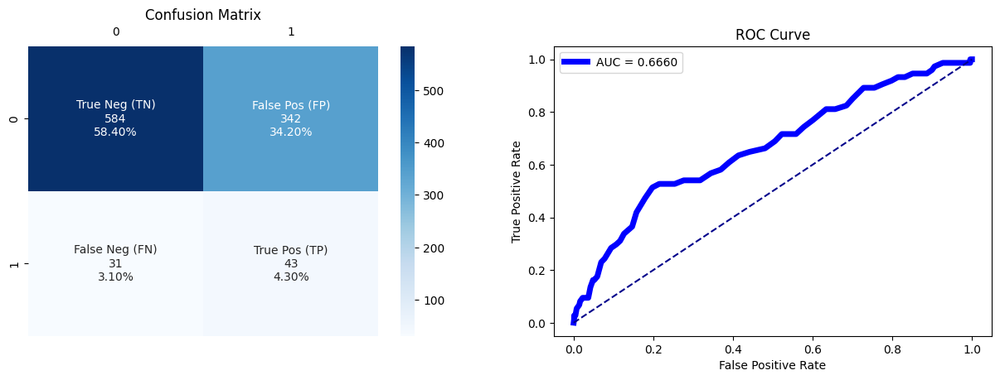

True negative   =  584
False positive  =  342
False negative  =  31
True positive   =  43
AUC : 0.6660
              precision    recall  f1-score   support

           0       0.95      0.63      0.76       926
           1       0.11      0.58      0.19        74

    accuracy                           0.63      1000
   macro avg       0.53      0.61      0.47      1000
weighted avg       0.89      0.63      0.72      1000

🏃 View run RandomUnderSampler_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/5cb497dc6d14433c829cf8dea9f59c01
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomUnderSampler_RandomForestClassifier,0.627,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.295312,0.220237


In [99]:
classifier_model = RandomForestClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification RandomUnderSampler_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.561
Le score de précision est de : 0.09354
Le score recall est de       : 0.56757
Le score f1 est de           : 0.16061
Le score AUC est de          : 0.56402


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),519 (TN),407 (FP)
Real Positive (1),32 (FN),42 (TP)


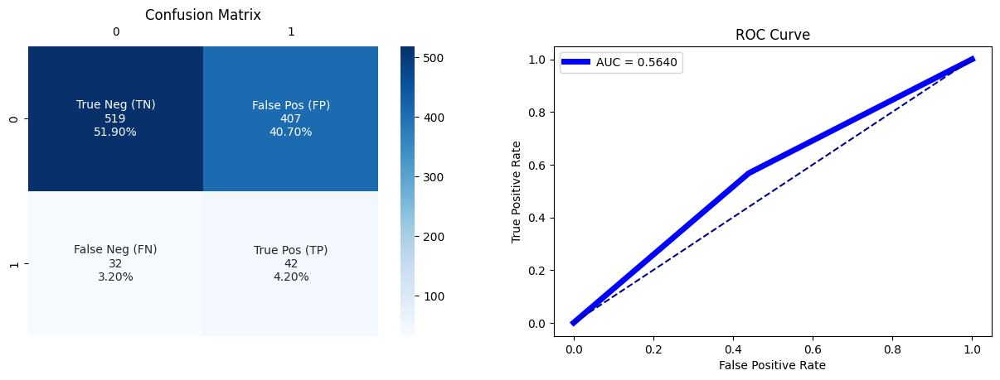

True negative   =  519
False positive  =  407
False negative  =  32
True positive   =  42
AUC : 0.5640
              precision    recall  f1-score   support

           0       0.94      0.56      0.70       926
           1       0.09      0.57      0.16        74

    accuracy                           0.56      1000
   macro avg       0.52      0.56      0.43      1000
weighted avg       0.88      0.56      0.66      1000

🏃 View run RandomUnderSampler_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/ce7de3dd520f40169d7d13b185590e2c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomUnderSampler_DecisionTreeClassifier,0.561,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.56346,4.722429,0.165181


In [100]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>XGBClassifier</font>

Exécution en cours ....



Qualité de la classification RandomUnderSampler_XGBClassifier 
 
L'accuracy score est de      : 0.631
Le score de précision est de : 0.11488
Le score recall est de       : 0.59459
Le score f1 est de           : 0.19256
Le score AUC est de          : 0.64925


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),587 (TN),339 (FP)
Real Positive (1),30 (FN),44 (TP)


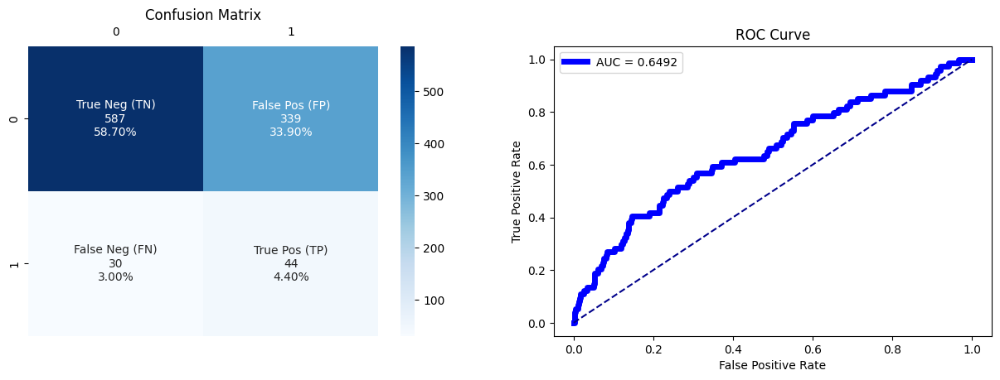

True negative   =  587
False positive  =  339
False negative  =  30
True positive   =  44
AUC : 0.6492
              precision    recall  f1-score   support

           0       0.95      0.63      0.76       926
           1       0.11      0.59      0.19        74

    accuracy                           0.63      1000
   macro avg       0.53      0.61      0.48      1000
weighted avg       0.89      0.63      0.72      1000

🏃 View run RandomUnderSampler_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/82ac0c246fb3495c8a81ad20de3d4f0a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomUnderSampler_XGBClassifier,0.631,0.649247,0.594595,0.19256,0.324006,44,0.114883,30,0.617366,4.969895,0.236477


In [101]:
classifier_model = XGBClassifier(objective= 'binary:logistic', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001945 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001362 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification RandomUnderSampler_LGBMClassifier 
 
L'accuracy score est de      : 0.612
Le score de précision est de : 0.11893
Le score recall est de       : 0.66216
Le score f1 est de           : 0.20165
Le score AUC est de          : 0.68446


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),563 (TN),363 (FP)
Real Positive (1),25 (FN),49 (TP)


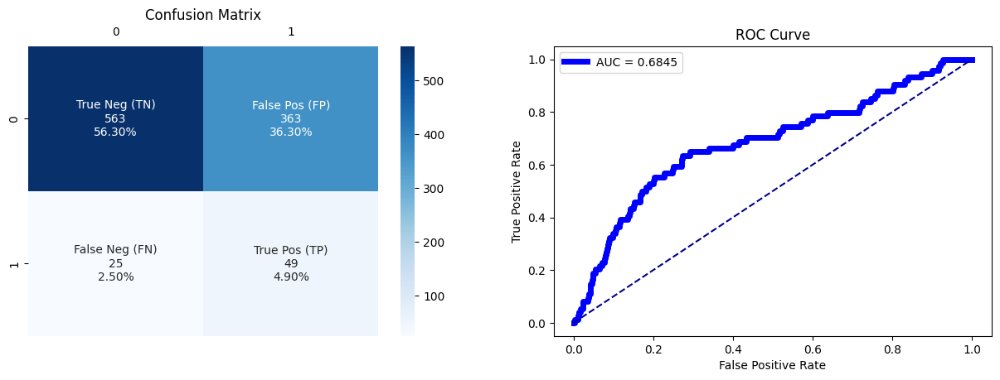

True negative   =  563
False positive  =  363
False negative  =  25
True positive   =  49
AUC : 0.6845
              precision    recall  f1-score   support

           0       0.96      0.61      0.74       926
           1       0.12      0.66      0.20        74

    accuracy                           0.61      1000
   macro avg       0.54      0.64      0.47      1000
weighted avg       0.90      0.61      0.70      1000

🏃 View run RandomUnderSampler_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/7f7596b8b2634edab48900aa71ff87a3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomUnderSampler_LGBMClassifier,0.612,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.331949,0.200757


In [102]:
classifier_model = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

### RandomOverSampler

Le **`RandomOverSampler`** est une méthode qui augmente le nombre d'échantillons de la classe minoritaire dans un ensemble de données déséquilibré en utilisant une approche aléatoire. Il sélectionne des échantillons de la classe minoritaire existante de manière aléatoire et les duplique pour augmenter leur nombre jusqu'à ce que le déséquilibre des classes soit résolu ou qu'un ratio spécifié entre les classes soit atteint.

In [103]:
# Rééquilibrage avec Sous-échantillonnage (undersampling) de la classe majoritaire : Tomek Links
print('Equilibre des classes : {}'.format(Counter(y_train)))
# Random oversampling minority class
sampling = RandomOverSampler(random_state=RANDOM_STATE)
sample_name=sampling.__class__.__name__
print('sample_name :', sample_name)
# Application du SMOTE aux données
globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'] = \
sampling.fit_resample(X_train_scaled, y_train)
print('Equilibre des classes : {}'.format(Counter(globals()[f'y_train_{sample_name}'])))

Equilibre des classes : Counter({0: 9185, 1: 815})
sample_name : RandomOverSampler
Equilibre des classes : Counter({0: 9185, 1: 9185})


#### <font color='grey'>Régression logistique</font>

Exécution en cours ....



Qualité de la classification RandomOverSampler_LogisticRegression 
 
L'accuracy score est de      : 0.637
Le score de précision est de : 0.12468
Le score recall est de       : 0.64865
Le score f1 est de           : 0.20915
Le score AUC est de          : 0.71995


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),589 (TN),337 (FP)
Real Positive (1),26 (FN),48 (TP)


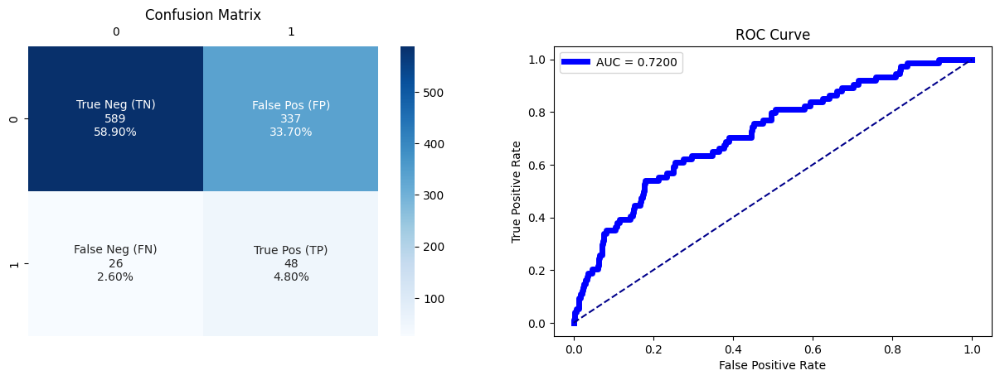

True negative   =  589
False positive  =  337
False negative  =  26
True positive   =  48
AUC : 0.7200
              precision    recall  f1-score   support

           0       0.96      0.64      0.76       926
           1       0.12      0.65      0.21        74

    accuracy                           0.64      1000
   macro avg       0.54      0.64      0.49      1000
weighted avg       0.90      0.64      0.72      1000

🏃 View run RandomOverSampler_LogisticRegression at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/55ab170c2ebd4f8b8f9721bad3b05e12
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomOverSampler_LogisticRegression,0.637,0.719952,0.648649,0.20915,0.352423,48,0.124675,26,0.641362,7.055462,0.141767


In [104]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>Random Forest</font>

Exécution en cours ....



Qualité de la classification RandomOverSampler_RandomForestClassifier 
 
L'accuracy score est de      : 0.925
Le score de précision est de : 0.0
Le score recall est de       : 0.0
Le score f1 est de           : 0.0
Le score AUC est de          : 0.72382


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),925 (TN),1 (FP)
Real Positive (1),74 (FN),0 (TP)


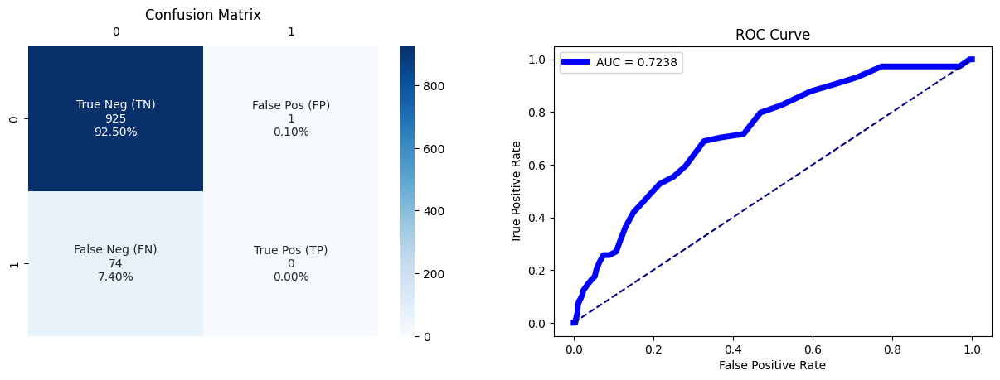

True negative   =  925
False positive  =  1
False negative  =  74
True positive   =  0
AUC : 0.7238
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.00      0.00      0.00        74

    accuracy                           0.93      1000
   macro avg       0.46      0.50      0.48      1000
weighted avg       0.86      0.93      0.89      1000

🏃 View run RandomOverSampler_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/53930ec405724d8eac6d4ac65b4d4a3c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomOverSampler_RandomForestClassifier,0.925,0.723819,0.0,0.0,0.0,0,0.0,74,0.578585,12.531332,0.203923


In [105]:
classifier_model = RandomForestClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>DecisionTreeClassifier </font>

Exécution en cours ....



Qualité de la classification RandomOverSampler_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.847
Le score de précision est de : 0.12381
Le score recall est de       : 0.17568
Le score f1 est de           : 0.14525
Le score AUC est de          : 0.53816


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),834 (TN),92 (FP)
Real Positive (1),61 (FN),13 (TP)


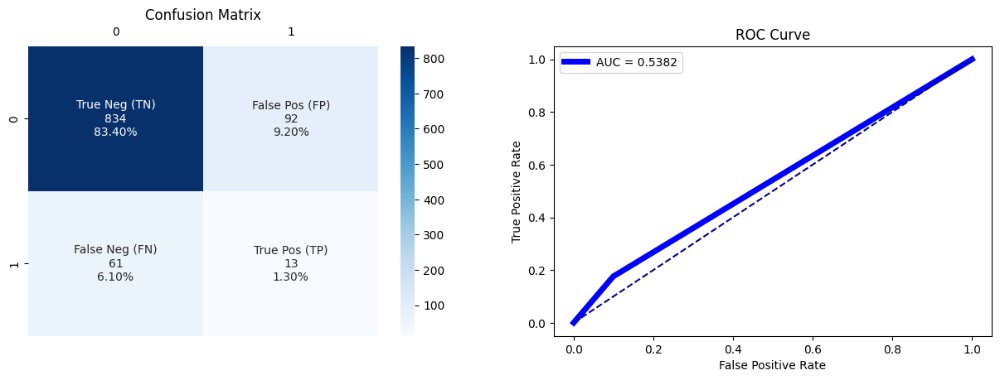

True negative   =  834
False positive  =  92
False negative  =  61
True positive   =  13
AUC : 0.5382
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       926
           1       0.12      0.18      0.15        74

    accuracy                           0.85      1000
   macro avg       0.53      0.54      0.53      1000
weighted avg       0.87      0.85      0.86      1000

🏃 View run RandomOverSampler_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/2bf2497ce0fb47ae88a7b2ecb2114f28
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomOverSampler_DecisionTreeClassifier,0.847,0.538162,0.175676,0.145251,0.162095,13,0.12381,61,0.595587,7.253274,0.184592


In [106]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>XGBClassifier</font>

Exécution en cours ....



Qualité de la classification RandomOverSampler_XGBClassifier 
 
L'accuracy score est de      : 0.884
Le score de précision est de : 0.18182
Le score recall est de       : 0.16216
Le score f1 est de           : 0.17143
Le score AUC est de          : 0.61819


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),872 (TN),54 (FP)
Real Positive (1),62 (FN),12 (TP)


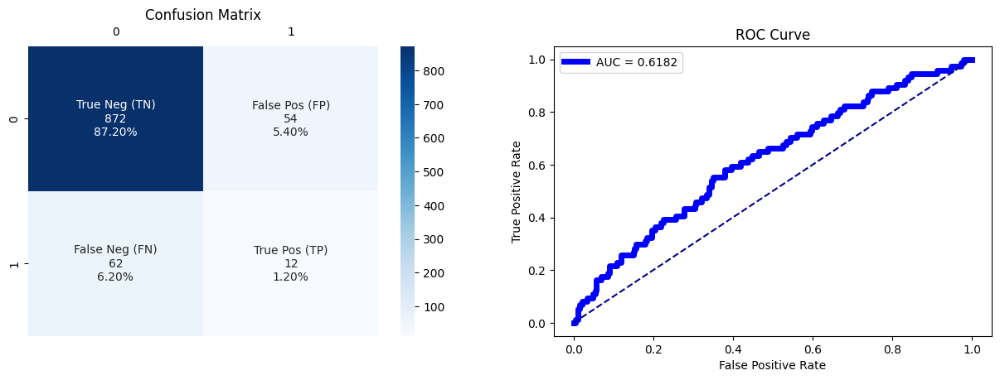

True negative   =  872
False positive  =  54
False negative  =  62
True positive   =  12
AUC : 0.6182
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       926
           1       0.18      0.16      0.17        74

    accuracy                           0.88      1000
   macro avg       0.56      0.55      0.55      1000
weighted avg       0.88      0.88      0.88      1000

🏃 View run RandomOverSampler_XGBClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/bf1e1e50b9c040c4b25bd98660a26c66
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomOverSampler_XGBClassifier,0.884,0.618192,0.162162,0.171429,0.165746,12,0.181818,62,0.61367,5.245476,0.219702


In [107]:
classifier_model = XGBClassifier(objective= 'binary:logistic', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

#### <font color='grey'>LGBMClassifier</font>

[LightGBM] [Info] Number of positive: 9185, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5555
[LightGBM] [Info] Number of data points in the train set: 18370, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 9185, number of negative: 9185
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5555
[LightGBM] [Info] Number of data points in the train set: 18370, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification RandomOverSampler_LGBMClassifier 
 
L'accuracy score est de      : 0.847
Le score de précision est de : 0.23841
Le score recall est de       : 0.48649
Le score f1 est de           : 0.32
Le score AUC est de          : 0.7028


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),811 (TN),115 (FP)
Real Positive (1),38 (FN),36 (TP)


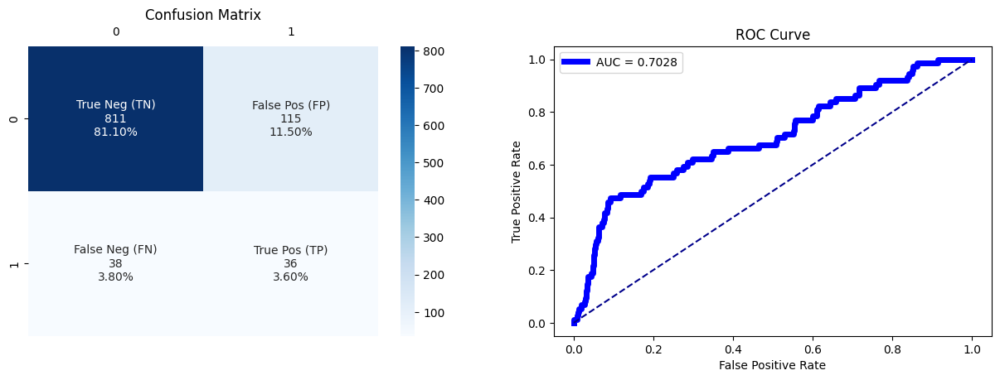

True negative   =  811
False positive  =  115
False negative  =  38
True positive   =  36
AUC : 0.7028
              precision    recall  f1-score   support

           0       0.96      0.88      0.91       926
           1       0.24      0.49      0.32        74

    accuracy                           0.85      1000
   macro avg       0.60      0.68      0.62      1000
weighted avg       0.90      0.85      0.87      1000

🏃 View run RandomOverSampler_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/155551941979991335/runs/17294d5cea0648188a8caad9f196d4bc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/155551941979991335


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,RandomOverSampler_LGBMClassifier,0.847,0.702805,0.486486,0.32,0.402685,36,0.238411,38,0.711987,8.812357,0.172845


In [108]:
classifier_model = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName        = f'{sample_name}_{classifier_model.__class__.__name__}'
run_name         = f'{sample_name}_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,
             globals()[f'X_train_{sample_name}'], globals()[f'y_train_{sample_name}'],
             X_test_scaled, y_test)
results()

### Bilan l'équilibrage

In [109]:
bilan_equilibrage = pd.concat(Sample_balancing, axis=0)
# Triez le DataFrame en utilisant sort_values
# bilan_equilibrage.sort_values(by        = ['AUC', 'TP', 'F1', 'Recall class 1', 'FN'],
#                               ascending = [True,   True, True, True,             False],
#                              inplace    = True,)
bilan_equilibrage.sort_values(by        = ['Recall class 1','AUC', 'score Gain', 'FN'],
                              ascending = [False,            False,  False,        True],
                             inplace    = True, )
# revoir les index
bilan_equilibrage = bilan_equilibrage.drop_duplicates()
bilan_equilibrage.reset_index(drop=True, inplace=True) 
bilan_equilibrage

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_LogisticRegression,0.636,0.723571,0.675676,0.215517,0.364431,50,0.128205,24,0.650859,5.819163,0.165066
1,RandomUnderSampler_LogisticRegression,0.629,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.385626,0.106076
2,RandomUnderSampler_LGBMClassifier,0.612,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.331949,0.200757
3,RandomOverSampler_LogisticRegression,0.637,0.719952,0.648649,0.209150,0.352423,48,0.124675,26,0.641362,7.055462,0.141767
4,RandomUnderSampler_XGBClassifier,0.631,0.649247,0.594595,0.192560,0.324006,44,0.114883,30,0.617366,4.969895,0.236477
5,RandomUnderSampler_RandomForestClassifier,0.627,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.295312,0.220237
6,RandomUnderSampler_DecisionTreeClassifier,0.561,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.563460,4.722429,0.165181
7,RandomOverSampler_LGBMClassifier,0.847,0.702805,0.486486,0.320000,0.402685,36,0.238411,38,0.711987,8.812357,0.172845
8,Class_Weight_LGBMClassifier,0.836,0.696836,0.418919,0.274336,0.345982,31,0.203947,43,0.679802,7.588734,0.213886
9,SMOTE_LogisticRegression,0.814,0.627328,0.283784,0.184211,0.233333,21,0.136364,53,0.615433,7.129946,0.141293


Les méthodes **RandomUnderSampler** et **class_weight** fournissent les meilleurs scores. Nous optons pour l'approche d'undersampling en utilisant **RandomUnderSampler** pour équilibrer nos données.  Toutefois, il est important de noter que l'argument **class_weight n'est pas pris en charge par tous les modèles**. Par conséquent, nous privilégions l'utilisation de **RandomUnderSampler**.

In [110]:
def highlight_max_and_min(s, colname):
    max_color = 'background-color: green'
    min_color = 'background-color: yellow'
    
    if colname in columns_to_highlight_max:
        is_max = s == s.max()
        return [max_color if v else '' for v in is_max]
    elif colname in columns_to_highlight_min:
        is_min = s == s.min()
        return [min_color if v else '' for v in is_min]
    else:
        return [''] * len(s)

In [111]:
columns_to_highlight_max = ['Accuracy', 'AUC', 'Recall class 1', 'F1', 'fbeta',  'Precision', 'score Gain']  # Colonnes pour mettre en couleur la valeur maximale en rouge
columns_to_highlight_min = ['FN']  # Colonnes pour mettre en couleur la valeur minimale en bleu

styled_df = bilan_equilibrage.style.apply(lambda x: highlight_max_and_min(x, x.name), axis=0)
styled_df

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Class_Weight_LogisticRegression,0.636000,0.723571,0.675676,0.215517,0.364431,50,0.128205,24,0.650859,5.819163,0.165066
1,RandomUnderSampler_LogisticRegression,0.629000,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.385626,0.106076
2,RandomUnderSampler_LGBMClassifier,0.612000,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.331949,0.200757
3,RandomOverSampler_LogisticRegression,0.637000,0.719952,0.648649,0.209150,0.352423,48,0.124675,26,0.641362,7.055462,0.141767
4,RandomUnderSampler_XGBClassifier,0.631000,0.649247,0.594595,0.192560,0.324006,44,0.114883,30,0.617366,4.969895,0.236477
5,RandomUnderSampler_RandomForestClassifier,0.627000,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.295312,0.220237
6,RandomUnderSampler_DecisionTreeClassifier,0.561000,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.563460,4.722429,0.165181
7,RandomOverSampler_LGBMClassifier,0.847000,0.702805,0.486486,0.320000,0.402685,36,0.238411,38,0.711987,8.812357,0.172845
8,Class_Weight_LGBMClassifier,0.836000,0.696836,0.418919,0.274336,0.345982,31,0.203947,43,0.679802,7.588734,0.213886
9,SMOTE_LogisticRegression,0.814000,0.627328,0.283784,0.184211,0.233333,21,0.136364,53,0.615433,7.129946,0.141293


In [ ]:
bilan_equilibrage.to_csv(f'{OUT_FOLDER}/sample_balancing.csv', index=False)

In [113]:
bilan_equilibrage=pd.read_csv(f'{OUT_FOLDER}/sample_balancing.csv')

In [114]:
def display_shape(data_list: list, space=15):
    for df in data_list:
        print('{:{}}: {}'.format(namestr(df), space, df.shape))
 

In [115]:
display_shape([X_train_RandomUnderSampler, y_train_RandomUnderSampler])

X_train_RandomUnderSampler: (1630, 100)
y_train_RandomUnderSampler: (1630,)


In [116]:
import pandas as pd
import pickle

def save_pickle(data: pd.DataFrame, filename: str, dossier: str):
    if not os.path.exists(dossier):
        os.makedirs(dossier)
    chemin = os_path_join(dossier, filename)
    with open(chemin, 'wb') as file:
        pickle.dump(data, file, pickle.HIGHEST_PROTOCOL)


def load_pickle(file_path: str):
    with open(file_path, 'rb') as file:
        data = pickle.load(file)
    return data


def list_pickles_files(directory: str, prefix: str = None):
    pickle_files = [filename for filename in os.listdir(directory)
                    if filename.endswith('.pickle')]

    if prefix is not None:
        pickle_files = [filename for filename in pickle_files
                        if filename.startswith(prefix)]

    return pickle_files

In [117]:
save_pickle(X_train_RandomUnderSampler, filename  = 'X_train.pickle', dossier = f'{OUT_FOLDER}')
save_pickle(y_train_RandomUnderSampler, filename  = 'y_train.pickle', dossier = f'{OUT_FOLDER}')
save_pickle(X_test_scaled,              filename  = 'X_test.pickle',  dossier = f'{OUT_FOLDER}')
save_pickle(y_test,                     filename  = 'y_test.pickle',  dossier = f'{OUT_FOLDER}')

In [118]:
# Chargement des fichiers
X_train = load_pickle(file_path = f'{OUT_FOLDER}/X_train.pickle')
X_test  = load_pickle(file_path = f'{OUT_FOLDER}/X_test.pickle')
y_train = load_pickle(file_path = f'{OUT_FOLDER}/y_train.pickle')
y_test  = load_pickle(file_path = f'{OUT_FOLDER}/y_test.pickle')

### Modèles de classification

Nous allons tester ces differentes différents algorithmes : 

- **Dummy Classifier** : ne prend pas en compte les caractéristiques du jeu de données et se contente de faire des prédictions en utilisant des règles simples. Ici, on renvoie l'étiquette de classe la plus fréquente dans l'argument y observé.


- **Logistic Regression** : le but est de trouver une relation mathématique entre les variables d'entrée (features) et la variable de sortie (classe prédite). Cette relation est généralement exprimée sous la forme d'une fonction logistique qui transforme la sortie en une probabilité.


- **SVC**: L'algorithme fonctionne en trouvant un hyperplan optimal qui sépare les données d'entraînement en différentes classes. L'hyperplan est déterminé de manière à maximiser la marge entre les points de données de chaque classe. Les points de données les plus proches de l'hyperplan sont appelés vecteurs de support.


- **Decision Tree**: algorithme d'apprentissage automatique qui prend un ensemble de données en entrée et construit un modèle prédictif sous forme d'arbre hiérarchique. Chaque nœud de l'arbre représente une caractéristique de l'ensemble de données, chaque branche représente une règle de décision basée sur cette caractéristique, et chaque feuille représente une classe ou une valeur prédite.


- **Random Forest** : algorithme d'apprentissage automatique qui combine plusieurs arbres de décision pour effectuer des prédictions. Chaque arbre de la forêt donne une prédiction et la classe prédite est déterminée par un vote majoritaire.


- **XG Boost** : utilise un ensemble de modèles d'arbres de décision pour effectuer des prédictions. L'algorithme fonctionne en itérations successives pour minimiser une fonction de perte spécifiée et ajouter des arbres qui réduisent cette perte.


- **Light GBM** : algorithme d'apprentissage automatique basé sur le gradient boosting qui est conçu pour offrir une exécution rapide et des performances élevées. Il utilise une technique d'échantillonnage basée sur le gradient pour sélectionner les échantillons les plus informatifs pendant le processus d'apprentissage.

## <a id="6.1">6.1  Baseline: Dummy Classifier </a>

In [119]:
mlflow.set_experiment('Modelisation')

<Experiment: artifact_location='mlflow-artifacts:/222944586657416466', creation_time=1734692325729, experiment_id='222944586657416466', last_update_time=1734692325729, lifecycle_stage='active', name='Modelisation', tags={}>

In [120]:
def model_classifier(model, ModelName, X_train, y_train):
        # Entrainement du modèle
        model.fit(X_train, y_train)

        # Classification
        model, accuracy, precision, recall, f1, AUC, fbeta_score, prediction, probability, execution_time, prediction_time, resume_prediction_class, probability_positive_clas =\
        classification(model, X_train, y_train, X_test, y_test, ModelName, file_name =None)

        # Matrice de confusion
        df_matrice_confusion = matrix_TN_FN(y_test, prediction)
        display(df_matrice_confusion)

         # Courbe ROC
        tn, fp, fn, tp = cf_matrix_roc_auc(y_test, prediction, probability, (15,10))

        score_gain     = score_banq(tn, fp, fn, tp, 10, -1, -100, 0)
        display(score_gain)

        roc_auc        = roc_auc_score(y_test, probability[:,1])  # on se base sur la probabilité d'être en défaut de paiement
        print('AUC : %0.4f' %roc_auc)
        print(classification_report(y_test, prediction))

        print("test_score_métier ", score_gain)
        print("test_accuracy     ", accuracy)
        print("test_precision    ", precision)
        print("test_recall       ", recall)
        print("test_f1_score     ", f1_score)
        print("test_fbeta_score  ", fbeta_score)
        print("test_rocauc       ", roc_auc)
        return  accuracy, roc_auc, recall, f1, fbeta_score, tp, precision, fn, score_gain, prediction, probability, execution_time, prediction_time

In [121]:
models_perf = []

def results_models():
    res = pd.DataFrame(
        {
            "Modele": [ModelName],
            "Accuracy": [accuracy],
            "AUC": [AUC],
            "Recall class 1": [recall],
            "F1": [f1],
            "fbeta": [fbeta_score],
            "TP": [tp],
            "Precision": [precision],
            "FN": [fn],
            "score Gain": [score_gain],
            "train_time": [execution_time],
            "predict_time": [prediction_time],
        }
    )
    models_perf.append(res)
    return res

C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Exécution en cours ....



C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Qualité de la classification Model_Dummy_Classifier 
 
L'accuracy score est de      : 0.926
Le score de précision est de : 0.0
Le score recall est de       : 0.0
Le score f1 est de           : 0.0
Le score AUC est de          : 0.5


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),926 (TN),0 (FP)
Real Positive (1),74 (FN),0 (TP)


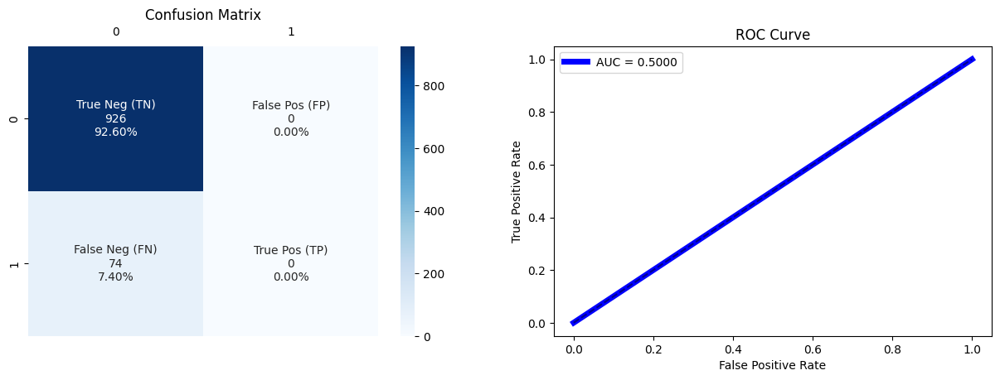

True negative   =  926
False positive  =  0
False negative  =  74
True positive   =  0
AUC : 0.5000
              precision    recall  f1-score   support

           0       0.93      1.00      0.96       926
           1       0.00      0.00      0.00        74

    accuracy                           0.93      1000
   macro avg       0.46      0.50      0.48      1000
weighted avg       0.86      0.93      0.89      1000



C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

🏃 View run Model_Dummy_Classifier at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/0131c73e56a24f61a970264507204a44
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_Dummy_Classifier,0.926,0.5,0.0,0.0,0.0,0,0.0,74,0.579211,4.261703,0.220759


In [122]:
classifier_model = DummyClassifier(random_state = RANDOM_SEED)
ModelName        = 'Model_Dummy_Classifier'
run_name         = 'Model_Dummy_Classifier'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

In [123]:
# model     = DummyClassifier(random_state = RANDOM_SEED)
# ModelName = 'Dummy Classifier'
# run_name  = 'Dummy Classifier'
# accuracy, _, recall, f1, fbeta_score, tp, precision, fn, score_gain, prediction, probability, execution_time, prediction_time=\
# model_classifier(model, ModelName, X_train_under, y_train_under)

# results_models()

Grâce à la matrice de confusion, on constate que le Dummy Classifier prédit bien seulement la classe 0 (client ne faisant pas défaut) et contient donc beaucoup de faux négatifs (mauvais client prédit bon client). C'est la raison pour laquelle il possède un score métier relativement faible (car ce dernier pénalise plus fortement les faux négatifs).

La plupart de nos scores sont à 0 puisque le modèle ne prédit aucune valeur positive. Les scores sont donc estimés à 0 puisque cela engendre une division par 0.

On constate que l'AUC est de 0.5 comme c'est le cas pour les modèles baseline.

Score métier maximum : 1.86
Threshold optimal    : 0.5


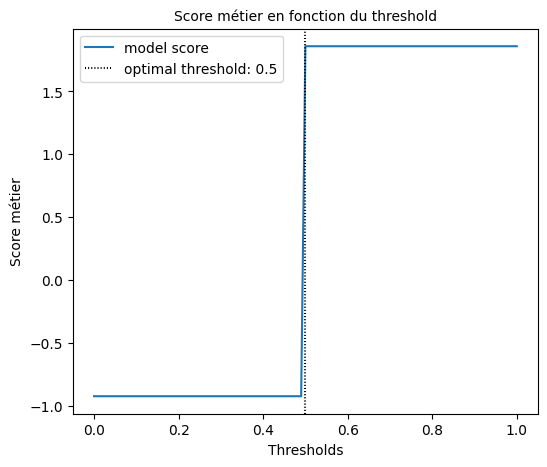

In [124]:
score_metier_max(probability[:, 1], y_test, verbose=True)

## <a id="6.2">6.2 Logistic Regression </a>

Exécution en cours ....



Qualité de la classification Model_LogisticRegression 
 
L'accuracy score est de      : 0.629
Le score de précision est de : 0.12405
Le score recall est de       : 0.66216
Le score f1 est de           : 0.20896
Le score AUC est de          : 0.70548


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),580 (TN),346 (FP)
Real Positive (1),25 (FN),49 (TP)


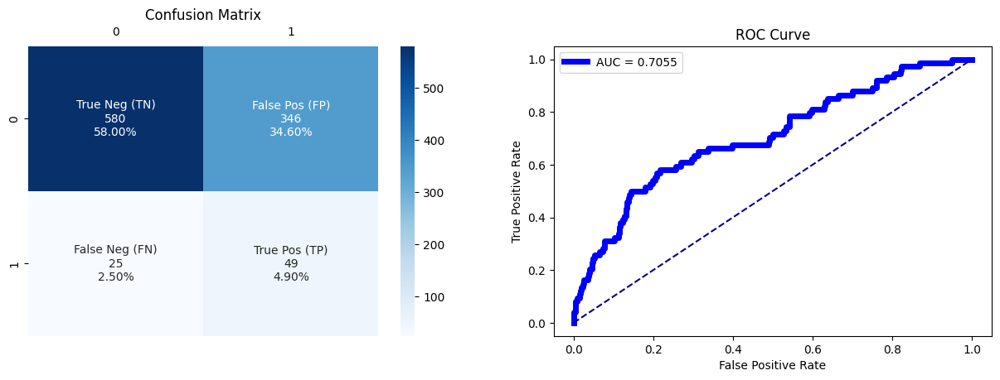

True negative   =  580
False positive  =  346
False negative  =  25
True positive   =  49
AUC : 0.7055
              precision    recall  f1-score   support

           0       0.96      0.63      0.76       926
           1       0.12      0.66      0.21        74

    accuracy                           0.63      1000
   macro avg       0.54      0.64      0.48      1000
weighted avg       0.90      0.63      0.72      1000

🏃 View run Model_LogisticRegression at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/f0743d00dd9f4ba59cc00fe81852d8fa
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_LogisticRegression,0.629,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.178574,0.068067


In [125]:
classifier_model = LogisticRegression(max_iter=1500, random_state=RANDOM_STATE)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

In [126]:
# model     = LogisticRegression(max_iter=1000, random_state = RANDOM_SEED)
# ModelName = 'Logistic Regression'
# run_name  = 'Logistic Regression'
# accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, prediction, probability, execution_time, prediction_time=\
# model_classifier(model, ModelName, X_train, y_train)
# results_models()

Le score métier est nettement plus élevé à 0.68.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision. 

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.75.

Score métier maximum : 4.09
Threshold optimal    : 0.67


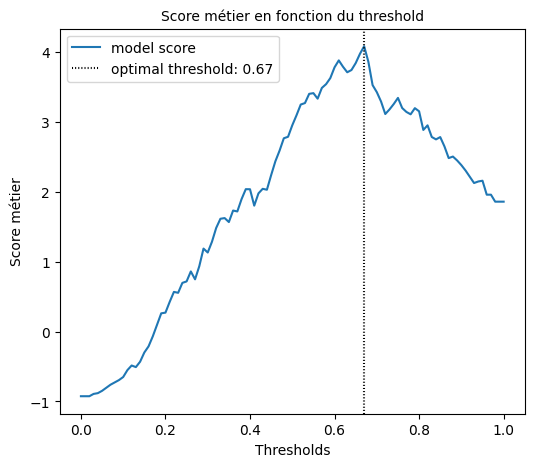

In [127]:
score_metier_max(probability[:, 1], y_test, verbose=True)

Le score métier semble optimal quand le seuil est fixé à 0.56, cependant l'augmentation est minime.

## <a id="6.2">6.3 SVC (Support Vector Classifier) </a>

Exécution en cours ....



Qualité de la classification Model_SVC 
 
L'accuracy score est de      : 0.611
Le score de précision est de : 0.12048
Le score recall est de       : 0.67568
Le score f1 est de           : 0.2045
Le score AUC est de          : 0.6626


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),561 (TN),365 (FP)
Real Positive (1),24 (FN),50 (TP)


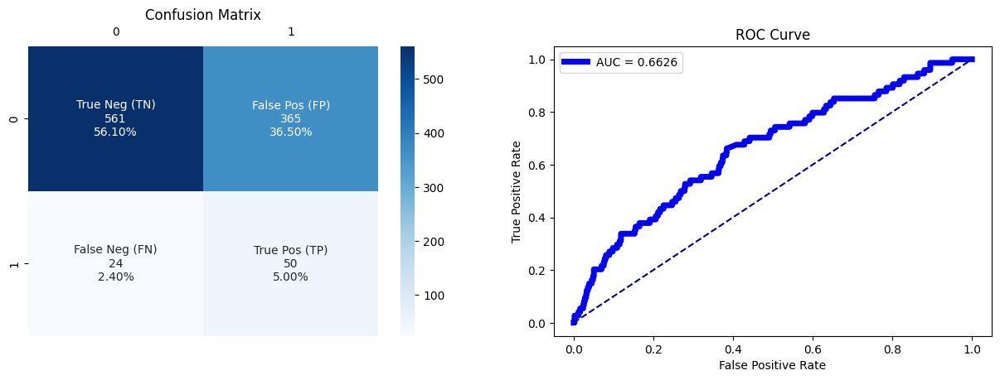

True negative   =  561
False positive  =  365
False negative  =  24
True positive   =  50
AUC : 0.6626
              precision    recall  f1-score   support

           0       0.96      0.61      0.74       926
           1       0.12      0.68      0.20        74

    accuracy                           0.61      1000
   macro avg       0.54      0.64      0.47      1000
weighted avg       0.90      0.61      0.70      1000

🏃 View run Model_SVC at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/2ffdbbdb047c4143b1e6ec06515830ee
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_SVC,0.611,0.6626,0.675676,0.204499,0.351617,50,0.120482,24,0.635221,6.426555,0.361124


In [128]:
classifier_model = SVC(random_state = RANDOM_STATE, probability=True)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

Le score métier est légèrement dégradé par rapport à la regression logistique à 0.39, mais bien supérieur à la baseline.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision.

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.69.

Score métier maximum : 3.14
Threshold optimal    : 0.66


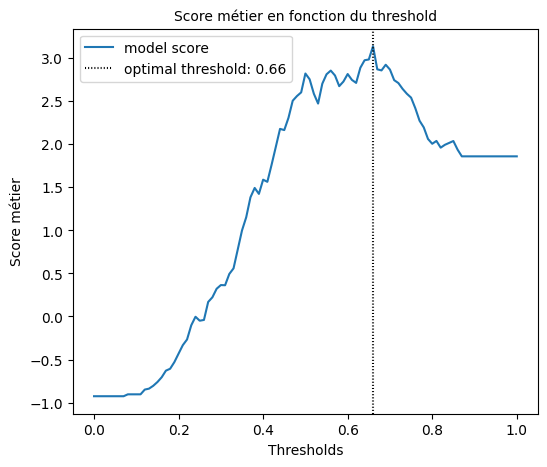

In [129]:
score_metier_max(probability[:, 1], y_test, verbose=True)

Le score métier semble optimal quand le seuil est fixé à 0.53, cependant l'augmentation est minime.

## <a id="6.4">6.4 Decision Tree</a>

Exécution en cours ....



Qualité de la classification Model_DecisionTreeClassifier 
 
L'accuracy score est de      : 0.561
Le score de précision est de : 0.09354
Le score recall est de       : 0.56757
Le score f1 est de           : 0.16061
Le score AUC est de          : 0.56402


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),519 (TN),407 (FP)
Real Positive (1),32 (FN),42 (TP)


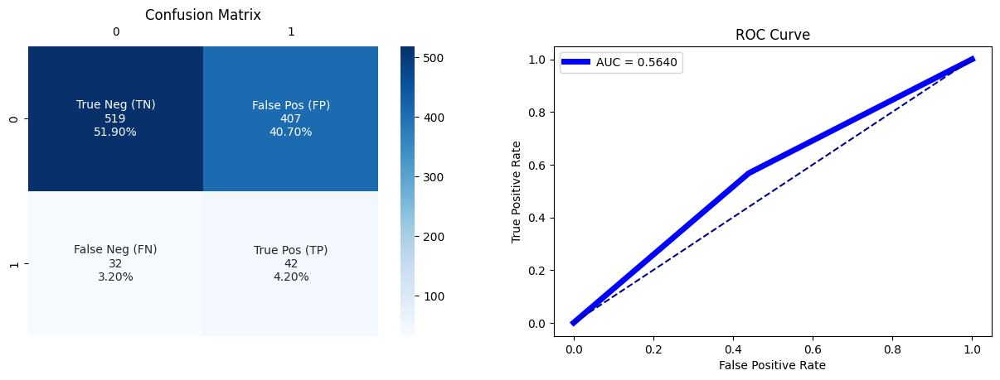

True negative   =  519
False positive  =  407
False negative  =  32
True positive   =  42
AUC : 0.5640
              precision    recall  f1-score   support

           0       0.94      0.56      0.70       926
           1       0.09      0.57      0.16        74

    accuracy                           0.56      1000
   macro avg       0.52      0.56      0.43      1000
weighted avg       0.88      0.56      0.66      1000

🏃 View run Model_DecisionTreeClassifier at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/4f6aaa9013894d68ba293e80524adfc9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_DecisionTreeClassifier,0.561,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.56346,4.802025,0.187813


In [130]:
classifier_model = DecisionTreeClassifier(random_state = RANDOM_STATE)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

Le score métier est dégradé par rapport à la regression logistique à 0.21, mais reste plus élevé que la baseline.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision.

On constate que le score ROC AUC est légèrement amélioré par rapport à la baseline et est de 0.59.

Score métier maximum : 1.86
Threshold optimal    : 1.0


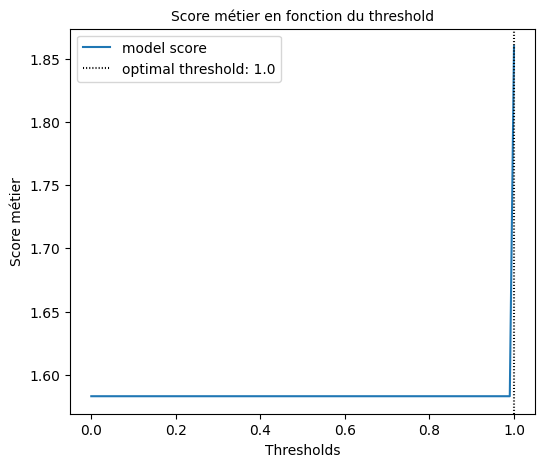

In [131]:
score_metier_max(probability[:, 1], y_test, verbose=True)

On constate que peu importe le seuil, le score métier reste le même avec ce modèle.

## <a id="6.5">6.5 Random Forest Classifier </a>

Exécution en cours ....



Qualité de la classification Model_RandomForestClassifier 
 
L'accuracy score est de      : 0.627
Le score de précision est de : 0.11169
Le score recall est de       : 0.58108
Le score f1 est de           : 0.18736
Le score AUC est de          : 0.66596


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),584 (TN),342 (FP)
Real Positive (1),31 (FN),43 (TP)


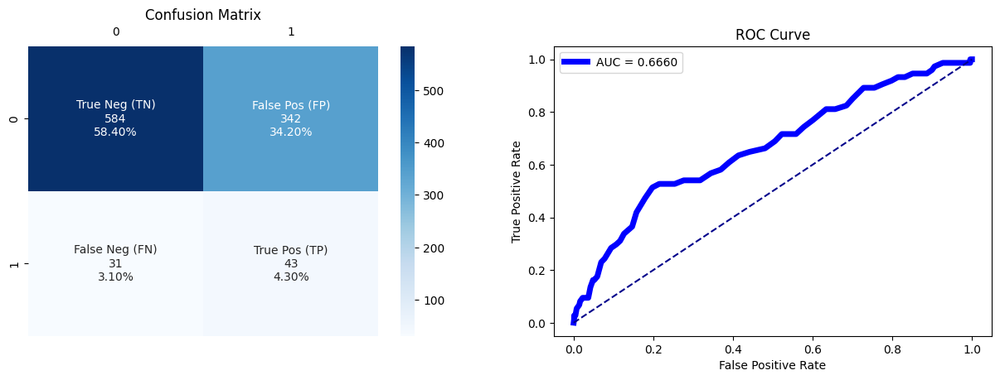

True negative   =  584
False positive  =  342
False negative  =  31
True positive   =  43
AUC : 0.6660
              precision    recall  f1-score   support

           0       0.95      0.63      0.76       926
           1       0.11      0.58      0.19        74

    accuracy                           0.63      1000
   macro avg       0.53      0.61      0.47      1000
weighted avg       0.89      0.63      0.72      1000

🏃 View run Model_RandomForestClassifier at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/d2b16a138e464f2c92cc1f6418774ccb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_RandomForestClassifier,0.627,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.526096,0.247375


In [132]:
classifier_model = RandomForestClassifier(random_state = RANDOM_SEED)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

Le score métier est légèrement dégradé par rapport à la regression logistique à 0.38.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision. 

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.69.

Score métier maximum : 3.65
Threshold optimal    : 0.58


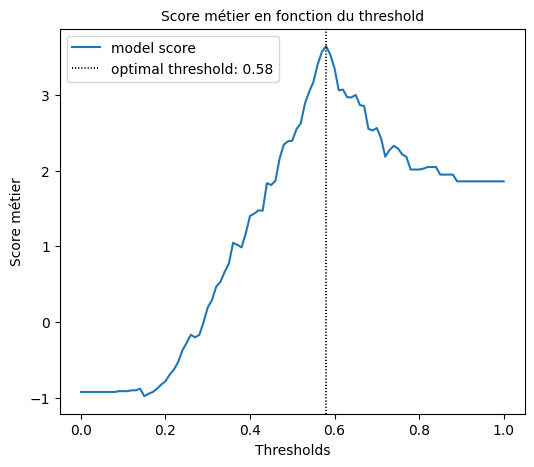

In [133]:
score_metier_max(probability[:, 1], y_test, verbose=True)

Le score métier semble optimal quand le seuil est fixé à 0.52, cependant l'augmentation est minime.

## <a id="6.6">6.6 XGBoost Classifier </a>

Exécution en cours ....



Qualité de la classification Model_XGBClassifier 
 
L'accuracy score est de      : 0.631
Le score de précision est de : 0.11488
Le score recall est de       : 0.59459
Le score f1 est de           : 0.19256
Le score AUC est de          : 0.64925


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),587 (TN),339 (FP)
Real Positive (1),30 (FN),44 (TP)


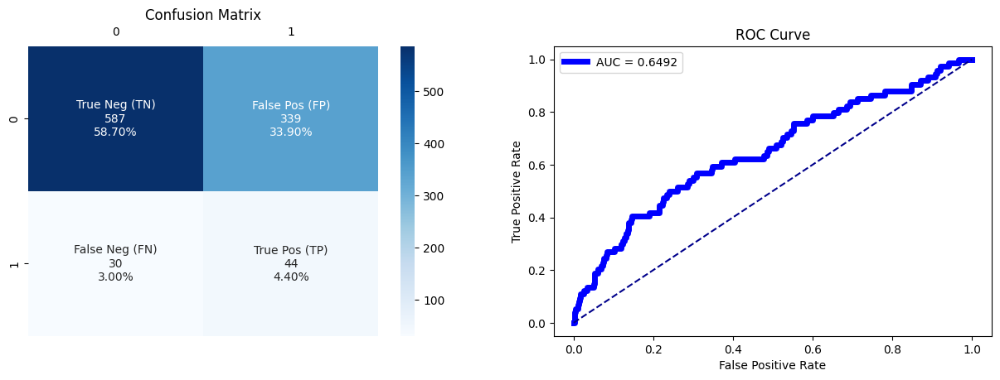

True negative   =  587
False positive  =  339
False negative  =  30
True positive   =  44
AUC : 0.6492
              precision    recall  f1-score   support

           0       0.95      0.63      0.76       926
           1       0.11      0.59      0.19        74

    accuracy                           0.63      1000
   macro avg       0.53      0.61      0.48      1000
weighted avg       0.89      0.63      0.72      1000

🏃 View run Model_XGBClassifier at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/88d901f105524c5999d04a8cc1e69d25
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_XGBClassifier,0.631,0.649247,0.594595,0.19256,0.324006,44,0.114883,30,0.617366,4.916634,0.203893


In [134]:
classifier_model = XGBClassifier(random_state = RANDOM_SEED)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

Le score métier est légèrement plus élevé par rapport à Random Forest à 0.39.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision. 

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.70.

Score métier maximum : 3.36
Threshold optimal    : 0.85


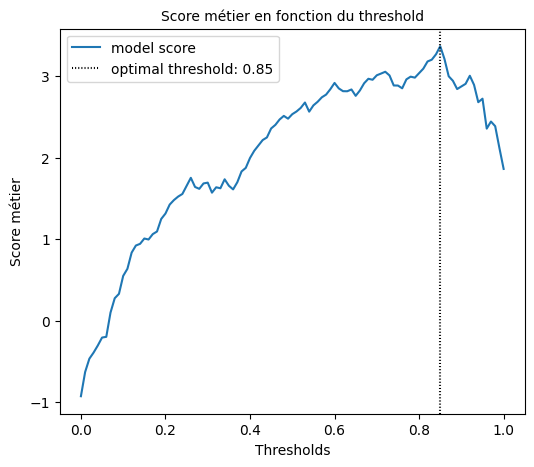

In [135]:
score_metier_max(probability[:, 1], y_test, verbose=True)

Le score métier semble optimal quand le seuil est fixé à 0.55.

## <a id="6.7">6.7 Light GBM </a>

[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification Model_LGBMClassifier 
 
L'accuracy score est de      : 0.612
Le score de précision est de : 0.11893
Le score recall est de       : 0.66216
Le score f1 est de           : 0.20165
Le score AUC est de          : 0.68446


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),563 (TN),363 (FP)
Real Positive (1),25 (FN),49 (TP)


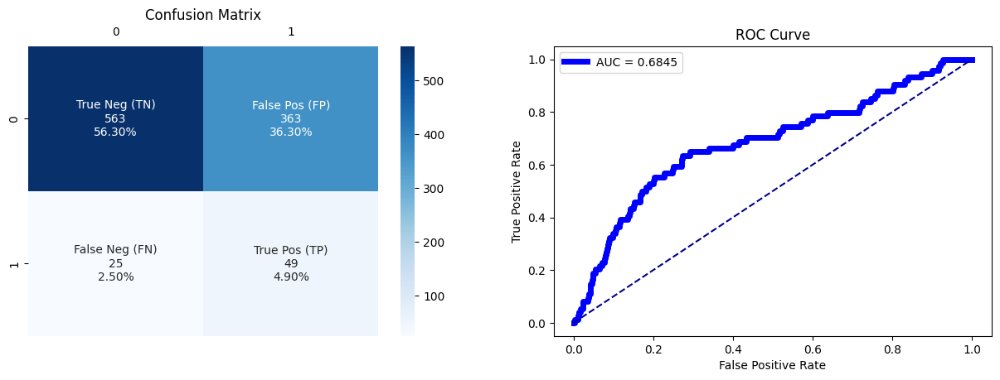

True negative   =  563
False positive  =  363
False negative  =  25
True positive   =  49
AUC : 0.6845
              precision    recall  f1-score   support

           0       0.96      0.61      0.74       926
           1       0.12      0.66      0.20        74

    accuracy                           0.61      1000
   macro avg       0.54      0.64      0.47      1000
weighted avg       0.90      0.61      0.70      1000

🏃 View run Model_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/222944586657416466/runs/288f38126818416f8b6aba7038ad0f95
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/222944586657416466


,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_LGBMClassifier,0.612,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.345925,0.235028


In [136]:
classifier_model = LGBMClassifier(random_state = RANDOM_SEED)
ModelName        = f'Model_{classifier_model.__class__.__name__}'
run_name         = f'Model_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(classifier_model, ModelName, run_name,  X_train, y_train, X_test, y_test)

results_models()

Le score métier est légèrement plus élevé par rapport à XGBoots à 0.41.

La matrice de confusion nous permet de constater que les FN sont présents en moins grande quantité que les autres catégories. Le modèle présente cependant une grande quantité de FP.

Le f-béta score est effectivement plus élevé que le f-score puisque le recall est plus élevé que la précision, ce score étant établit ici pour privilégier le recall à la précision. 

On constate que le score ROC AUC est amélioré par rapport à la baseline et est de 0.71.

Score métier maximum : 3.89
Threshold optimal    : 0.6900000000000001


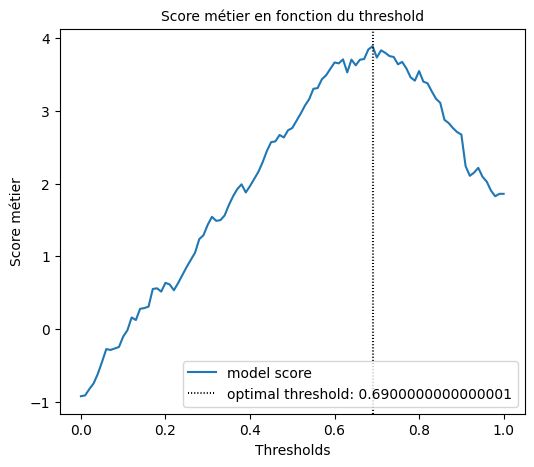

In [137]:
score_metier_max(probability[:, 1], y_test, verbose=True)

### Bilan

In [138]:
model_performance = pd.concat(models_perf, axis=0)
model_performance.sort_values(by        = ['Recall class 1','AUC', 'score Gain', 'FN'],
                              ascending = [False,            False,  False,        True],
                             inplace    = True, )

model_performance = (model_performance.loc[model_performance.Modele.str.contains('Model', case=False),:]
                     .drop_duplicates())
model_performance.reset_index(drop=True, inplace=True) 
model_performance

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_SVC,0.611,0.662600,0.675676,0.204499,0.351617,50,0.120482,24,0.635221,6.426555,0.361124
1,Model_LogisticRegression,0.629,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.178574,0.068067
2,Model_LGBMClassifier,0.612,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.345925,0.235028
3,Model_XGBClassifier,0.631,0.649247,0.594595,0.192560,0.324006,44,0.114883,30,0.617366,4.916634,0.203893
4,Model_RandomForestClassifier,0.627,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.526096,0.247375
5,Model_DecisionTreeClassifier,0.561,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.563460,4.802025,0.187813
6,Model_Dummy_Classifier,0.926,0.500000,0.000000,0.000000,0.000000,0,0.000000,74,0.579211,4.261703,0.220759


In [139]:
columns_to_highlight_max = ['Accuracy', 'AUC', 'Recall class 1', 'F1', 'fbeta',  'Precision', 'score Gain']  # Colonnes pour mettre en couleur la valeur maximale en rouge
columns_to_highlight_min = ['FN']  # Colonnes pour mettre en couleur la valeur minimale en bleu

styled_model_df = model_performance.iloc[0:,:].style.apply(lambda x: highlight_max_and_min(x, x.name), axis=0)
styled_model_df

,Modele,Accuracy,AUC,Recall class 1,F1,fbeta,TP,Precision,FN,score Gain,train_time,predict_time
0,Model_SVC,0.611000,0.662600,0.675676,0.204499,0.351617,50,0.120482,24,0.635221,6.426555,0.361124
1,Model_LogisticRegression,0.629000,0.705475,0.662162,0.208955,0.354559,49,0.124051,25,0.641419,4.178574,0.068067
2,Model_LGBMClassifier,0.612000,0.684461,0.662162,0.201646,0.346045,49,0.118932,25,0.630786,6.345925,0.235028
3,Model_XGBClassifier,0.631000,0.649247,0.594595,0.192560,0.324006,44,0.114883,30,0.617366,4.916634,0.203893
4,Model_RandomForestClassifier,0.627000,0.665964,0.581081,0.187364,0.315712,43,0.111688,31,0.609803,5.526096,0.247375
5,Model_DecisionTreeClassifier,0.561000,0.564021,0.567568,0.160612,0.281879,42,0.093541,32,0.563460,4.802025,0.187813
6,Model_Dummy_Classifier,0.926000,0.500000,0.000000,0.000000,0.000000,0,0.000000,74,0.579211,4.261703,0.220759


In [140]:
model_performance.to_csv(f'{OUT_FOLDER}/model_performances.csv', index=False)

### Optimisation du modèle

In [141]:
mlflow.set_experiment('Model optimal')

<Experiment: artifact_location='mlflow-artifacts:/600411556294991769', creation_time=1734692412157, experiment_id='600411556294991769', last_update_time=1734692412157, lifecycle_stage='active', name='Model optimal', tags={}>

In [142]:
def model_best_params(model, param_grid, score, ModelName, run_name, X_train, y_train, X_test, y_test):
    classifier_grid        = GridSearchCV(model, param_grid, 
                                          scoring = score, 
                                          cv = 4, n_jobs = -1, verbose = 1)  
    classifier_grid.fit(X_train, y_train)

    params_name            = f'best_params_{model.__class__.__name__}'
    globals()[params_name] = classifier_grid.best_params_

    print("  ")
    print("Nom du modèle         :", ModelName)
    print("best params name      :", params_name)
    print("best params values    :", globals()[params_name])
    print(f"Score {score} Train  :", classifier_grid.best_score_)
    
    # Injectez les meilleurs paramètres dans le modèle
    model.set_params(**globals()[params_name])
    model.fit(X_train, y_train)
    
    # Sauvegarde du modèle
    with open(f'{MODEL_FOLDER}/{ModelName}.pkl', 'wb') as model_file:
        pickle.dump(model, model_file)
    
    #  MLFLOW
    model_mlflow(model, ModelName, run_name, X_train, y_train, X_test, y_test)
        
    return model, globals()[params_name]

In [143]:
# # Fixer les valeurs des hyperparamètres à tester
# param_grid = {
#         'n_estimators'  : [50, 100, 150, 200, 500, 1000, 1500], # np.arange(50, 1500, 200),
#         'max_depth'     : [-1, 2, 5, 7],
#         'num_leaves'    : [2, 7, 10, 30, 60, 100],
#         'learning_rate' : [0.001, 0.01, 0.1, 0.5, 1],
#         }
# score      = 'roc_auc'
# model      = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
# ModelName  = f'{model.__class__.__name__}'
# run_name   = f'{model.__class__.__name__}'

# globals()[f'best_params_{model.__class__.__name__}'] = \
# model_best_params(model, param_grid, score, X_train, y_train)

Fitting 4 folds for each of 144 candidates, totalling 576 fits
[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


🏃 View run languid-swan-915 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/22182099c3154ddc9b55370ec621f421
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
🏃 View run mysterious-koi-930 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/17e47d004de3420285a4dc2c5a67b941
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
🏃 View run learned-moose-904 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/53abae4f3c2b4676b6cf8a04d0a13a97
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
🏃 View run omniscient-tern-881 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4aeadb9870194c549a7190f8245dbd91
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
🏃 View run classy-quail-781 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e9b34401c97e43f0ac44165817a73f2a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600

🏃 View run persistent-jay-264 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0c1536bcc0c34c9f8ed110c5c193795a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002990 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....

[LightGBM] [Info] Number of positive: 815, number of negative: 815
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3791
[LightGBM] [Info] Number of data points in the train set: 1630, number of used features: 83
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification best_LGBMClassifier 
 
L'accuracy score est de      : 0.632
Le score de précision est de : 0.12113
Le score recall est de       : 0.63514
Le score f1 est de           : 0.20346
Le score AUC est de          : 0.69886


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),585 (TN),341 (FP)
Real Positive (1),27 (FN),47 (TP)


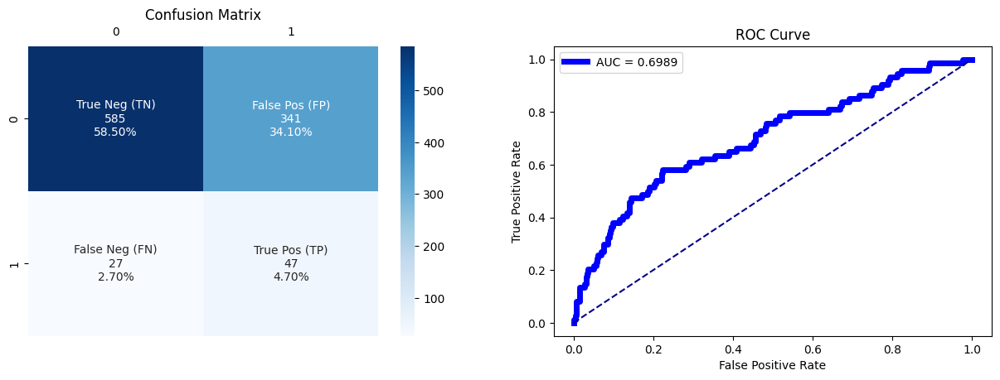

True negative   =  585
False positive  =  341
False negative  =  27
True positive   =  47
AUC : 0.6989
              precision    recall  f1-score   support

           0       0.96      0.63      0.76       926
           1       0.12      0.64      0.20        74

    accuracy                           0.63      1000
   macro avg       0.54      0.63      0.48      1000
weighted avg       0.89      0.63      0.72      1000

🏃 View run best_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/240b5f7f53564025a93d60e0199b26b6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


In [144]:
# Fixer les valeurs des hyperparamètres à tester
param_grid = {
        'n_estimators'  : [100, 500, 1000, 1500], # np.arange(50, 1500, 200),
        'max_depth'     : [-1, 2, 5, 20],
        'num_leaves'    : [2, 7, 50],
        'learning_rate' : [0.01, 0.1, 0.2],
        }
score      = 'roc_auc'
model      = LGBMClassifier(objective='binary', random_state = RANDOM_STATE)
ModelName  = f'best_{model.__class__.__name__}'
run_name   = f'best_{model.__class__.__name__}'
globals()[model], globals()[f'best_params_{model.__class__.__name__}'] = \
model_best_params(model, param_grid, score, ModelName, run_name, X_train, y_train, X_test, y_test)

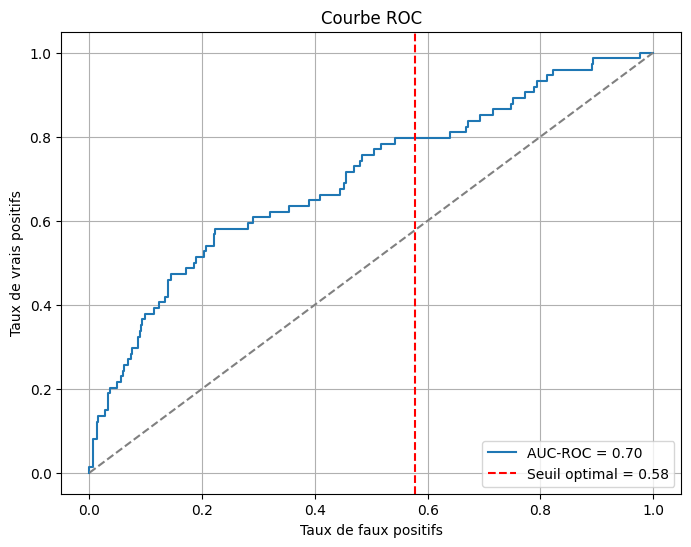

Seuil optimal: 0.58


In [145]:
import numpy as np
import lightgbm as lgb
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Supposons que vous avez déjà entraîné votre modèle LGBMClassifier et obtenu des prédictions de probabilité
# sur l'ensemble de validation ou de test.
y_true = y_test  # Vos vraies étiquettes
y_prob = model.predict_proba(X_test)[:, 1]  # Probabilités de classe positive

# Calcul de la courbe ROC
fpr, tpr, thresholds = roc_curve(y_true, y_prob)

# Calcul de l'AUC-ROC
auc_roc = roc_auc_score(y_true, y_prob)

# Trouver le seuil optimal
optimal_threshold = thresholds[np.argmax(tpr - fpr)]

# Afficher la courbe ROC avec le seuil optimal
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC-ROC = {auc_roc:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.axvline(optimal_threshold, color='r', linestyle='--', label=f'Seuil optimal = {optimal_threshold:.2f}')
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC')
plt.legend(loc='lower right')
plt.grid()
plt.show()

print(f"Seuil optimal: {optimal_threshold:.2f}")


In [146]:
y_true = y_test  # Vos vraies étiquettes
y_prob = model.predict_proba(X_test)[:, 1]  # Probabilités de classe positive
# Calcul de la courbe ROC
fpr, tpr, thresholds = roc_curve(y_true, y_prob)

Score métier maximum : 3.79
Threshold optimal    : 0.58


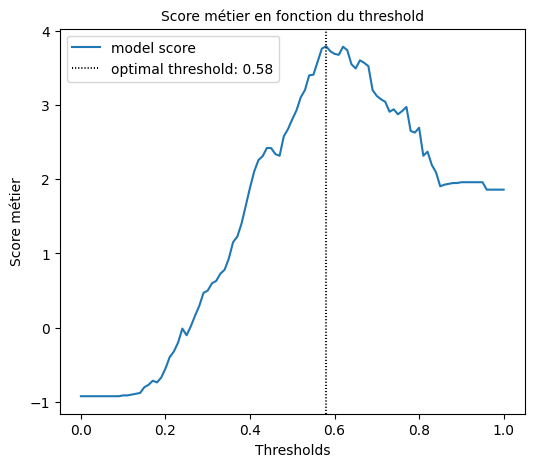

In [147]:
score_metier_max(y_prob, y_test, verbose=True)

In [148]:
model

LGBMClassifier(learning_rate=0.2, num_leaves=2, objective='binary',
               random_state=42)

---------
**Notre modèle final** est donc un **Light GBM** avec les paramètres `max_depth=2, n_estimators=1000, num_leaves=7, objective='binary',  random_state=42` et un seuil à **0.50**. 

In [149]:
globals()[f'best_params_{model.__class__.__name__}']

{'learning_rate': 0.2, 'max_depth': -1, 'n_estimators': 100, 'num_leaves': 2}

In [150]:
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.2,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 2,
 'objective': 'binary',
 'random_state': 42,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [151]:
import joblib

def save_model(model, ModelName, ModelFolder):
    """
    Enregistre un modèle scikit-learn au format Joblib (.joblib) dans un dossier spécifié.

    Args:
        model: Le modèle scikit-learn que vous souhaitez enregistrer.
        ModelName (str): Le nom que vous souhaitez donner au modèle enregistré (sans l'extension .joblib).
        ModelFolder (str): Le chemin du dossier où vous souhaitez enregistrer le modèle.

    Returns:
        str: Un message de réussite ou d'erreur pour indiquer si l'enregistrement a réussi.

    Example:
        # Définissez le chemin du dossier où vous souhaitez enregistrer le modèle
        MODEL_FOLDER = '/chemin/vers/le/dossier'

        # Appel de la fonction pour enregistrer le modèle
        result_message = save_model(model, 'nom_du_modele', MODEL_FOLDER)
        print(result_message)
    """
    try:
        joblib.dump(model, f'{ModelFolder}/{ModelName}.joblib')
        return f"Modèle {ModelFolder}/{ModelName}.joblib enregistré avec succès."
    except Exception as e:
        return f"Erreur lors de l'enregistrement du modèle {ModelFolder}/{ModelName}.joblib : " + str(e)

    
save_model(model, ModelName, ModelFolder = MODEL_FOLDER)

'Modèle ./Models/best_LGBMClassifier.joblib enregistré avec succès.'

In [152]:
model

LGBMClassifier(learning_rate=0.2, num_leaves=2, objective='binary',
               random_state=42)

In [153]:
import joblib

def load_model(ModelName, ModelFolder):
    """
    Charge un modèle scikit-learn à partir d'un fichier au format Joblib (.joblib) dans un dossier spécifié.

    Args:
        ModelName (str): Le nom du modèle à charger (sans l'extension .joblib).
        ModelFolder (str): Le chemin du dossier où se trouve le modèle.

    Returns:
        object: Le modèle chargé depuis le fichier .joblib.
    """
    try:
        model_path = f"{ModelFolder}/{ModelName}.joblib"
        loaded_model = joblib.load(model_path)
        return loaded_model
    except Exception as e:
        return f"Erreur lors du chargement du modèle {ModelName}.joblib : " + str(e)
    
model1 = load_model(ModelName, ModelFolder = MODEL_FOLDER)
model1

LGBMClassifier(learning_rate=0.2, num_leaves=2, objective='binary',
               random_state=42)

In [208]:
print(shap.__version__)

0.46.0


In [154]:
import joblib

# Charger le modèle depuis le fichier .pkl
model = joblib.load(f'{MODEL_FOLDER}/best_LGBMClassifier.joblib')

predictions = model.predict(X_test) 
print(len(predictions))
predictions


1000


array([1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0,

### Définition de pipeline

On ne peut pas utiliser les samplers dans `sklearn.pipeline.Pipeline`,
car sklearn pipeline va undersample ou oversample non seulement sur x_train, mais aussi sur **x_test**.

Il faut utiliser les pipelines de imblearn, qui applique une strategie de under ou oversampling **seulement sur le jeu de données d'entrainement**, mais pas le jeu de données test . Par exemple:

```python
lr_pipeline = imbpipeline.Pipeline(steps=[
    ('preprocess',numeric_pipeline),
    ('sampling', undersampler),
    ('feat_select','passthrough'),
   ('clf', LogisticRegression(class_weight=None)),
])
```

L'avantage d'utiliser un pipeline, c'est qu'on peut faire des gridsearch sur chaque un des **steps**, par exemple, en modifiant le sampler:

```python
param_grid = {
    'sampling': [undersampler, oversampler, smote_auto, smote_tomek],
    'clf__alpha': np.logspace(-5,3,20)
}

```

```python
from imblearn import pipeline as imbpipeline
from sklearn.feature_selection import SelectFromModel, SelectKBest, f_classif, chi2, mutual_info_classif
from sklearn.model_selection import StratifiedKFold
# from sklearn.svm import LinearSVC
# test model pipeline avec un classifier rapide
from sklearn.linear_model import RidgeClassifier


def create_model(
    sampling=SMOTE(random_state=RANDOM_SEED),
    preprocessor=numeric_pipeline,
    feature_selector=SelectKBest(score_func=f_classif, k=50),
    classifier=RidgeClassifier()
):
    model = imbpipeline.Pipeline(steps=[
        ('sampling', sampling),
        ('preprocess', preprocessor),
        ('feat_select', feature_selector),
        ('clf', classifier)
    ])
    # ('feat_select', SelectFromModel(LGBMClassifier, max_features=100)),
    return model


test_model = create_model(preprocessor=preprocessor)
test_model

```

In [155]:
datasets, titles = load_csv_files_as_dataframes(OUT_FOLDER)

Chargement...:  67%|██████▋   | 10/15 [37:11<18:35, 223.19s/file]


In [156]:
y_train = np.squeeze(y_train)
y_test  = np.squeeze(y_test)

In [157]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


In [158]:
# Sélectionnez automatiquement les colonnes de type float
num_cols = X_train.select_dtypes(include=[float]).columns
# num_cols = X_train.select_dtypes(['float64']).columns

# Créez un ColumnTransformer pour les colonnes numériques
num_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy="median")),
    ('simple_scale', StandardScaler()),
])

# Créez le pipeline final en utilisant le ColumnTransformer
numeric_pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(transformers=[('num', num_transformer, num_cols),]))
])

numeric_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_scale',
                                                                   StandardScaler())]),
                                                  Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
       'PAYMENT_RATE', 'BURO_CREDIT_ACTIVE_Active_MEAN',...
       'PREV_PRODUCT_COMBINATION_CashStreetlow_MEAN',
       'PREV_PRODUCT_COMBINATION_CashStreetmiddle_MEAN',
       'PREV_PRODUCT_COMBINATION_CashXSellhigh_MEAN',
       'PREV_PRODUCT_COMBINATION_CashXSelllow_MEAN',
       'PREV_PRODUCT_COMBINATION_POSindustrywithinterest_MEAN',
       'PREV_PRODUCT_COMBINATION_POSmobilewithoutinterest_MEAN',
       'APPROVED_RATE_DOWN_PAYMENT_MAX',
       'POS_NAME_CONTRACT_STATUS_Signed_MEAN'],
      dtype='object'))]))])

In [159]:
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin 
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.under_sampling import RandomUnderSampler

# Class passThrough
class PassthroughTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X
    
# Separation des colonnes (identifier les colonnes à Stantardiser)
numeric_columns = X_train.select_dtypes(include=[float]).columns
non_numeric_columns = list(set(X_train.columns)-set(numeric_columns))

# Transformations des colonnes
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy="median")),
    ('simple_scale', StandardScaler())
])

preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numeric_columns),
    ('passthrough', PassthroughTransformer(), non_numeric_columns)
])

# Pipeline complet qui inclut l'équilibrage des classes, le prétraitement et le modèle
model_pipeline = imbpipeline(steps=[
    ('sampling', RandomUnderSampler(random_state=RANDOM_STATE)),  # Équilibrage des classes
    ('preprocess', preprocessor),  # Prétraitement
    ('clf', model)  # Modèle
])

In [160]:
model_pipeline.get_params()

{'memory': None,
 'steps': [('sampling', RandomUnderSampler(random_state=42)),
  ('preprocess',
   ColumnTransformer(transformers=[('num',
                                    Pipeline(steps=[('imputer',
                                                     SimpleImputer(strategy='median')),
                                                    ('simple_scale',
                                                     StandardScaler())]),
                                    Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
          'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
          'PAYMENT_RATE', 'BURO_CREDIT_ACTIVE_Active_MEAN',
          'BURO_CREDIT_ACTIVE_Closed_MEAN'...
                                     'ORGANIZATION_TYPE_Construction',
                                     'FLAG_DOCUMENT_14',
                                     'ORGANIZATION_TYPE_Tradetype3',
                                     'FLAG_DOCUMENT_6',
                     

[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7255
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Exécution en cours ....



[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023924 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7255
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


Qualité de la classification best_LGBMClassifier 
 
L'accuracy score est de      : 0.69333
Le score de précision est de : 0.16193
Le score recall est de       : 0.67029
Le score f1 est de           : 0.26085
Le score AUC est de          : 0.74394


,Predicted Negative (0),Predicted Positive (1)
Real Negative (0),39313 (TN),17224 (FP)
Real Positive (1),1637 (FN),3328 (TP)


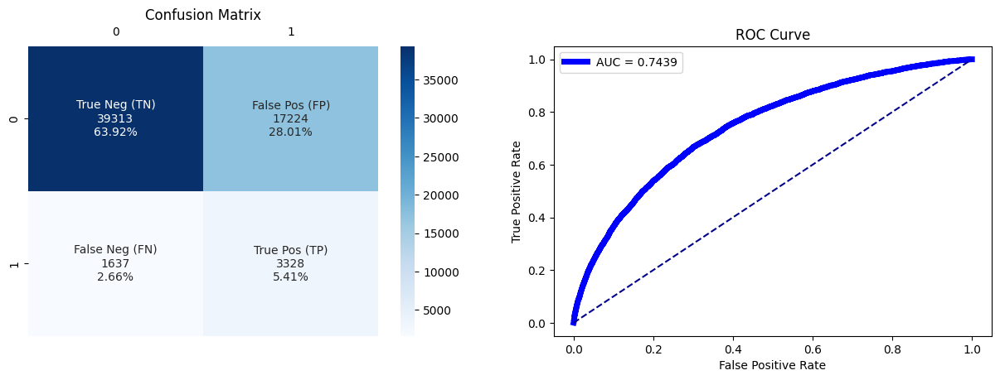

True negative   =  39313
False positive  =  17224
False negative  =  1637
True positive   =  3328
AUC : 0.7439
              precision    recall  f1-score   support

           0       0.96      0.70      0.81     56537
           1       0.16      0.67      0.26      4965

    accuracy                           0.69     61502
   macro avg       0.56      0.68      0.53     61502
weighted avg       0.90      0.69      0.76     61502

🏃 View run best_LGBMClassifier at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f15b86e128694771a66226ab37f2f485
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


In [161]:
classifier_model = model
ModelName        = f'best_{classifier_model.__class__.__name__}'
run_name         = f'best_{classifier_model.__class__.__name__}'

globals()[ModelName], accuracy, AUC, recall, f1, fbeta_score, tp, precision, fn, score_gain, \
prediction, probability, execution_time, prediction_time = \
model_mlflow(model_pipeline, ModelName, run_name,  X_train, y_train, X_test, y_test)


In [162]:
save_model(globals()[ModelName], ModelName, ModelFolder = MODEL_FOLDER)


'Modèle ./Models/best_LGBMClassifier.joblib enregistré avec succès.'

In [163]:
print(best_params_LGBMClassifier)

save_model(model       = model_pipeline, 
           ModelName   = f'best_{classifier_model.__class__.__name__}_pipeline', 
           ModelFolder = MODEL_FOLDER)

{'learning_rate': 0.2, 'max_depth': -1, 'n_estimators': 100, 'num_leaves': 2}


'Modèle ./Models/best_LGBMClassifier_pipeline.joblib enregistré avec succès.'

In [164]:
model_pipeline

Pipeline(steps=[('sampling', RandomUnderSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_scale',
                                                                   StandardScaler())]),
                                                  Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
       '...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'CODE_GENDER',
                                                   'NAME_EDUCATION_TYPE_Highereducation',
                                                   'ORGANIZATION_TYPE_Industrytype9',
                                                   'ORGANIZATION_TYPE_Transporttype3',
                                                   'OCCUPATION_TYPE_Highskilltechstaff',
                                                   'ORGANIZATION_TYPE_BusinessEntityType3',
                                                   'OCCUPATION_TYPE_Cookingstaff',
                                                   'FLAG_OWN_CAR', ...])])),
                ('clf',
                 LGBMClassifier(learning_rate=0.2, num_leaves=2,
                                objective='binary', random_state=42))])

In [165]:
best_LGBMClassifier 

Pipeline(steps=[('sampling', RandomUnderSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_scale',
                                                                   StandardScaler())]),
                                                  Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
       '...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'CODE_GENDER',
                                                   'NAME_EDUCATION_TYPE_Highereducation',
                                                   'ORGANIZATION_TYPE_Industrytype9',
                                                   'ORGANIZATION_TYPE_Transporttype3',
                                                   'OCCUPATION_TYPE_Highskilltechstaff',
                                                   'ORGANIZATION_TYPE_BusinessEntityType3',
                                                   'OCCUPATION_TYPE_Cookingstaff',
                                                   'FLAG_OWN_CAR', ...])])),
                ('clf',
                 LGBMClassifier(learning_rate=0.2, num_leaves=2,
                                objective='binary', random_state=42))])

## <font color='blue'>Importance des features </font>

### <font color='grey'>Features importance simple</font>

In [166]:
model =load_model(ModelName, ModelFolder = MODEL_FOLDER)
print(ModelName)

best_LGBMClassifier


In [167]:
best_LGBMClassifier.fit(X_train, y_train)

🏃 View run traveling-colt-758 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/199571375a0c40f8b4238e1bc4bce416
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
[LightGBM] [Info] Number of positive: 19860, number of negative: 19860
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.026698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7255
[LightGBM] [Info] Number of data points in the train set: 39720, number of used features: 100
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


🏃 View run hilarious-dove-365 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/62c362504da94871a6d946d8520e162f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


Pipeline(steps=[('sampling', RandomUnderSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_scale',
                                                                   StandardScaler())]),
                                                  Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
       '...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'CODE_GENDER',
                                                   'NAME_EDUCATION_TYPE_Highereducation',
                                                   'ORGANIZATION_TYPE_Industrytype9',
                                                   'ORGANIZATION_TYPE_Transporttype3',
                                                   'OCCUPATION_TYPE_Highskilltechstaff',
                                                   'ORGANIZATION_TYPE_BusinessEntityType3',
                                                   'OCCUPATION_TYPE_Cookingstaff',
                                                   'FLAG_OWN_CAR', ...])])),
                ('clf',
                 LGBMClassifier(learning_rate=0.2, num_leaves=2,
                                objective='binary', random_state=42))])

In [168]:
best_model=model
best_model

Pipeline(steps=[('sampling', RandomUnderSampler(random_state=42)),
                ('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('simple_scale',
                                                                   StandardScaler())]),
                                                  Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_EMPLOYED_PERC', 'ANNUITY_INCOME_PERC',
       '...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'CODE_GENDER',
                                                   'NAME_EDUCATION_TYPE_Highereducation',
                                                   'ORGANIZATION_TYPE_Industrytype9',
                                                   'ORGANIZATION_TYPE_Transporttype3',
                                                   'OCCUPATION_TYPE_Highskilltechstaff',
                                                   'ORGANIZATION_TYPE_BusinessEntityType3',
                                                   'OCCUPATION_TYPE_Cookingstaff',
                                                   'FLAG_OWN_CAR', ...])])),
                ('clf',
                 LGBMClassifier(learning_rate=0.2, num_leaves=2,
                                objective='binary', random_state=42))])

In [169]:
# Chargement des fichiers
X_train = load_pickle(file_path = f'{OUT_FOLDER}/X_train.pickle')
X_test  = load_pickle(file_path = f'{OUT_FOLDER}/X_test.pickle')
y_train = load_pickle(file_path = f'{OUT_FOLDER}/y_train.pickle')
y_test  = load_pickle(file_path = f'{OUT_FOLDER}/y_test.pickle')

In [170]:
import lightgbm as lgb
print("Version de LightGBM :", lgb.__version__)


Version de LightGBM : 4.5.0


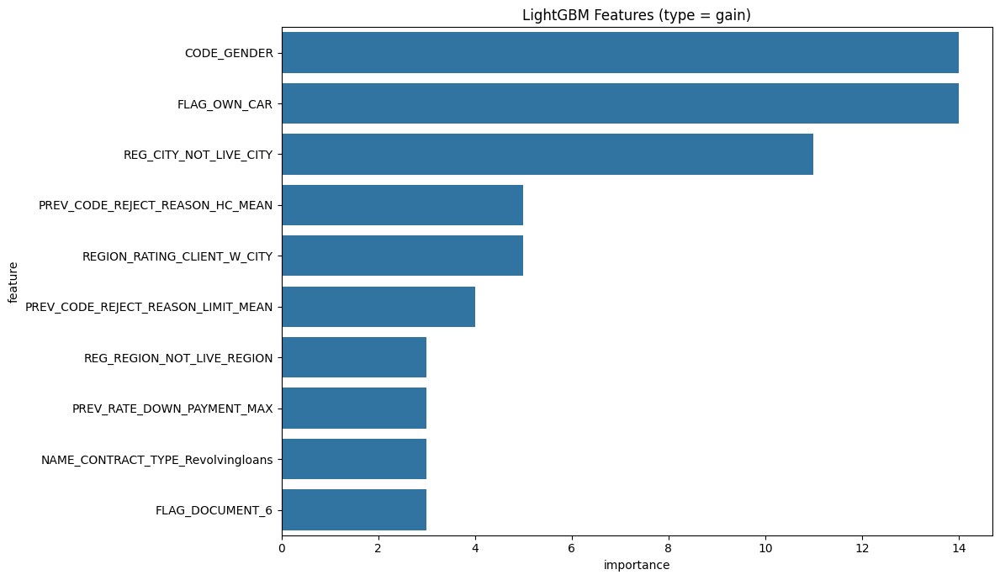

                                 feature  importance
0                            CODE_GENDER          14
1                           FLAG_OWN_CAR          14
6                 REG_CITY_NOT_LIVE_CITY          11
73       PREV_CODE_REJECT_REASON_HC_MEAN           5
4            REGION_RATING_CLIENT_W_CITY           5
..                                   ...         ...
45              ORGANIZATION_TYPE_School           0
44          ORGANIZATION_TYPE_Restaurant           0
43             ORGANIZATION_TYPE_Realtor           0
40       ORGANIZATION_TYPE_Industrytype9           0
99  POS_NAME_CONTRACT_STATUS_Signed_MEAN           0

[100 rows x 2 columns]


In [171]:
# Accédez au modèle LightGBM dans le pipeline
lgb_model = best_LGBMClassifier.named_steps['clf']  # Remplacez 'clf' par le nom de l'étape du modèle dans votre pipeline

# Maintenant, accédez aux feature importances
importance_scores = lgb_model.feature_importances_


# Création du DataFrame d'importance des variables
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': importance_scores
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 7))
sns.barplot(x="importance", y="feature", data=importance_df.sort_values(by="importance", ascending=False).head(10))
plt.title('LightGBM Features (type = gain)')
plt.tight_layout()
plt.show()

# Affichage du DataFrame d'importance des variables
print(importance_df)

In [172]:
def load_model():
    import os
    import pandas as pd
    from sklearn.preprocessing import MinMaxScaler, StandardScaler
    import pickle
    import shap
    os.chdir('.')
    data_train = pd.read_csv('./out_put/train_df.csv').set_index('SK_ID_CURR')
    data_test  = pd.read_csv('./out_put/test_df.csv').set_index('SK_ID_CURR')
    X_train    = pd.read_csv('./out_put/X_train.csv').set_index('SK_ID_CURR')
    X_test     = pd.read_csv('./out_put/X_test.csv').set_index('SK_ID_CURR')
    y_train    = pd.read_csv('./out_put/y_train.csv').set_index('SK_ID_CURR')
    y_test     = pd.read_csv('./out_put/y_test.csv').set_index('SK_ID_CURR')
    
    cols = X_train.select_dtypes(['float64']).columns
    scaler = StandardScaler()
    scaler.fit(X_train[cols])

    # data_train_scaled = pd.read_csv('./out_put/X_train_std.csv').set_index('SK_ID_CURR')
    # data_test_scaled = pd.read_csv('./out_put/X_test_std.csv').set_index('SK_ID_CURR')

    listvar = X_train.columns.tolist()

    # Sélection des colonnes numériques pour la mise à l'échelle
    data_test_scaled = data_test[listvar].copy()
    data_test_scaled[cols] = scaler.transform(data_test_scaled[cols])

    data_train_scaled = data_train[listvar].copy()
    data_train_scaled[cols] = scaler.transform(data_train[cols])


    # Chargement du modèle et des données
    model = pickle.load(open(f'{MODEL_FOLDER}/best_LGBMClassifier.pkl', 'rb'))
    # #pip install shap
    # import shap
    # Initialisation du Javascript
    shap.initjs()

#     # Initialisation de l'explainer Shapley pour les valeurs locales
#     explainer = shap.Explainer(model)
    explainer = shap.Explainer(model)
    shap_values = explainer.shap_values(data_test_scaled)[1]
    
    return model, data_test_scaled, shap_values, data_train, data_test, X_train, X_test, y_train, y_test 
    
model, data_test_scaled, shap_values, data_train, data_test, X_train, X_test, y_train, y_test = load_model()

C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\shap\explainers\_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


In [248]:
def load_model():
    import os
    import pandas as pd
    from sklearn.preprocessing import MinMaxScaler, StandardScaler
    import pickle
    import shap
    # os.chdir('C:/Users/Fane0763/OpenClassroom/OC Projet 7')
    data_train = pd.read_csv('./out_put/train_df.csv').set_index('SK_ID_CURR')
    data_test  = pd.read_csv('./out_put/test_df.csv').set_index('SK_ID_CURR')
    X_train    = pd.read_csv('./out_put/X_train.csv').set_index('SK_ID_CURR')
    X_test     = pd.read_csv('./out_put/X_test.csv').set_index('SK_ID_CURR')
    y_train    = pd.read_csv('./out_put/y_train.csv').set_index('SK_ID_CURR')
    y_test     = pd.read_csv('./out_put/y_test.csv').set_index('SK_ID_CURR')
    
    cols = X_train.select_dtypes(['float64']).columns
    scaler = StandardScaler()
    scaler.fit(X_train[cols])

    # data_train_scaled = pd.read_csv('./out_put/X_train_std.csv').set_index('SK_ID_CURR')
    # data_test_scaled = pd.read_csv('./out_put/X_test_std.csv').set_index('SK_ID_CURR')

    listvar = X_train.columns.tolist()

    # Sélection des colonnes numériques pour la mise à l'échelle
    data_test_scaled = data_test[listvar].copy()
    data_test_scaled[cols] = scaler.transform(data_test_scaled[cols])

    data_train_scaled = data_train[listvar].copy()
    data_train_scaled[cols] = scaler.transform(data_train[cols])


    # Chargement du modèle et des données
    model = pickle.load(open(f'{MODEL_FOLDER}/best_LGBMClassifier.pkl', 'rb'))
    # #pip install shap
    # import shap
    # Initialisation du Javascript
    shap.initjs()

#     # Initialisation de l'explainer Shapley pour les valeurs locales
#     explainer = shap.Explainer(model)
    explainer = shap.Explainer(model)
    shap_values = explainer.shap_values(X_test)
    
    return model, data_test_scaled, shap_values, data_train, data_test, X_train, X_test, y_train, y_test, explainer 
    
model, data_test_scaled, shap_values, data_train, data_test, X_train, X_test, y_train, y_test, explainer = load_model()


C:\Users\coura\anaconda3\envs\projet7_Coura\lib\site-packages\shap\explainers\_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


In [249]:
import os
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import pickle
import shap

# best_model.fit(X_train, y_train)

feature_imp = pd.DataFrame(sorted(zip(model.booster_.feature_importance(importance_type='gain'),
                                      X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(12, 7))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).head(10))
plt.title('LightGBM Features (type = gain)')
plt.tight_layout()
# plt.show()
to_png()

"LightGBM_Features_(type_=_gain).png"


Avec cette représentation, on peut dire que les features les plus importantes pour la prédiction d'accord d'un prêt sont les sources extérieures 2 et 3 qui sont les scores normalisés créés à partir d'une source de données externe. Ces scores pourraient regrouper différentes caractéristiques sur le paiement d'un crédit tel que le retard de paiement par exemple. Plus ces scores sont élevés et plus le client risque de ne pas voir sa demande de prêt accepté.
 
Nous avons le `PAY_MENT_RATE` et le nombre de jours depuis la naissance des clients (`DAYS_BIRTG`) donc leur âge joue un rôle important dans l'acceptation d'un crédit. 

### <font color='grey'> LIME </font>

LIME =Local Interpretable Model-Agnostic Explanations

LIME est une technique qui permet de créer un modèle simple autour de la prédiction que nous voulons expliquer et utilise ce modèle simple pour donner une explication. LIME peut être utilisé avec n'importe quel modèle de machine learning, pas seulement avec des arbres de décision ou des forêts aléatoires.

**L'idée de base de LIME est assez simple. Pour une prédiction donnée, LIME perturbe les entrées de la prédiction et essaie de comprendre comment ces perturbations affectent la sortie du modèle**. Les attributs qui affectent le plus la sortie lorsqu'ils sont perturbés sont considérés comme ayant une importance élevée pour cette prédiction spécifique.


In [211]:
# !pip install lime
import lime
from lime import lime_tabular

# Création de l'explainer
explainer = lime_tabular.LimeTabularExplainer(X_train.values, 
                                              feature_names=X_train.columns.values.tolist(), 
                                              class_names=['0','1'], 
                                              verbose=True, 
                                              mode='classification')

In [177]:
# Choisissez un exemple spécifique à expliquer

client_id = X_test.sort_index().index[0]
print('Le client ', client_id, 'est selectionné')
i = X_test.index.get_loc(client_id)
exp = explainer.explain_instance(X_test.values[i], model.predict_proba, num_features=5)

# Afficher l'explication
exp.show_in_notebook(show_table=True)

Le client  100009 est selectionné


🏃 View run capricious-lamb-347 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7a5c96e1a1e541cc9cecb5458eae82fc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run silent-worm-23 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/740dedd519904b71934d928b5b696cf9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run shivering-shrimp-138 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/69cc57f45ef946978008fa166c970d29
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run colorful-bird-316 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/55606a37f34040b5ac349e26ca6ece7e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run serious-auk-168 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/787cbb2e7e31410e9bda01225bb2fa28
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run invincible-kite-484 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/25f09beae61240cabd0ec1cec548cbd4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-carp-97 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/85d5c8f1787e4ee483762f05904971ea
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run thundering-hawk-362 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a46d4dc62f06450a924220ffc8e69d92
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run secretive-calf-675 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/85714b6182d446c88d900b7cb989b635
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run able-cod-472 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a10b44ca2c7b4cf8910027b5a5695408
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-wolf-967 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/94c418f2a0084d6e8455ab264a91b89d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run colorful-lamb-398 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ca434f5cc2f14f4ea4443c4256218cf4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-bear-467 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f79e4c1ae6b2465fa58e18540c7e93f2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-asp-367 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c9f75fdce9cb4e9fa931af36a396a934
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run whimsical-cow-361 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/188ed81271144e8ea4010c8f527b5d5a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-ant-805 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/82cd2da235f547df9fac39686460797a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run secretive-seal-721 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/fd63399e7b4e4480b89f85cfc02de2cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-wasp-815 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/220415358590425badb2292d56abf468
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-koi-965 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/206c27ae769746e5903ada1c6c4f2e9e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run puzzled-lynx-344 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3bd2942bafa54baeb4fad7270e9a194d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skittish-ray-407 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1f5880d560ec4958875c1f7af66e037e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-cub-201 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/92666fb0120544c495268821555be94f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run ambitious-horse-354 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/72a7a21262024db09e9e64d868fb3403
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run intelligent-fish-320 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7d043dba002b4514b2e0e4fc1115858d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-squid-560 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/88aa9a648a5c4162a00047f59738123c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clean-bear-778 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/96e8501f020f4febaadec90dc60ade1e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adorable-loon-185 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/84bfccfbce5244aeb8ef92fb10407e01
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run secretive-goose-849 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/40205a3579b44ca6baec66e0598739d2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-newt-625 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4fe26311ebad4b2baf023d1cdf54d213
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-skunk-93 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d182156299ae4125b8503ec97df39d3a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enthused-ram-491 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/92b57f1a475a4de288c72e499386a6cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run thundering-wren-774 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/94a30af8faf84f1a96d8b978c2d6e57f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enchanting-wolf-748 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5271e5aa023e4ab1b484c57d69b25e94
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-bee-697 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/61d8ddcc124f4386aa2766e26c3399b7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run loud-tern-597 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8038258608fe441a9d2298e600059524
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run beautiful-bass-237 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7122920ac12f42c68f689a15e83b3612
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run efficient-horse-274 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/255e9ff96904440bad272a238b3b303a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run loud-skink-169 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/115f47f784aa4dd7b397fdb4f0f35a02
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nosy-rat-563 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/fb658673748b43d6988ad06ef76cc30c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sneaky-owl-933 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/60bf8ab41e874e93ab288dcdae79077b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-crane-862 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e7dceccecb354ebc82a7341d81822c5c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-foal-106 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/941b7cf67d47416b84c6f80e9d98a6e9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run welcoming-asp-227 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cf266cd850764371a17caf1333b60f00
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run casual-perch-584 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b651bfdf97764e82b10d8cf57c3566ab
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run mercurial-mouse-638 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/72d8e4fa848b40838c8054e836a32000
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luxuriant-gnat-908 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/95f5d49c3d22455b98b26ac47220dcca
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run hilarious-bird-842 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/29c2b9117c404286846dbbd4d4972d6f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run glamorous-fox-69 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/30b67b912b72416fadf136839af3faa6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run mysterious-shrew-106 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/26a8287194cc4238b4f14125409b9b18
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run puzzled-gnat-135 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8f35152fa8c046be934e27f165f01ee3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run receptive-dove-528 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/14bb4d6503094cd89ea34748a970e8a8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-ant-961 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/87755bb63a4549c893d1e5fafb032fdc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-mink-837 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/05f3a41ab9034dd0a3bd08085abc573d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run casual-shark-227 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/275f45700701465399c517e6017eeb7c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clean-squid-399 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ebbdc64f60f8452f82591a4d19d0fd5c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upbeat-bass-65 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/01da071a3d5f4b52a0a876b7961e1c06
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run monumental-wren-73 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0436149e45d4450680a653601766de18
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run useful-shrew-688 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a1e160707222489ebf5c9bd9dd63049d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run intrigued-ape-71 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f8a1fd8233f84b5d90d4c17426282fec
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run indecisive-seal-39 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/17d8dce985b444e9b0470bf76053b22c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run shivering-shrimp-510 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/014f1e12960348eb95f85b7b787edccc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run learned-tern-399 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5de27667d870468eb77a8e01ed756a1a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amazing-rat-546 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a5025000b6194f26af9a817573625366
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-bird-181 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b2718dbd498347ed881a69cbc99f310f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run victorious-boar-139 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f46039d2e90c483bac0c09ad45cc3bd8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dashing-skink-861 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6f3bdae48baf409c8be3da2ac4b7a964
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run thundering-smelt-548 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7c1bfaffed3240848ab8934b8e723394
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wistful-quail-501 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e68a67456d044da7849aac7b659f3826
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-duck-671 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d695bbba754e40fc8784f0966d9b5aef
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run victorious-finch-521 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d6bcc46925bc44eb9477fcb9eae86e01
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rare-goose-525 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3da1314d6a5245c988d1fdb6db9278ef
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run overjoyed-hound-950 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/771ac75f2a084680a74d9cef08ddc6e4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sneaky-ape-46 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5059875cfd064d8390e5356fcdd3e42b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run zealous-rook-500 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/de409522c6a741ff8116f71d1adc456f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run intrigued-bee-417 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d08d722f6fd64955be865484b3e36a14
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run smiling-goose-136 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/02cd2d4dec3c446999764ec889eb2b4c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unruly-bird-264 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a5eab202ae5d49709a23aba6d00258de
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abrasive-cub-317 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/40d458abb6e4481e86fdfdaa27f2a771
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run serious-hog-672 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8badbfe2e6ac4847823be1981879a3fa
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run redolent-finch-976 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8e57783167dc4be29eadc1cd406ac431
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-fox-884 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/40b307d083a7459c878cb7405f740a42
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run grandiose-ray-763 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/885804a24c6b4b88863c543f29c08115
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run awesome-sponge-195 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/799b21d2e48a4f0596dc21062138e43e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run painted-crab-814 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c0f565fa576947c1adc61d2dbd9ca75e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enthused-grouse-734 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b4a4d4ac69524c2ebf1f694a17ba08cd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run chill-grub-720 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f25b7796792a4ce19ec2ac54fc6ef330
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-grub-704 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ec0f0def2fa34a0fb81ea5e5e35e58d3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run redolent-jay-398 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/afdda5d858d84f8289a74791a77fb48a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bold-mule-536 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6a6d1f2d260744bf8ecab694b022cb81
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-shrew-346 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e1c9903d89b1427fa58bcbc3c2c7fb6c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run glamorous-boar-155 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/58a2e6fcbeb6475a8bf869c477a9fcba
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run peaceful-elk-591 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5ad7ccb707a04376909e19f06522fc3a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nosy-koi-253 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/bb7e6aedf6554ad787051589f3dc7914
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-squirrel-531 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/01e756cb2a724723a58dac4c619c8ad6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-sow-313 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/28656fc750ab41ff859d18c4c82dc768
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run casual-moose-84 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/268a4669b4114a419e0348f8338c071f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run ambitious-cat-26 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a384a94af3ee4043a0d384e13034a9ab
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run invincible-loon-863 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c91896392b0f4da59afe73c7a115b001
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run judicious-ram-889 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8465412adb3d42c886fdecb68f3ac7c8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bemused-boar-223 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/51ba2527983b43a1b1c76faef163c1bc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wistful-deer-904 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/62fc4b3331fc48349af6617cf2d12eab
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run spiffy-rook-197 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/aba9f75421654ad4990b6c46f0507f70
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dashing-colt-769 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/05bdf1919bc1478b95664b1d2402a536
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-koi-879 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e4abb09d398745f3a8083e50c8f58ac5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run orderly-roo-704 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7ad1c7eb5879410f84553fa7117d437d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-yak-165 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/923beeeb5dce40978e8ee353051b3651
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run zealous-shrike-108 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/915b051c03ac4a0490cd48b1292c39db
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run carefree-doe-692 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a1990e15eaf146a099755bd7155b37a3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run delicate-pug-36 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0f9e5048752447b78ad429c961820d3c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run salty-squirrel-349 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3951f376890f4211a56b53d959f6aa92
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run debonair-steed-13 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/59697b816fbb46f289d3f1eb0a5832de
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run intrigued-sheep-699 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/78aeeeb6f68a4d17a32132e9132a2a48
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-kite-435 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/84a45c23115347fb974e28d89de12521
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-perch-187 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ebfa6367656b4694bcbb2f84a5c17e9c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run receptive-vole-621 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b9b32468b5844a0197b2206fc820c78a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run painted-tern-242 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5585c66d4cfa4e8381cbce68b480bf01
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run monumental-bug-375 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/91d1984838344ddcaccc8ab159ecf757
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bittersweet-calf-945 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/49b3c942600848e59cb129cf26c3f7fb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run melodic-roo-601 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e13cf560b57940b99a595913b5e02aa3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run zealous-pug-953 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/53b0053a477b4836b5e1f9b263671a71
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rebellious-fowl-888 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ca9e7ad8e1424a0b8e3eed83a5eedefd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run casual-mouse-125 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b3b64231f52c4c52ac57933c21435ce5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run placid-roo-512 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/07dc7fa767a2436982d83fc43a341c96
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luminous-crane-474 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5396f61a034c4617b8a30cefd1ced0bf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rare-tern-167 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9d601769c2084b549440d9c3c2df289a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-gnat-899 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/38e29a65ee494c5ba24456bda744376a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unruly-frog-855 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/38acb88c509340679275fca6b32c7a12
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clumsy-crane-185 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/36071aacdc8549eab455d4e41b76b316
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run defiant-skink-206 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b29d7d431fad4058b40ba5443bd4a1e3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run colorful-mare-805 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d94180d4c0ff45ac871846195a8c5758
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unique-shad-767 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/572e0e4241ad4333b05f4dbbb84d3c29
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run useful-mare-972 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1c39c4b0ebc541d894a11f41ad540b46
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run legendary-lamb-522 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/54e85ccf0fe14e1fb60bc46205d14500
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rare-fish-865 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4f25dce0795844f1a74cc00ee4205f36
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-shark-847 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3093c814ff194662a72002f722faca13
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run honorable-gnat-553 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e061b92066ce44fa8b8e685cd8111b02
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nosy-croc-576 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/bf93630307d44622bb6abcaa04756e8f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luxuriant-snail-37 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4cc8f88756824b1f92b6d6dc375d323b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run defiant-cow-932 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/87f2696bec844996bd7da2ae1380e3cb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run whimsical-crane-165 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9955862db90b486d8c4927e20f8f04c0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-goat-182 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c27a642b6c544dce88ea6f60b79aee41
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gregarious-snail-929 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/188f92201cb3488aa44a9ab3a9917f8c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-finch-910 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2c2a38d002ce4c95bc9b76c980660662
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adventurous-dove-321 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/57848ff6ed35436eb6ef34136eb91a6f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run handsome-trout-275 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d11273e1ec564c80954a48bfd30a208b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run receptive-elk-648 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d9a0844237084827ad85482b28c9c364
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bouncy-skink-644 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dafccf1e65de41d1b82aa625e6f3376a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run worried-owl-235 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a10ba1a2fd35486888a63e0d314274b1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run caring-eel-64 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/79d87387ded946b5945808c096fa21f4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run victorious-toad-814 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/33af6b088ec9455d8c75ee5ed036d2be
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run casual-gnat-726 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c15291f20d934850bcc96fed3cfe7c7b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run loud-penguin-722 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/df0add28d7244e78b2712357436bd883
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rogue-wren-496 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cce4680fa6e9463b8226508fbb828216
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run powerful-worm-339 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/059c3e91665c41299cfbd09715fbd814
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run thundering-shoat-946 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8ef8ae2924e7403699bd6ed8f3036347
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run hilarious-snipe-490 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/190914b421bc4a98a049eef0530ad6ce
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run learned-goat-662 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/59ddca1e6cb8401b8ed61c285fd4d007
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-zebra-403 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5a737ca340eb456dbce33951d200665d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-sheep-413 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c431da6c80d441549aeb4c281f668d09
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gifted-conch-483 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e8a9fdc1b1fe4ee8a1414cbd4d05c345
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adventurous-cub-351 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/36acdc32bd1142a282f4dfcbcfad9028
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run funny-ram-656 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5b95386e8b6942538b3eea95a69b77fe
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run trusting-sponge-498 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/42da0d25827840818ea6fccab276c1a3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run righteous-hare-125 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c3170e690daa45a5a90d5a54b51dd093
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run delicate-bass-115 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5ec0d48f92a946c6937fa05d62295559
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run overjoyed-midge-501 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/67e8561b520a4e94b9c156f4c76cdffa
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run handsome-donkey-826 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c49ecc8e85d84d2c917269e0f2a494fe
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-swan-55 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1fbec48ec41d4d01b2de50b346f6cfec
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skittish-snail-98 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cec05ac662454877bfa07f3adaae2216
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-vole-601 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/03e5e304fb3a43478b37f48d0a022bcd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-sloth-525 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/03d1aca310b54f08be326b341d928a21
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-shrew-607 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2bca59fee39c41dc8fe42faca7cd6fe0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run whimsical-snipe-732 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d9e5aabe02c1439d906f6c03d48b433e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bemused-ox-728 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e24e64e2b7fd418b9a97e4a0d0778173
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run redolent-chimp-698 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/236c553f18304669841f5c7927c7dc48
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clean-sponge-790 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b2c2e8e1c3b1409a9cd10d9bd9b2ee58
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upbeat-moth-36 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/de06b9b4862c44fca3e33870d8fe7097
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run hilarious-hare-3 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8aa55f43198a4a8994661b0aea684762
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-snake-117 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/583a5b980c5c41dd81d1bd363f5c9063
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bright-seal-112 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d20da47e510f4ecdad3d39fc6847b43e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run colorful-lark-876 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7edb17a45e4b4229b5844aab91e46e5a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run blushing-lark-733 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ae4e270cd50e4b30bdadd1587da0a670
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run auspicious-stork-74 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/95f395524e9f4271aeb9591822691ec0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gregarious-trout-38 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/db82a795aa414907a983ea78ef3d83ae
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run melodic-cat-767 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d326d9d3a9ec4d9e8efa4247b9e8db1d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run carefree-crane-493 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d055178c2d1f408c9fba3c10ec5efd4a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run able-horse-647 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/aac03a75f4eb4c63b427716a547abbd9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rebellious-koi-786 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f5e54e8bf1d149c493130745007d21d2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-sponge-461 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/93c3e6c232484b578319970613643b58
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bald-sow-904 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/77be5fce035a40dfad8d6de4d9bee730
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bittersweet-flea-998 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5f5cb368ff56432c9f034337107df05d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run welcoming-vole-191 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d60308ad7f354752945a19a98b064fdb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run caring-crow-670 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dc2ba881f5a34080acd6dc1a74b6448a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-stork-677 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/525982fdd0504bc38791ee8868d47a11
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-mule-831 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dc780658cc454bcfbf0157065216f3e2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run righteous-zebra-433 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ff927725a1514572995625c64b61c4d6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run popular-gull-671 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5010146d3ac24cd59e5733a6a89b6db3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-carp-878 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2a115e21184e485c9487fd4287965644
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adventurous-roo-479 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/67ab4252c9394e6fb83cff02dd0f154e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run defiant-pig-493 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/82abb5fdaa36463fadd26450b2e28611
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run overjoyed-owl-730 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5417cc1d06b541e39b7cef49215e1dd0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run salty-grouse-133 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/807c0ee542b242eaa1a6bd923dd07e99
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run honorable-pig-865 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b3a2c19c3fef4bcdbfd6efd5e0bda19a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run incongruous-bass-613 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2dcd6a8a7015409d882b1ec87b4ce514
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bemused-goat-995 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ac96410fb7cf4d3491ac1067ab676b1c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run industrious-pug-718 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7940da82b6eb4ddd9648410aadddd70b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-turtle-235 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d3b020b3eb754d3d840dd5fd02e2cb9c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-shad-438 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7acf2ed57a2345d5b1f266ea773d833d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run charming-hawk-548 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/69cb1dab61e04e0fae1ac0526d857dd2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gifted-cod-360 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e4a2dc89e193447b9d0f3aa7a676a775
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run mysterious-colt-717 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a897d5a4295f44d1b473a12d3e2e2688
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-mouse-992 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f288215af31b450995bb4ac2cef8a58e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-owl-662 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b57e78be521d4a93a6dfdcd0e35db87e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unleashed-flea-739 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1963e3ca4f0d41ff98f6cbbd10a8c1ed
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run efficient-slug-634 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/65b4d249346c4b968f1b423c37226b7b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run masked-snake-545 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c8bbf45b7d9b40838e717ff941ecf763
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amusing-hound-37 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/597dbe54ae994efb81891829b01dde1a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upset-stag-743 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/62d206df76994afd863267596e678322
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run whimsical-calf-164 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3ff7acfb389f466d95dd790ed936ff96
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gregarious-cod-845 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2e07bf57b89a401f92eba8cf4f91328e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abundant-gull-13 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/92eca8c03ce34ec8a40f3ee892b98d49
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unleashed-eel-420 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6c4420541f534400b266f6dfb30ac1e9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run melodic-doe-242 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c2ea94ecaec64bc0a0e54dc51fa8ac53
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amusing-croc-692 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/762658e3175545d684621c784d4847eb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run welcoming-whale-887 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d5a049dfa845470287cf7959c234a351
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run brawny-auk-626 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8a62070ca77f4997aac7e05a53d836d3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run tasteful-gull-42 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b70fd9a10b03468fa83ede499c1c9279
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run hilarious-wren-856 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e4790a4598c44cd79beea605c1f4a7ae
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luminous-colt-476 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/64a62750dfed4ca78d023b853e38e989
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-snail-606 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3763cbd02cef44448e01f916e1bfbf4f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-squid-990 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8da73429899142ef891edf8e018c53fd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adorable-koi-143 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/73efdba574604ef9954fb5575ad69d85
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dazzling-pug-346 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/815af1e87c4041c1bd6fbfb3840269d7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run persistent-moth-395 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5e0e1fecac344aa3b93402ae755907b3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adorable-rook-114 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b83fae70bf0f45c1bd46fa80828d54cf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sincere-snake-985 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/50fa458823374fd299e869d674d8eecd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-ray-802 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/69d85ff294914ee98d91f16090ae2247
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run burly-finch-515 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5fa3732d1d974f9f99a5354afdd5effe
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-hound-15 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8e217f731a6b41ccbf966ca1b07c8694
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gaudy-cow-81 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/77bb05f7ef7c468ab88df41412ef2020
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unequaled-stoat-350 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7eab8712fde841d883710883ce334d63
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nervous-crane-179 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9edad730f7ed4dfbb5bd76be6bd84249
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run grandiose-fly-834 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/363cae74ab2e405b9f5482316d1420ec
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amusing-ox-745 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b7eda91c09184dd29988846723a1812a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-whale-844 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2fd1a87ef2b545078a99a15beae7dee4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bedecked-penguin-132 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c8754379b2b443a1a423f34c48931d67
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run charming-newt-950 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/128bdbb537544f2b82f1ade88fc48648
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upbeat-elk-78 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2e295839f2864833bf49c6bd6a70b0e8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run efficient-bee-872 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0813b66552874e808dcd0821b520e420
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run valuable-swan-688 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f3d4dc0ff8f84d04bfeb6fa677f28b9f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dazzling-swan-409 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/391da5419f784ab4a45ae5e1c4ce33c1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gifted-shrew-843 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dc9d290725564124be2a5e05c3a03187
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run respected-sheep-987 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/884275831b7d4b94aa6596524ad4c675
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stately-elk-203 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/530dd62228de431f844a9b9b201fc1d6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run crawling-hawk-32 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b2cb643009e842b991575c9ecc056e79
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sassy-stork-400 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2c05aad607c143b0aafbaf5c550c5647
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amazing-panda-9 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9eee59d7969d48daba482727bd07666e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run industrious-gnu-268 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0d6d0d016b53469cb1817424be4fc062
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bald-flea-37 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/68d3206e031745fba6d524e13a2efc0e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run spiffy-elk-102 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/90e56f6bf3874bcea00a748c0e33d59f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run burly-bear-270 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2c7f5c2097944c56aaa5309b3004544b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run persistent-shad-50 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4a5aa3490ba24c869eea1b168ab769fc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run worried-hen-713 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/920555a31a38448398c78c3bc4b40b36
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luxuriant-mouse-621 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d90ef6d4d08c4e01a4179cb3f1ae13d2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-robin-870 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b7e2196cfb874c6bbfda3fc1045a619d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-doe-485 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8977b366b748418aa77f6be399b6e6cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nosy-goose-325 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/867ce09eed034bab81c7eca044125b24
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sedate-gull-841 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f7683b37a8ee495c93c4025cf9263dbe
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run languid-fish-139 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/596a211273a1407da79cc8b016e40e1c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-goose-183 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/eb7d98728d6c4a9dac2b4b9e3dc58241
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-carp-89 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/59995ca819ac4e8891767b1a720725d7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abrasive-rat-624 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2ae6959ae59840b68268f612a7b0e85a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-mink-918 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/de369e153cec40208ca6b6bbeafd38cd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nosy-hound-724 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5b4e6679e97e48c78d83ddf4cb8c1fc0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run big-boar-487 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/452d8bf41750440f901e5df794160348
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-turtle-56 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9a157ea1d82e4160badfc6a558db731b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run useful-grouse-152 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8e48cd5160904cdba1a5d5e81d77d1e2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bemused-donkey-508 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/95ef219b4af84327a9c0c5f3fe4eb6b8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enthused-moth-283 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/497d3562e3794ceca0b615c77be12645
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dazzling-hen-253 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1d12cdd0c4264e2f80bb966947016712
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-trout-892 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8aced6057bf04d799e12835fdbbb367b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run exultant-panda-603 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5e688eb114a649538ba065f72af94e1b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run illustrious-vole-723 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/03d5a2d750b4475ca984714abb9cac81
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run welcoming-loon-800 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c55162acc1694347bbdd20a1eb02fb48
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-rat-234 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ac7da4c43a7c4103b4c8d37be1f4c96f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-gnu-181 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/32eb14ed96d947b5a7370c75cca6cd7b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run indecisive-perch-798 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d3b6ee48a6d4425daf8d470929f692d6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run trusting-sloth-309 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e8ac114555a944bd95b0f97b1a8ca1f6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run useful-shad-84 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6a69c3ae50f9425c8b1f1ee4813bed09
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-sheep-47 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/da27e01fa343427b8d526e9160b3b314
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run smiling-zebra-214 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/57449c410497462e8aee5b8ec985b0b2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run big-horse-935 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8c411f0026e6417292bdf1c0485773f2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run puzzled-hound-347 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/78eb82796f224f1b9bb002b2c8e662e4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adorable-cat-865 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3907c468256c43d4bf321c1e9fadb22e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run suave-kite-810 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/702af146e910489096c6de4e3255c383
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run efficient-pug-828 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e70f9a0fbd7f43eb831612b593268ce2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abundant-whale-338 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/fe6e1311b9c140f7b7e9c97790380e62
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run brawny-foal-74 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cf6697a8dcf4417d8c043a8e9f0879f2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-bug-208 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/73bf1f599e0840cba4470a7a982993dc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run crawling-tern-62 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c2f2d07df90d4121977054e0dddc28f2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run intrigued-rat-319 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6243814e389d4a3e92bda719a7d93c2b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run youthful-grouse-593 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/09db2f27100a49d08724ae7f9a6bedd8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-wasp-451 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/57dc215f7487490281ad60ebf4305c14
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bittersweet-gull-279 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a61f201364fe4654a9b5c5d3b8fd73fb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clean-ape-121 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/981eba54b79c4380a8d401c28095776e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-shoat-415 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4dc77885ea294c0dbc2c6d81aa4e13ac
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-toad-839 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/20d31481e745446f92f39791bef6d9be
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run crawling-loon-844 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/98e17e1d5bd3440487348067a81a9b1d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run respected-loon-242 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3f316f05b8974cac95ded113349bbeab
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run worried-kite-707 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/025b0a6a7b154b2bb1f9a875682fb949
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run handsome-hawk-348 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/169afb29735e498a86c0e025417fc9d7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run glamorous-shrew-928 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/df4c32fa121a4e20bfe0502d2cff7f4a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run languid-ray-694 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ad60fb528f8f4dec838367eee965bddb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run victorious-gnu-648 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6592047b4a9b41e196f2ee7947848657
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run languid-goat-382 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/879f485a6bb74647b300fbee90f5d237
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abrasive-robin-829 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a7751d96ff704e3fa10ff450fdf732bf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run caring-zebra-606 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f9a70f459bb9433cbe79d1bbdbdbf431
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wistful-kit-339 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1b455535e7204d45b31e6b4fc82972db
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-chimp-752 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/504475507eb64120882ce99a4d7029cc
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-carp-558 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6f855a6d6ce74445a8049c68e56cf345
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run secretive-swan-206 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/09d97202310a476894a443a6a3d934b6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wistful-loon-875 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dbed244523464ae7bd94a97587e6b2f0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run trusting-shrew-366 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c4bd0c7abe9f4941934c3884bdce8487
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sincere-hen-957 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/20469d0c788c48bba0573738553f4dee
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run thundering-pig-298 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c74bb40e32954dbf83e92db516d6fd89
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abrasive-quail-248 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/03b2d42c2cec4ebe92bb6a720dd2b43a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run delicate-yak-265 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/14de61b124ba4ace9bb174cd5ee10a9e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run luxuriant-shark-88 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/bcb40449f8ae4e1e914878571975484a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run vaunted-sponge-445 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8141a78ac1ca458daf12a0d1a1b41f47
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run zealous-gull-798 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c8e0ba7861534b90b67eda2528c820b4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run popular-snake-548 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4cee2964fb7f4f549485cdc0a88e7bf9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nervous-tern-594 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7c1d252855494b78813a5e9633064995
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upset-lamb-122 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d412c7b6939d4364ba35377cba291c29
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run zealous-shoat-710 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d96563c5351e420d864dbef3e40ff27a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-turtle-719 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/51ff92c69b3040e8af7be393301c1b10
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bold-mule-269 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/41dd2fcf15e54a5087d0aa1f3e39ca8b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dazzling-mare-714 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c88dd3dc5b1947449748bc652b099983
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-fox-970 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c35726dc56b144f5886c3e5d9c93d7a0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-moose-945 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/889959e33b85432f9ba12422a822d102
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run masked-goose-826 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2af1138e3d5d46b8ac7e246b4bd8f66e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run amusing-gull-523 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e1a4386c1bec4b95b6dd26fca3a7a9f8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dashing-bug-469 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/18b65c5f6adc4ba590ae39653e2f615a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run suave-dove-992 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c98cb9ef30f340f0816a438a123f18e2
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run crawling-pug-96 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/38d304cd984d40258e81568ac50c1a5c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run crawling-crow-270 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dfb69628db0e4a6b9bb78f22b7a8a0d1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gaudy-duck-331 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/07cc533250a84e2689935bd23f25cd25
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-doe-69 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8a70ea18552340ad8936785601384a1f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sincere-crane-500 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b9b19e1a490443a29fd648dcdbec1e52
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-cat-192 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8a1f65b991c141f4bb72448f6c1eb6ee
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-cub-977 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4fa000ed2eff41168bdb89b84683bb97
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run omniscient-shoat-291 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0ffb1a1ebe01433688d945924be62065
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run shivering-newt-746 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e5204da53abe44e3978dc7d6a080a12b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-bird-673 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/addb0eaf726949e49f90ae1f3ee2256c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run capricious-fox-611 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3a2c9f27636c42b0b95701453956ab77
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run able-cow-984 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c9ed4e57fbaf466981c8c65bfb012681
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-sheep-589 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0ffb6c4b6a504ee8b41705f4d10d1c05
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run secretive-cow-941 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e329365ad8344c86a80d98227998bb52
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run melodic-dove-926 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d3346c1a74f24784a93aa8e529a959f6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run big-bat-164 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/889e662c328f434aa65e87f3e2d2bba5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rebellious-croc-493 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b2616cdc82c44956893170e282234828
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clumsy-sow-417 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/815ee8ffc1624e4e977a436f67ed33f3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-turtle-497 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1706401156084465a0be345fce888f94
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run melodic-lark-961 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b05d222d84e04b9e936261e40ed8ef36
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-lynx-84 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7f60af6f5abf436683c4846d9dbb27f4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gifted-sloth-917 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c1e522efd1cd49398a5efb2c1866f219
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-skink-161 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/00cccfe1f8944654bb7b8bbefcf0991f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run efficient-flea-878 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/44edd28e73cf44bab86aff7d470a6663
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run calm-loon-460 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5f88649b30ce4c529f30de95dbc0ca39
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run stylish-vole-953 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d9317f0aaf4d4a1ab5bcaa6a45358b70
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run orderly-goose-369 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f0577b42e6d048c4997d69d35aab2786
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enchanting-horse-536 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/67ca475bdff043eabbe671bc754786ed
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run trusting-asp-535 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/539b200deded4d709bf431631e9826f1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run smiling-bass-589 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c7cd046a3a73483c9edcb625a5406672
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-kite-71 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1d0e1b3c8f6f4ee595de4d6998e9aa0d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-ant-421 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ba5d420bade44a60b23c608b8e028e33
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run mercurial-frog-410 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/89bfe9b7c6d7432bbf821acb5537bd2d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run kindly-crab-982 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0b0711a1ec994004ab13784e9b3cef57
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run respected-auk-808 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/bc4c34bf3dce4fd58878a3e82fd666f9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run handsome-tern-380 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6cecd86d172b434598dcbc4d9f056bbd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-ox-626 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2afa0e5513ef4ee2af338ce3bd01a8e7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run valuable-chimp-60 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f0595d9e7bf0451bbf5e99bd43896110
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run big-ox-329 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d643be10004044cc9681637523fcbab3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unruly-wolf-564 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ebcdc0fc8a14466980a0bc8bea575bd9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bright-shad-880 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5d8e8c6701ca4ae6885f90adf7ebe43b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adorable-vole-186 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/bb49edbcff2440f2a2605d3633472277
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run caring-snake-438 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/402c65277a354b379bbde0f126e51376
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run chill-squirrel-487 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8405e7f9017949a188efcdc2384e65e3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-hen-189 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b453ba9057744c509d3586fe96145e55
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run merciful-mole-87 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/983d8deea58d43a58fb67bb13911e19b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nimble-shrike-831 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ead3318c06934c13bfc847dbc7bfa891
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run learned-slug-133 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c40286e1f57d44e183f64c8504a1d0a8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-colt-769 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cd44db8707a8422d83742805bf6f2a47
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run auspicious-stag-282 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/47d4a526a47c4249bcba3afe58c95b48
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run colorful-hare-496 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/32978a43fb17466c8c3c044f0d42957e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run delicate-squid-327 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dba8eeb5e09648e8a812898fa3ad7f34
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run angry-boar-236 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4c4cce3cd5cb4c07b99ecba40fc27a23
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-zebra-658 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/10d9eef33e5b4449914fa8909dad4634
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rumbling-duck-61 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cf91b63273df431781036a87f94d6440
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run orderly-tern-83 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5944c5554911423ca8d9a4cd69e84683
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sedate-wolf-58 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5900afbbfee3437ba36d70ee437ec47e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run orderly-perch-466 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/782f5f5f7d5c4cfc976712612610f96e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-bug-899 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e31f1273f47f4086bacbc34e4eeef859
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run languid-lark-507 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a3f87472874a442bb5efe7dece4c9c41
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run serious-seal-806 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f7bdd0f7ac9947c89e6264bb7c0b9fbe
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run classy-calf-818 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/03630ff3876d488a946e0dc38df58f8d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run trusting-crab-128 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/468ec450ea65473abb26486e27055646
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unequaled-shrew-941 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d6289ca939bb49d3970543f2ac3baac1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run painted-zebra-978 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/777a9c0a3cea4a4d933310685d0e4948
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skillful-fly-659 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/577835a10fca4bd99478b47ca4449e59
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run tasteful-steed-11 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/52d2a9d43b364172bd500f18057a689b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unique-snake-675 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/02d93754956145e3b96a796035b18911
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run spiffy-quail-167 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4d423c9544c744339dc55c253ac4572e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unleashed-panda-916 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/6ae6f6ff1cdb46c898162b19aaa92633
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run lyrical-boar-801 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c40b1edfa0514617a6f283202594a6e5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dazzling-crow-73 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e2af2666cfe04831954ebf547348ce3d
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run resilient-slug-114 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/300b000d307b4dd7a2b10035408211c3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-owl-879 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c0f8970ce311467188c43158983a7958
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run rebellious-carp-468 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e4e2c69c0c13447ca90704122497e872
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run puzzled-fowl-945 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b66ca4cfc0374845a3a93e98c4f63be4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run popular-frog-98 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/954047a4697b4ae7b52ffcdde8e7a24c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run tasteful-penguin-767 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b0286d3b0e954bfaadc90091b3274a77
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run placid-gull-223 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/54597ab527c9492eb147833d997f9737
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-fox-390 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8c476d2751f4400a8dbe01646e80790b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run funny-skunk-431 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0de9aadf2b4d41dab66f3fd7c14e70e3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run brawny-dove-704 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c875f8bb0f3d4bf4a1091e0ebe439655
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gaudy-dolphin-492 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/01e3783aa7204490a94ae2a096709768
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run righteous-newt-709 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/45ea9c087ad84f6ca9d0f3e02fec393e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clean-vole-542 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/188f6626f7114e929d73c9188bffc10b
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run polite-hare-106 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4dd82244dc9e452396e022d73ac1dfe5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nebulous-ox-148 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dfbe5e6cf1584dd7bd0ae52310f83c09
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gregarious-robin-550 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e2847eea5cfd460d84fe94db6404d5d4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unique-foal-79 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a179dd02a92f4905954c8dec8936f1b1
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run hilarious-goose-957 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/cd88ea4f01e6471ab5d658dc599c6bcd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run indecisive-finch-609 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9e5e19f93c4f4af0ba5b2dace23d6813
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run beautiful-eel-811 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9fc9935180094b68b98343f3d096165a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-carp-969 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/503be101228e486a9a1c3790ecedc480
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run useful-bird-188 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a9a3ec0c8344455da3b5a54b896620f3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run flawless-hen-370 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/473231fe16494dd68b90bf9c7deef662
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run tasteful-mink-667 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a0dcc1d6954b4c8eaaf6dd53586a4223
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run redolent-crane-597 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d15af73d12344a41b15d82dcab6c897f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sneaky-toad-170 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/f8cecee292a44f39be6c570f2e44de22
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run masked-fox-16 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/9bfa677f04e843598d495368c94a18eb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adventurous-grub-317 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2b96e6686c674d25a3e963f8a80f15c4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bright-sloth-887 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/981fbc9c5f004cc29ceb7c48f1cc3ad6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run agreeable-kit-873 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ffb23a4a8cb14ec68593cf7c9b150804
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wistful-vole-975 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/2fead7998a4a4d95b7ebe80a5735e73c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run beautiful-calf-622 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/893112fec914426db4a3e8508d081711
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run chill-crow-700 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/894db197ee4c4853bfa0d627941a70ac
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run incongruous-koi-947 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1112373217254a1e95e4dcd1788911f8
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run righteous-fox-212 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/a231989571e74d2cad959878e9282ccf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run serious-hawk-307 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c8a522dd58554c78b7b7e0feaa6f0629
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run indecisive-snipe-477 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/01050b05a56340789f562bf847e9d40f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run grandiose-fish-283 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/015193b097bf45508c7480beeda20f38
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run skittish-turtle-663 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/524caa73710d44e881efad94d5005ee5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-crab-851 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d374c0d54eb04f47883e84804c751c52
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nervous-ape-635 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4f3f1e4b0f394066bf8ac49b036599be
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run fortunate-wasp-64 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/31014e30c9ef480aafde7bd458384b3f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run worried-newt-247 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/61ec064b2e41414fb27aafa5501c0eaf
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run charming-ape-510 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dc1c8ea624e84c498273d862f853110e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sedate-bass-604 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/dab04b20cbfc41fc931a6acdf8384811
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bittersweet-kite-309 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/55d0ffbe850f423a9447db77060d106c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sedate-dolphin-506 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8c63cc9d128c424ba18d4190966eb12c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run big-seal-283 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7495cd18cce44376b306a9d2fff699a6
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unleashed-grub-461 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/61b6562fba654f82ac5a1c544263a25f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-robin-460 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/1d5a9491db9f42d89460b3edf033df87
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run learned-bear-12 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/99a3e8da988f445a983d2276c2bb34c9
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run enthused-pig-820 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/005fdad0588f4c80b189be82c4b57c88
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run wise-shrew-274 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/505306c4f3aa4d48998017aa112cfe85
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run marvelous-shoat-119 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/5afae0c615814d9c86633a0f914bf741
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run debonair-bird-304 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/620cff7a53ef439fa697c3e30e872c42
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run omniscient-conch-587 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/aa46baf2649742f38b3a6fa58c41252e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run magnificent-jay-302 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/0072881915c9425c81b9e2e162c9c186
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run charming-goat-108 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b3b2d21a411a433ca059a8e599e6e488
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run dapper-calf-723 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/ac5330a780254839bc34ab1807da782f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run angry-shoat-895 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/8d46a277faf04994b443c946c1686dae
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run treasured-conch-829 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d5a7f534e7fa406c83de41c3edbebf18
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adventurous-elk-485 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/eaea4d45e2064f6b89e54f41fb909c57
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clumsy-colt-543 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/b111a2ef580d4b989903f9604ea0ca85
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run unleashed-ray-188 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/d6b9e680249d4780aa7230ef5642f716
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sedate-panda-629 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/706483a3d73c470393f523d62ad9305f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run likeable-slug-358 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/4cd6eca5825249c7b852fa4179e9fdfb
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run sassy-vole-302 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/75002fc658b54012a068147de117c763
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run upbeat-colt-907 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e278fcbf746d4b4689393ef1c2402948
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run invincible-slug-892 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/34f1d124e69e4c198ae9f3de6993a856
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run adaptable-grouse-888 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/c0fdf058ab8143f9b201bd87a0df5b54
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run nervous-eel-708 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/266e4dd70cb8495fb672d08e755f5b40
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run legendary-hawk-218 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/7b5f7cf5b93545ac87ecaec137bbf168
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run clumsy-fly-260 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/e13d45c069224089aa3640db11b7a1f3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run bald-cat-738 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/302f9dd8b126412d95245d108e6e84f5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run capable-stoat-611 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/3ab63bbb064c4f019f805a79b74dc357
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run gaudy-dolphin-16 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/24bd9c1e2696479884f123ccde5376be
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769
Intercept 0.3701458602851653
Prediction_local [0.17034213]
Right: 0.17506977814131444


In [200]:
import os
os.environ["LOKY_MAX_CPU_COUNT"] = "4"  
import warnings
warnings.filterwarnings("ignore", message=".*Could not find the number of physical cores.*")

# Créer un explainer LIME
explainer1 = lime.lime_tabular.LimeTabularExplainer(X_train.to_numpy(), training_labels=y_train.to_numpy(), mode='regression')

exp = explainer1.explain_instance(X_test.to_numpy()[0], model.predict)
# Visualiser l'explication
exp.show_in_notebook()

🏃 View run capable-asp-434 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/124c85e208c144d496e0df420e3f4d79
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


🏃 View run abrasive-cow-610 at: http://127.0.0.1:5000/#/experiments/600411556294991769/runs/073ba018e1244158b0188e1ead3f1096
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/600411556294991769


In [252]:
#pip install shap
import shap
# Initialisation du Javascript
shap.initjs()

client_id = X_test.sort_index().index[0]
print('Le client ', client_id, 'est selectionné')
i = X_test.index.get_loc(client_id)

# shap_values = explainer.shap_values(X_test.iloc[[i], :])

shap.force_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:])

Le client  100009 est selectionné


In [254]:
import shap
# Initialisation du Javascript
shap.initjs()

# Choisissez un exemple spécifique à expliquer
client_id = X_test.sort_index().index[0]
print('Le client ', client_id, 'est selectionné')
i = X_test.index.get_loc(client_id)

print(np.shape(shap_values))
print(np.shape(X_test.iloc[i,:]))
shap.force_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:])


Le client  100009 est selectionné
(61502, 100)
(100,)


### Shapley Values

La valeur de Shapley, dans le contexte de l'interprétation de modèles d'apprentissage automatique, permet d'évaluer l'impact de chaque caractéristique sur une prédiction donnée. **Elle fait cela en calculant la contribution moyenne de chaque caractéristique à la prédiction sur toutes les combinaisons possibles de caractéristiques**.

In [255]:
import shap
# Initialisation du Javascript
shap.initjs()

# Choisissez un exemple spécifique à expliquer
client_id = X_test.sort_index().index[0]
print('Le client ', client_id, 'est selectionné')
i = X_test.index.get_loc(client_id)

print(np.shape(shap_values))
print(np.shape(X_test.iloc[i,:]))
shap.force_plot(explainer.expected_value, shap_values[i], X_test.iloc[i,:])


Le client  100009 est selectionné
(61502, 100)
(100,)


In [258]:
n =100
shap.plots.force(explainer.expected_value, shap_values[0:n+1],X_test.iloc[:n+1,:])

In [259]:
df1=pd.DataFrame(data=shap_values, columns=X_test.columns.tolist())
df1

,CODE_GENDER,FLAG_OWN_CAR,FLAG_WORK_PHONE,FLAG_PHONE,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,EXT_SOURCE_2,EXT_SOURCE_3,DEF_30_CNT_SOCIAL_CIRCLE,...,PREV_NAME_YIELD_GROUP_high_MEAN,PREV_NAME_YIELD_GROUP_low_action_MEAN,PREV_PRODUCT_COMBINATION_CashStreetlow_MEAN,PREV_PRODUCT_COMBINATION_CashStreetmiddle_MEAN,PREV_PRODUCT_COMBINATION_CashXSellhigh_MEAN,PREV_PRODUCT_COMBINATION_CashXSelllow_MEAN,PREV_PRODUCT_COMBINATION_POSindustrywithinterest_MEAN,PREV_PRODUCT_COMBINATION_POSmobilewithoutinterest_MEAN,APPROVED_RATE_DOWN_PAYMENT_MAX,POS_NAME_CONTRACT_STATUS_Signed_MEAN
0,0.139113,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
1,0.139113,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
2,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
3,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
4,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.034599,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61497,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
61498,0.139113,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.177153,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,-0.134860,-0.047866,0.0,-0.069628,0.0
61499,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,0.009928,0.0,-0.069628,0.0
61500,-0.084952,0.0,0.0,0.0,0.0,0.0,0.0,-0.334823,-0.313039,0.0,...,-0.027352,0.014783,0.0,0.0,-0.021655,0.033328,-0.047866,0.0,-0.069628,0.0


Le client  100009 est sélectionné
(61502, 100)


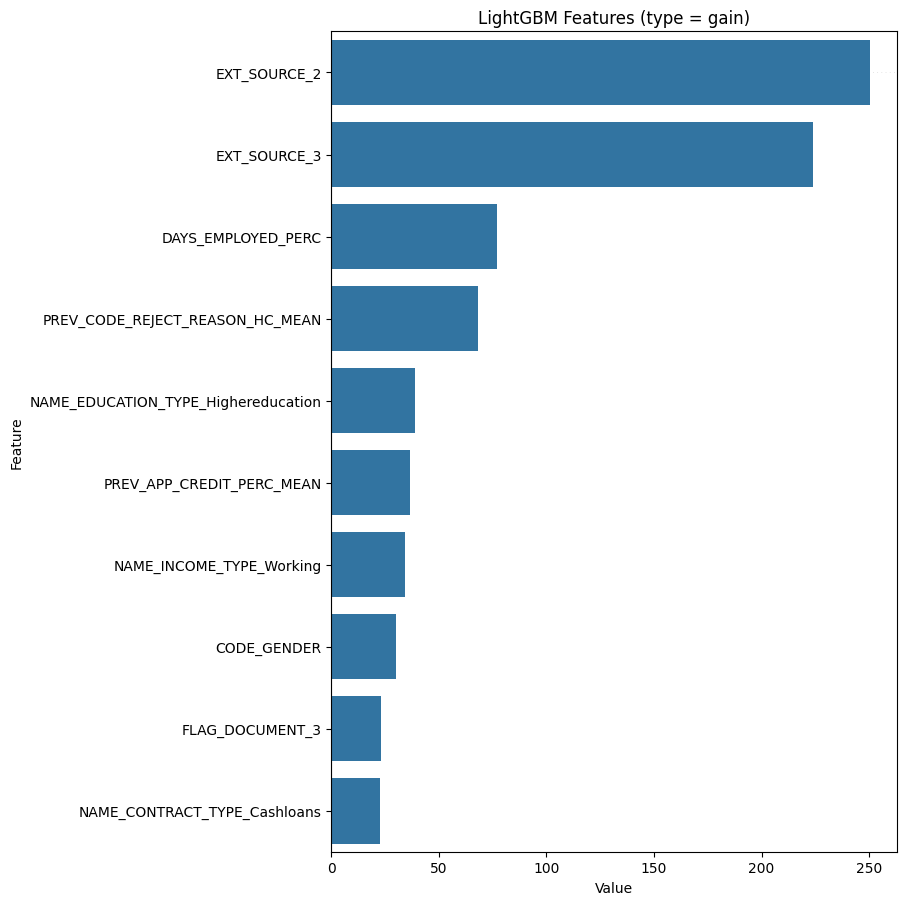

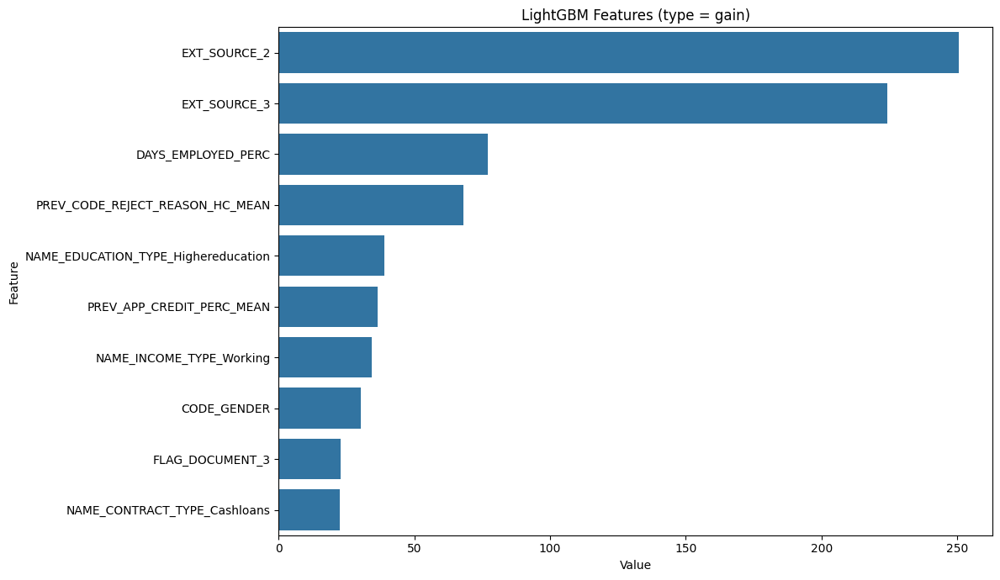

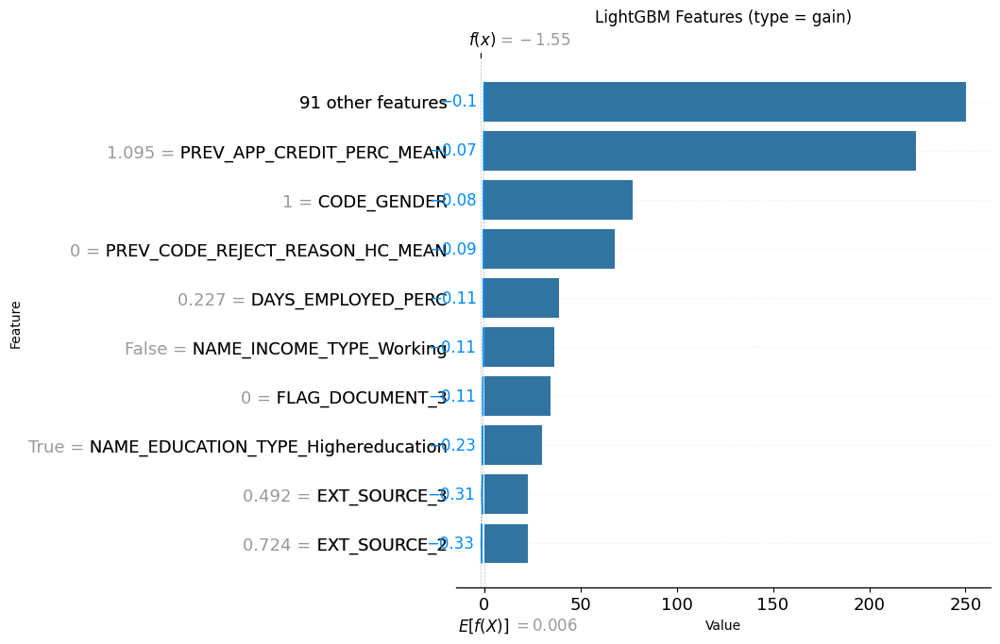

In [260]:
# Choisissez un exemple spécifique à expliquer
client_id = X_test.sort_index().index[0]
print('Le client ', client_id, 'est sélectionné')
i = X_test.index.get_loc(client_id)

# explainer = shap.TreeExplainer(model)
# shap_values = explainer.shap_values(data_test_scaled)
print(np.shape(shap_values))

# Create an Explanation object
shap_explanation = shap.Explanation(
    values=shap_values[i],
    base_values=explainer.expected_value,  # Adjust base values as needed
    data=X_test.iloc[i],  # Adjust the data point as needed
    feature_names=X_test.columns.tolist()
)

# Plot waterfall for the selected client
shap.plots.waterfall(shap_explanation, max_display=10)

Le client  100054 est sélectionné


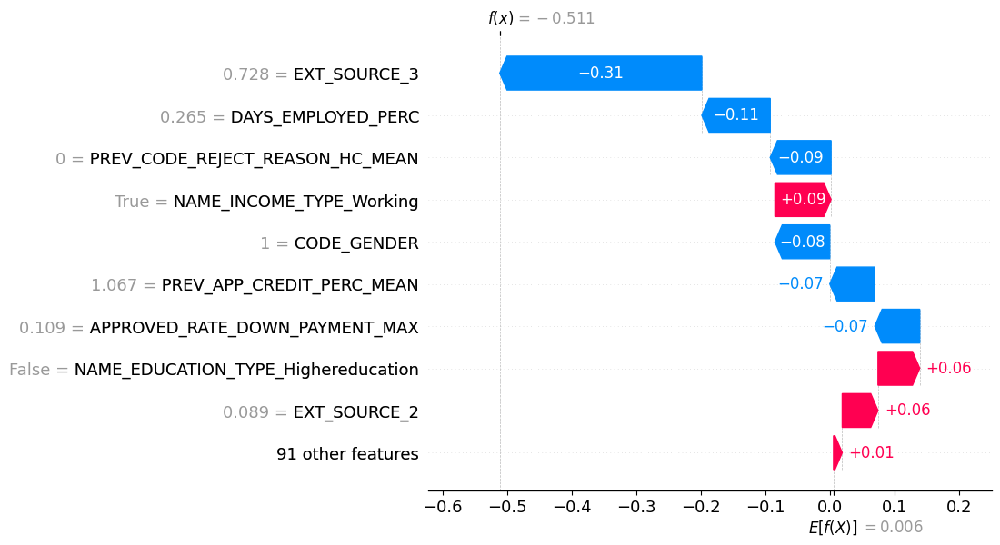

In [261]:
# Choisissez un exemple spécifique à expliquer
client_id = X_test.sort_index().index[10]
print('Le client ', client_id, 'est sélectionné')
i = X_test.index.get_loc(client_id)

shap_explanation = shap.Explanation(
    values=shap_values[i],
    base_values=explainer.expected_value,  # Adjust base values as needed
    data=X_test.iloc[i],  # Adjust the data point as needed
    feature_names=X_test.columns.tolist()
) 
    
shap.waterfall_plot(shap_explanation, max_display=10)

### <font color='grey'>Features importance SHAP</font>

Les valeurs de Shapley calculent l’importance d’une variable en comparant la sortie qu’un modèle peut prédire avec et sans cette variable. Cependant, étant donné que l’ordre dans lequel un modèle voit les variables peut affecter ses prédictions, cela se fait dans tous les ordres possibles, afin que les fonctionnalités soient comparées équitablement. Cette approche est inspirée de la théorie des jeux.

SHAP s’utilise pour expliquer un modèle existant. Prenant un cas de classification binaire construite avec un modèle sklearn. On entraine, tune et teste notre modèle. Ensuite on peut utiliser nos données et le modèle pour créer un modèle supplémentaire de SHAP qui explique notre modèle de classification.

Les valeurs Shap sont des tableaux d'une longueur correspondant au nombre de classes dans la cible. Ici, le problème est la classification binaire, et donc les valeurs Shap ont deux tableaux correspondant à l'une ou l'autre classe.

Les valeurs Shap sont des nombres à virgule flottante correspondant aux données de chaque ligne correspondant à chaque caractéristique. La valeur Shap représente la contribution de ce point de données particulier dans la prédiction des sorties. Si la valeur shap est très proche de zéro, on peut dire que le point de données contribue très peu aux prédictions. Si la valeur shap est une valeur fortement positive ou fortement négative, nous pouvons dire que le point de données contribue grandement à la prédiction de la classe positive ou négative.



In [262]:
# compute the global importance of each feature as the mean absolute value
# of the feature's importance over all the samples
global_importances = np.abs(shap_values).mean(0)[:-1]

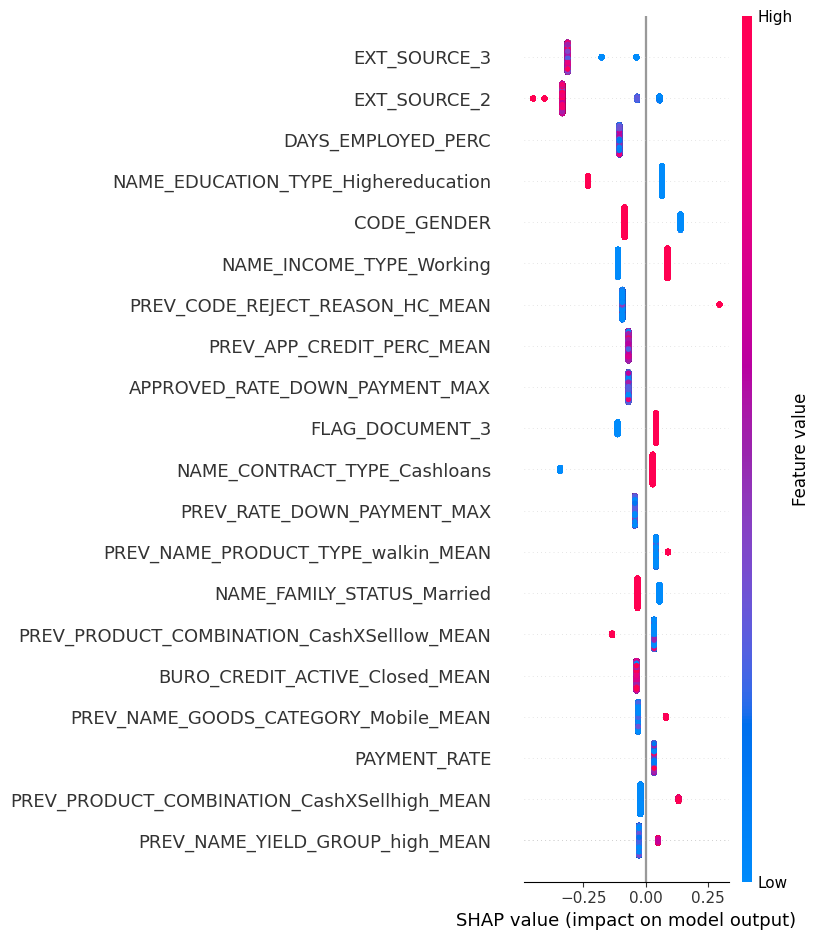

In [265]:
shap.summary_plot(shap_values, X_test)

Avec ce graphique, nous pouvons voir que nous retrouvons les EXT_SOURCES 1, 2 et 3 ainsi que CREDIT_REFUND_TIME. Un peu plus bas nous retrouvons DAYS_BIRTHS même si il semble jouer un rôle moins important pour le fait qu'une personne soit non solvable. Dans cette nouvelle représentation, le Genre du client est important dans la prédiction mais nous ne le prendrons pas en compte car cette information ferait de notre modèle un modèle discriminant. Nous trouvons également un rôle important pour la variable AMT_GOODS_PRICE qui correspond au montant du prix des biens pour lesquels le prêt est accordé pour les prêts de consommation qui ne sera pas pris en compte car le choix peut être biaisé et le crédit ne pourrait pas être accordé si le biens est trop cher.

Nous prendrons donc en comte les features EXT_SOURCES 1, 2, 3 ainsi que CREDIT_REFUND_TIME et l'âge.

Voyons plus en détail l'influence de chacune de ces variables sur la prédiction de non solvabilité.

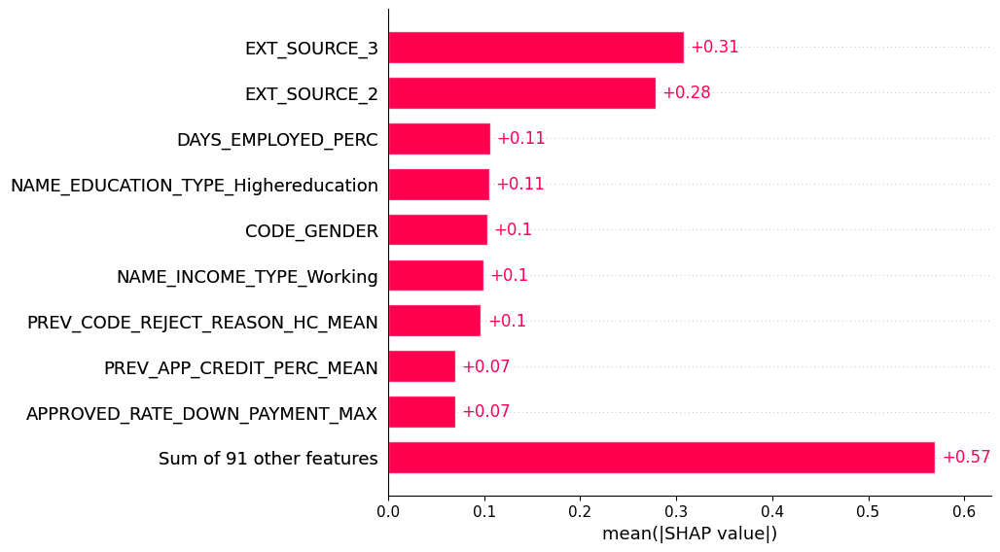

In [268]:
shap_explanation = shap.Explanation(
    values=shap_values,
    base_values=explainer.expected_value,
    data=X_test, 
    feature_names=X_test.columns.tolist()
) 
shap.plots.bar(shap_explanation)

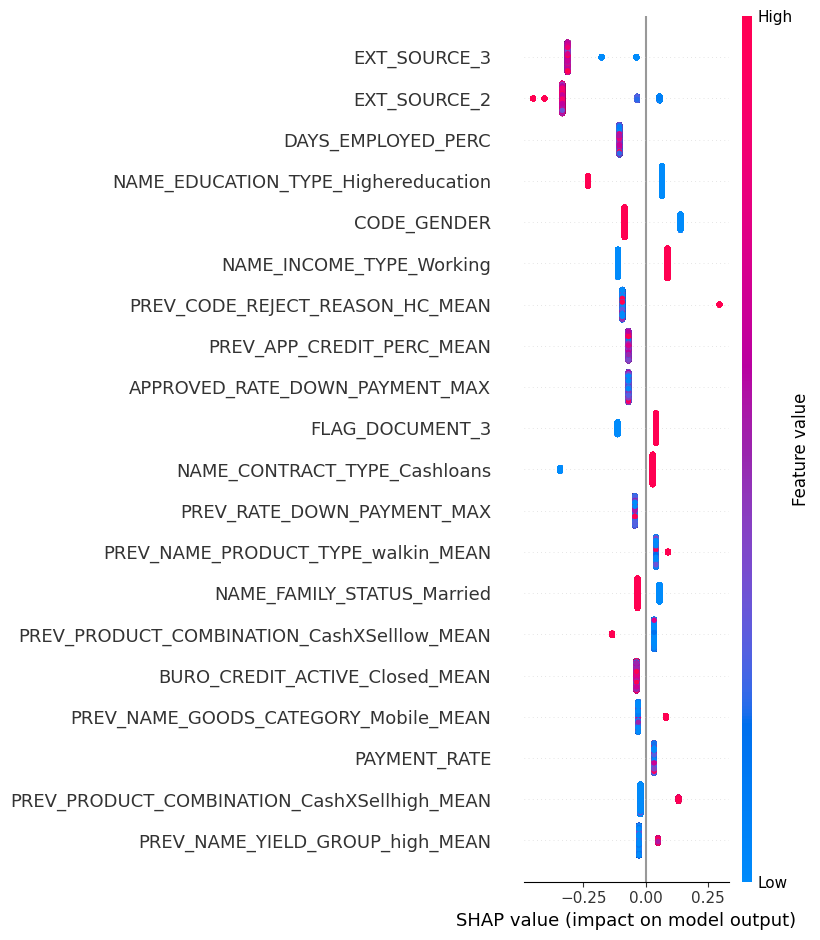

In [269]:
shap.summary_plot(shap_values, X_test.astype("float")) 


Nous traçons les valeurs SHAP de chaque caractéristique pour chaque échantillon sur l'axe des x, puis nous les laissons s'accumuler. Si nous colorons ensuite chaque point selon sa valeur, nous pouvons voir comment une valeur faible ou élevée affecte la sortie du modèle. 

Pour EXT_SOURCE_2, EXT_SOURCE_3 on peut voir que de faibles valeurs augmentent de manière significative la sortie de probabilité du modèle et donc le fait d'être non solvable.

Au contraire, pour AMT_ANNUITY, plus le montant de l'annuité est grand plus il a de chance que le prêt ne lui soit pas accordé.

In [195]:
import requests

client_id = 100001
api_url ='http://127.0.0.1:8000/'

url_voisins     = f'{api_url}clients_similaires/{client_id}'
# url_get_pred = API_URL + "prediction/" + str(client_id)
response = requests.get(url_voisins).json()
response

ConnectionError: HTTPConnectionPool(host='127.0.0.1', port=8000): Max retries exceeded with url: /clients_similaires/100001 (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x0000023DAD7653F0>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [ ]:
data = response.json()
df = pd.DataFrame(data, columns=X_test.columns.tolist())
print(df)

In [ ]:
import requests
import pandas as pd

client_id = 100001
api_url = 'http://127.0.0.1:8000/'

url_voisins = f'{api_url}shaplocal/{client_id}'
response = requests.get(url_voisins).json()
response['shap_values'][0]
response['feature_names']

# # Vérifier si la requête a réussi (code de statut 200)
# if response.status_code == 200:  
#     # À partir de la structure de la réponse JSON, ajustez cette partie
#     # data = response.json()['votre_clé_appropriée']
#     data = response
# else:
#     print(f"La requête a échoué avec le code de statut {response.status_code}")


In [196]:
len(response.json()['shap_values'][0])

NameError: name 'response' is not defined

In [197]:
import plotly.express as px

# Remplacez ces valeurs par les données réelles de votre API
client_id = 100013
url = f'http://127.0.0.1:8000/clients_similaires/{client_id}'

voisins_ids = requests.get(url).json()
feature1 = data_train.columns[0]
feature2 = data_train.columns[4]

# Obtenez les données du client
# Remplacez cette partie par la logique pour obtenir les données du client à partir de votre API
client_data = data_test[data_test.index == client_id]

# Obtenez les données des voisins
# Remplacez cette partie par la logique pour obtenir les données des voisins à partir de votre API
voisins_data = data_train[data_train.index.isin(voisins_ids)]

# Créez un scatter plot avec Plotly Express
scatter_plot = px.scatter(
    voisins_data,
    x=feature1,
    y=feature2,
    color='TARGET',  # Utilisez la variable 'TARGET' pour définir la couleur
    color_discrete_sequence=['blue', 'red'],  # Couleurs pour '0' et '1' dans 'TARGET'
    labels={'x': f'{feature1}', 'y': f'{feature2}', 'color': 'TARGET'},
    title='Scatter Plot des Voisins'
)

# Ajoutez le point du client choisi en rouge
scatter_plot.add_scatter(
    x=client_data[feature1],
    y=client_data[feature2],
    mode='markers',
    marker=dict(color='red'),
    name='Client Choisi'
)
# Supprimez la barre colorée à droite du scatter plot
scatter_plot.update_layout(showlegend=False)

# Affichez le graphique
scatter_plot.show()


ConnectionError: HTTPConnectionPool(host='127.0.0.1', port=8000): Max retries exceeded with url: /clients_similaires/100013 (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x0000023DA5BB4070>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [ ]:
data_train

In [ ]:
import dash
from dash import dcc, html
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from dash.dependencies import Input, Output

# Sample data (replace this with your actual data)
# Assuming you have the 'feature_imp' DataFrame
feature_imp = pd.DataFrame(sorted(zip(model.booster_.feature_importance(importance_type='gain'),
                                      X_train.columns)), columns=['Value','Feature'])

# Dash app
app = dash.Dash(__name__)

# Layout of the app
app.layout = html.Div([
    html.H1("LightGBM Feature Importance Dashboard"),
    
    dcc.Graph(
        id='feature-importance-barplot',
        figure={
            'data': [
                {'x': feature_imp.sort_values(by="Value", ascending=True).head(10)['Value'],
                 'y': feature_imp.sort_values(by="Value", ascending=True).head(10)['Feature'],
                 'type': 'bar',
                 'orientation': 'h'}
            ],
            'layout': {
                'title': 'LightGBM Features (type = gain)',
                'height': 400
            }
        }
    )
])

if __name__ == '__main__':
    app.run_server(debug=True)


In [198]:
import dash
from dash import dcc, html
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from dash.dependencies import Input, Output

# Sample data (replace this with your actual data)
# Assuming you have the 'feature_imp' DataFrame
feature_imp = pd.DataFrame(sorted(zip(model.booster_.feature_importance(importance_type='gain'),
                                      X_train.columns)), columns=['Value','Feature'])

# Custom theme
custom_theme = {
    'background': '#f0f0f0',
    'text': '#000000',
    'gridColor': '#d3d3d3',
    'titleFont': {'size': 20, 'family': 'Arial'},
    'font': {'size': 14, 'color': '#666666'},
}

# Dash app
app = dash.Dash(__name__)

# Apply the custom theme to the app
app.layout = html.Div(style={'backgroundColor': custom_theme['background']}, children=[
    html.H1("LightGBM Feature Importance Dashboard", style={'color': custom_theme['text']}),
    
    dcc.Graph(
        id='feature-importance-barplot',
        figure={
            'data': [
                {'x': feature_imp.sort_values(by="Value", ascending=False).head(10)['Value'],
                 'y': feature_imp.sort_values(by="Value", ascending=False).head(10)['Feature'],
                 'type': 'bar',
                 'orientation': 'h'}
            ],
            'layout': {
                'title': 'LightGBM Features (type = gain)',
                'height': 500,
                'plot_bgcolor': custom_theme['background'],
                'paper_bgcolor': custom_theme['background'],
                'font': custom_theme['font'],
                'titlefont': custom_theme['titleFont'],
                'xaxis': {'gridcolor': custom_theme['gridColor']},
                'yaxis': {'gridcolor': custom_theme['gridColor']}
            }
        }
    )
])

if __name__ == '__main__':
    app.run_server(debug=True)


ModuleNotFoundError: No module named 'dash'

In [199]:
import dash
from dash import dcc, html
import dash_html_components as html
from dash.dependencies import Input, Output

app = dash.Dash(__name__)

# Chemin d'accès à l'image (URL brute sur GitHub)
logo_path = 'https://github.com/bouramayaya/OC-Projet-7/blob/master/pret_depenser.PNG?raw=true'

# Layout with the same logo on the left and right
app.layout = html.Div([
    html.Div([
        html.Img(src=logo_path, style={'height': '100px', 'width': 'auto'}),
    ], style={'float': 'left', 'width': '20%'}),

    
    html.Div([
        html.Img(src=logo_path, style={'height': '100px', 'width': 'auto'}),
    ], style={'float': 'right', 'width': '20%'}),
    
    html.Div([
        # Your Dash components go here
        # For example, a dropdown with an ID 'client-dropdown'
        dcc.Dropdown(
            id='client-dropdown',
            # Add your dropdown options and other properties here
        ),

        # Add other components as needed

        # Feature importance plot with an ID 'feature-importance-plot'
        dcc.Graph(id='feature-importance-plot'),

    ], style={'float': 'left', 'width': '60%'}),

])



if __name__ == '__main__':
    app.run_server(debug=True)


ModuleNotFoundError: No module named 'dash'